# BIBLIOTHEQUES


In [1]:
# Manipulate dataset
import pandas as pd
import numpy as np

# Preprocessing
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Dataviz
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.tree import plot_tree
import graphviz

# Scikit-learn
## Evaluation
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, roc_auc_score, ConfusionMatrixDisplay, roc_curve, auc
from sklearn.model_selection import GridSearchCV

## Regression
from sklearn.linear_model import LinearRegression, RidgeCV, LassoCV
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.ensemble import AdaBoostRegressor, GradientBoostingRegressor
from xgboost import XGBRegressor

## Classification
from sklearn.linear_model import LogisticRegression, RidgeClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.ensemble import AdaBoostClassifier, GradientBoostingClassifier, RandomForestClassifier
from xgboost import XGBClassifier

# Graine aléatoire
rs = 241

# Fonction R2 ajusté
def R2_ajuste(y_true, y_pred, X):
    R2 = r2_score(y_true, y_pred)
    R2_ajuste = 1 - (1 - R2) * (len(y_true) - 1) / (len(y_true) - X.shape[1] - 1)
    return R2_ajuste

# JEU DE DONNEES

## Importation du jeu de données

**Descriptif du jeu de données :**

Ce jeu de données contient des informations sur les logements à Ames, une ville située dans l'État de l'Iowa, aux États-Unis, incluant des caractéristiques relatives aux propriétés résidentielles comme la superficie, le type de construction, et les finitions intérieures.

> Nombre de variables : 80 caractéristiques + 1 cible

> Taille : 2 930 observations  

> Objectif pour la régression : Prédire le prix de vente des maisons (SalePrice).

> Objectif pour la classification binaire : Prédire si le prix de vente dépasse un certain seuil défini.  

In [2]:
# Loading dataset
data = pd.read_csv('AmesHousing.csv')
# print(data.info())

# Affichage de quelques lignes
data.head()

,Order,PID,MS SubClass,MS Zoning,Lot Frontage,Lot Area,Street,Alley,Lot Shape,Land Contour,...,Pool Area,Pool QC,Fence,Misc Feature,Misc Val,Mo Sold,Yr Sold,Sale Type,Sale Condition,SalePrice
0,1,526301100,20,RL,141.0,31770,Pave,NaN,IR1,Lvl,...,0,NaN,NaN,NaN,0,5,2010,WD,Normal,215000
1,2,526350040,20,RH,80.0,11622,Pave,NaN,Reg,Lvl,...,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal,105000
2,3,526351010,20,RL,81.0,14267,Pave,NaN,IR1,Lvl,...,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal,172000
3,4,526353030,20,RL,93.0,11160,Pave,NaN,Reg,Lvl,...,0,NaN,NaN,NaN,0,4,2010,WD,Normal,244000
4,5,527105010,60,RL,74.0,13830,Pave,NaN,IR1,Lvl,...,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal,189900


**Descriptif des variables :**

Le dataset AmesHousing contient 81 variables décrivant différentes caractéristiques des maisons, leurs environnements, et leurs prix de vente.
Voici les principales catégories de variables :

> Cible  
- SalePrice : Prix de vente de la maison (en dollars).

> Informations générales  
- MSSubClass : Type de logement (identifiant numérique).  
- MSZoning : Catégorie de zonage pour l'utilisation des propriétés (par ex. résidentielle, industrielle).  
- LotFrontage : Longueur de façade de la propriété (en pieds).  
- LotArea : Surface totale du terrain (en pieds carrés).  
- Street : Type de rue d'accès (pavée ou gravier).  
- Alley : Type d'allée d'accès (si disponible).  
- LotShape : Forme générale de la propriété (par ex. régulière ou irrégulière).  
- LandContour : Niveau du terrain autour de la propriété.  
- Utilities : Services publics disponibles (par ex. électricité, gaz).  
- LotConfig : Configuration de la propriété (par ex. coin, intérieure).  
- LandSlope : Pente du terrain.  

> Informations sur les bâtiments  
- YearBuilt : Année de construction du logement.  
- YearRemodAdd : Année de la dernière rénovation ou amélioration.  
- OverallQual : Qualité globale de la maison (évaluée de 1 à 10).  
- OverallCond : Condition globale de la maison (évaluée de 1 à 10).  
- RoofStyle : Type de toit (par ex. à deux versants, plat).  
- RoofMatl : Matériau de la toiture.  
- Exterior1st : Matériau de revêtement extérieur (principal).  
- Exterior2nd : Matériau de revêtement extérieur (secondaire).  
- ExterQual : Qualité du revêtement extérieur.  
- ExterCond : Condition du revêtement extérieur.  
- Foundation : Type de fondation (par ex. béton coulé, briques).  

> Caractéristiques internes  
- BsmtQual : Hauteur sous plafond du sous-sol.  
- BsmtCond : Condition générale du sous-sol.  
- BsmtExposure : Degré d'exposition du sous-sol (fenêtres, etc.).  
- BsmtFinType1 : Qualité d'aménagement de la première zone finie du sous-sol.  
- BsmtFinSF1 : Surface finie du sous-sol pour la première zone (en pieds carrés).  
- BsmtFinType2 : Qualité d'aménagement de la seconde zone finie du sous-sol.  
- BsmtFinSF2 : Surface finie du sous-sol pour la seconde zone (en pieds carrés).  
- BsmtUnfSF : Surface non aménagée du sous-sol (en pieds carrés).  
- TotalBsmtSF : Surface totale du sous-sol (en pieds carrés).  
- Heating : Type de chauffage.  
- HeatingQC : Qualité et condition du système de chauffage.  
- CentralAir : Système de climatisation central (oui/non).  
- Electrical : Type de système électrique.  
- 1stFlrSF : Surface habitable du premier étage (en pieds carrés).  
- 2ndFlrSF : Surface habitable du deuxième étage (en pieds carrés).  
- LowQualFinSF : Surface aménagée de faible qualité (en pieds carrés).  
- GrLivArea : Surface habitable totale au-dessus du sol (en pieds carrés).  
- BsmtFullBath : Nombre de salles de bain complètes au sous-sol.  
- BsmtHalfBath : Nombre de demi-salles de bain au sous-sol.  
- FullBath : Nombre de salles de bain complètes au-dessus du sol.  
- HalfBath : Nombre de demi-salles de bain au-dessus du sol.  
- BedroomAbvGr : Nombre de chambres au-dessus du sol.  
- KitchenAbvGr : Nombre de cuisines au-dessus du sol.  
- KitchenQual : Qualité de la cuisine.  
- TotRmsAbvGrd : Nombre total de pièces au-dessus du sol (hors salles de bain).  
- Functional : État fonctionnel de la maison.  

> Caractéristiques extérieures  
- Fireplaces : Nombre de cheminées.  
- FireplaceQu : Qualité des cheminées.  
- GarageType : Type de garage.  
- GarageYrBlt : Année de construction du garage.  
- GarageFinish : Type d'aménagement intérieur du garage.  
- GarageCars : Capacité du garage en nombre de voitures.  
- GarageArea : Surface du garage (en pieds carrés).  
- GarageQual : Qualité du garage.  
- GarageCond : Condition générale du garage.  
- PavedDrive : Type d'allée pavée.  

> Autres informations  
- WoodDeckSF : Surface de la terrasse en bois (en pieds carrés).  
- OpenPorchSF : Surface du porche ouvert (en pieds carrés).  
- EnclosedPorch : Surface du porche fermé (en pieds carrés).  
- 3SsnPorch : Surface du porche trois saisons (en pieds carrés).  
- ScreenPorch : Surface du porche grillagé (en pieds carrés).  
- PoolArea : Surface de la piscine (en pieds carrés).  
- PoolQC : Qualité de la piscine.  
- Fence : Qualité de la clôture.  
- MiscFeature : Caractéristiques supplémentaires (par ex. cabane de jardin).  
- MiscVal : Valeur des caractéristiques supplémentaires (en dollars).

## Preprocessing

### Gestion des valeurs manquantes

In [3]:
# suppression des colonnes avec trop de valeurs manquantes
nb_missing_values = data.isnull().sum()

# print(nb_missing_values[nb_missing_values > data.shape[0] * 0.1])

columns_to_delete = list(nb_missing_values[nb_missing_values > data.shape[0] * 0.1].index)
data = data.drop(columns_to_delete, axis=1)

In [ ]:
# # on remplace les valeurs manquantes par la moyenne pour les colonnes numériques
# numeric_columns = data.select_dtypes(include=[np.number]).columns
# data[numeric_columns] = data[numeric_columns].fillna(data[numeric_columns].mean())

# # on remplace les valeurs manquantes par le mode pour les colonnes non numériques
# non_numeric_columns = data.select_dtypes(exclude=[np.number]).columns
# for column in non_numeric_columns:
#     data[column] = data[column].fillna(data[column].mode()[0])

# print(data.shape)

In [4]:
# on supprime les lignes avec les valeurs manquantes restantes
data = data.dropna(subset=data.columns)
print(data.shape)

(2678, 75)


On se retrouve avec un jeu de données de 2678 observations et 75 variables dont la cible.

### Gestion des types des variables

In [5]:
# Gestion des colonnes non numériques -> One Hot Encoding
columns_str = data.select_dtypes(exclude=[np.number]).columns
data = pd.concat([
    data.drop(columns=columns_str, axis=1),
    pd.get_dummies(data[columns_str], drop_first=True)
], axis=1)


### Données d'entrainement et de test

> 80% des données attribués à l'entrainement des modèles - 16512 observations

> 20% des données attribués à l'évaluation des modèles - 4128 observations

In [6]:
X = data.drop('SalePrice', axis=1)
y = data['SalePrice']

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=rs
)

### Cibles de Regression et de Classification

In [7]:
# Régression
y_train_reg = y_train
y_test_reg = y_test

print(y_train_reg.describe().round(2))

count      2142.00
mean     186953.09
std       79944.34
min       35000.00
25%      134600.00
50%      167570.00
75%      220000.00
max      755000.00
Name: SalePrice, dtype: float64


On définira 2 classes de classification :

> classe 1 : y=0 (logements dont le prix de vente est inférieure au seuil)

> classe 2 : y=1 (logements dont le prix de vente est supérieure au seuil)

In [8]:
# Classification binaire
med = y.median()  # Seuil médian | en fonction de l'ecart type grand
y_train_class = (y_train > med).astype(int)
y_test_class = (y_test > med).astype(int)

print(f"Seuil = Prix de vente médian : {med:.0f} dollars\n")
print(y_train_class.value_counts())

Seuil = Prix de vente médian : 166650 dollars

SalePrice
1    1082
0    1060
Name: count, dtype: int64


# REGRESSION

## Statistiques descriptives et exploratoires

Explorons notre jeu de données afin d'avoir des à priiori sur le dataset dans le cadre de notre régression.

In [9]:
data_train_reg = X_train.copy()
data_train_reg['SalePrice'] = y_train_reg.values

In [10]:
data_train_reg.describe().round(2)

,Order,PID,MS SubClass,Lot Area,Overall Qual,Overall Cond,Year Built,Year Remod/Add,Mas Vnr Area,BsmtFin SF 1,...,Wood Deck SF,Open Porch SF,Enclosed Porch,3Ssn Porch,Screen Porch,Pool Area,Misc Val,Mo Sold,Yr Sold,SalePrice
count,2142.00,2.142000e+03,2142.00,2142.00,2142.00,2142.00,2142.00,2142.00,2142.00,2142.00,...,2142.00,2142.00,2142.00,2142.00,2142.00,2142.0,2142.00,2142.00,2142.00,2142.00
mean,1464.42,7.072847e+08,56.67,10253.96,6.21,5.60,1973.08,1985.28,107.44,467.86,...,97.59,48.08,22.39,2.38,16.96,2.5,50.63,6.21,2007.78,186953.09
std,837.10,1.884288e+08,41.73,7871.20,1.35,1.08,29.53,20.39,181.30,461.76,...,127.37,65.82,64.92,24.34,58.08,38.1,590.31,2.73,1.30,79944.34
min,1.00,5.263011e+08,20.00,1300.00,2.00,1.00,1879.00,1950.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.0,0.00,1.00,2006.00,35000.00
25%,738.25,5.284478e+08,20.00,7542.50,5.00,5.00,1955.25,1967.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.0,0.00,4.00,2007.00,134600.00
50%,1479.50,5.354021e+08,50.00,9571.00,6.00,5.00,1976.00,1994.00,0.00,403.00,...,0.00,28.50,0.00,0.00,0.00,0.0,0.00,6.00,2008.00,167570.00
75%,2168.75,9.071311e+08,70.00,11693.50,7.00,6.00,2001.00,2004.00,176.00,763.00,...,173.00,72.00,0.00,0.00,0.00,0.0,0.00,8.00,2009.00,220000.00
max,2930.00,1.007100e+09,190.00,215245.00,10.00,9.00,2010.00,2010.00,1600.00,5644.00,...,1424.00,570.00,1012.00,508.00,576.00,800.0,17000.00,12.00,2010.00,755000.00


In [11]:
# Visualisation des variables
features = [col for col in data_train_reg.columns if col != 'SalePrice']
target = 'SalePrice'

for var in features:
    # Corrélation Variable~Cible
    corr_value = data_train_reg[[var, target]].corr().iloc[0, 1]
    print(f'{var} vs {target} : {corr_value:.2f}')

    # Figure : Hist+scatter
    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 3))

    # Histogramme de la distribution de la variable
    sns.histplot(data_train_reg[var], ax=axes[0], kde=True, color='blue', bins=30)
    axes[0].set_title(f'Distribution de {var}', fontsize=12)
    axes[0].set_xlabel(var, fontsize=10)
    axes[0].set_ylabel('Fréquence', fontsize=10)

    # Nuage de points Variable~Cible
    sns.scatterplot(x=data_train_reg[var], y=data_train_reg[target], ax=axes[1], color='blue', alpha=0.6)
    axes[1].set_title(f'{var} vs {target}', fontsize=12)
    axes[1].set_xlabel(var, fontsize=10)
    axes[1].set_ylabel(target, fontsize=10)

    plt.tight_layout()
    plt.show()


Output hidden; open in https://colab.research.google.com to view.

In [12]:
# Calcul des corrélations avec la cible
correlations = data_train_reg.corr()
correlations = correlations['SalePrice'].sort_values(key=abs, ascending=False)
print(correlations)

SalePrice              1.000000
Overall Qual           0.795689
Gr Liv Area            0.728177
Garage Cars            0.647425
Garage Area            0.630009
                         ...   
Sale Type_CWD          0.001698
Condition 2_RRAe       0.000824
Condition 1_RRNn      -0.000610
Neighborhood_NWAmes   -0.000271
Roof Style_Mansard    -0.000014
Name: SalePrice, Length: 237, dtype: float64


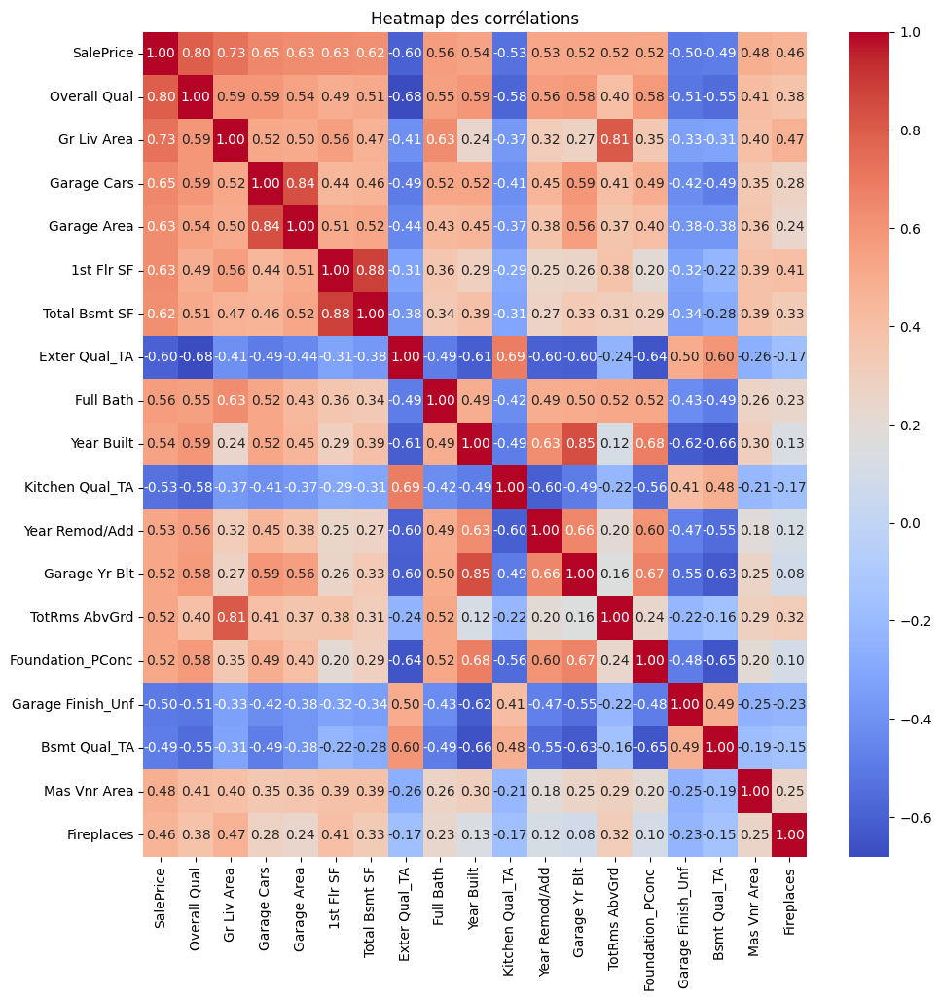

In [13]:
# Filtre des variables dont la corrélation avec SalePrice est sup à +/-0.6
correlations_filtered = correlations[correlations.abs() > 0.45]

# Extraire les noms des variables
variables_to_plot = correlations_filtered.index

# Créer une matrice de corrélation pour ces variables
correlation_matrix_filtered = data_train_reg[variables_to_plot].corr()

# Création de la heatmap
plt.figure(figsize=(11, 11))
sns.heatmap(correlation_matrix_filtered, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Heatmap des corrélations')
plt.show()

## Modèles de regression

### Regression linéaire

In [14]:
# Fitting du modèle
LR = LinearRegression()
LR.fit(X_train, y_train_reg)

# Prédiction et évaluation
y_LR = LR.predict(X_test)
R2_LR = r2_score(y_test_reg, y_LR)
R2_ajuste_LR = R2_ajuste(y_test_reg, y_LR, X_test)
RMSE_LR = np.sqrt(mean_squared_error(y_test_reg, y_LR))

print("-- REGRESSION LINEAIRE --")
print(f"R2 : {R2_LR:.3f}")
print(f"R2 ajusté : {R2_ajuste_LR:.3f}")
print(f"RMSE : {RMSE_LR:.3f}")

-- REGRESSION LINEAIRE --
R2 : 0.853
R2 ajusté : 0.737
RMSE : 29769.019


-- COEFFICIENTS --


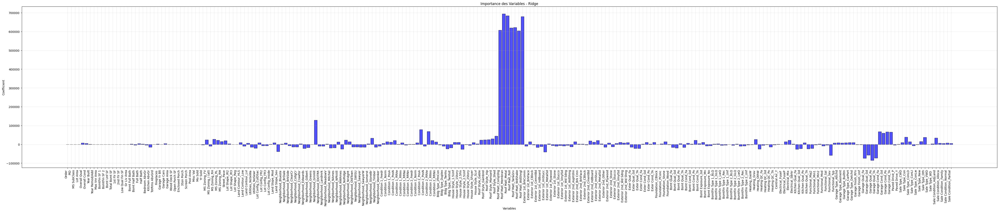

In [ ]:
# Coefficients
coefs_LR = pd.Series(LR.coef_, index=X_train.columns)
print("-- COEFFICIENTS --")
# print(coefs_LR)

plt.figure(figsize=(60, 10))
plt.bar(X_train.columns, coefs_LR, color="blue", alpha=0.7, edgecolor="k")
plt.title("Importance des Variables - Ridge")
plt.xlabel("Variables")
plt.ylabel("Coefficient")
plt.xticks(rotation=90, ha="right")
plt.grid(alpha=0.3)
plt.show()

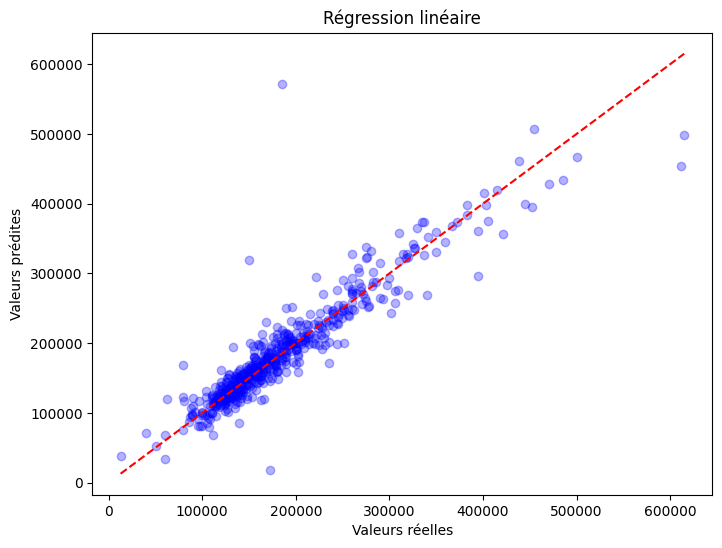

In [ ]:
# Visualisation des prédictions
plt.figure(figsize=(8, 6))
plt.scatter(y_test_reg, y_LR, color='blue', alpha=0.3)
plt.plot([y_test_reg.min(), y_test_reg.max()], [y_test_reg.min(), y_test_reg.max()], 'r--')
plt.xlabel('Valeurs réelles')
plt.ylabel('Valeurs prédites')
plt.title('Régression linéaire')
plt.show()

### Ridge

In [ ]:
# Hyperparamètres à tester
alpha = [0.1, 1, 5, 10]

# Fitting du modèle avec le nouveau paramètre store_cv_results
Ridge = RidgeCV(alphas=alpha, store_cv_results=True)
Ridge.fit(X_train, y_train_reg)

# Meilleur alpha
print("-- RIDGE --")
print(f"Meilleur alpha : {Ridge.alpha_}\n")

# Prédiction et évaluation
y_Ridge = Ridge.predict(X_test)
R2_ridge = r2_score(y_test_reg, y_Ridge)
R2_ajuste_ridge = R2_ajuste(y_test_reg, y_Ridge, X_test)
RMSE_ridge = np.sqrt(mean_squared_error(y_test_reg, y_Ridge))

print(f"R2 : {R2_ridge:.3f}")
print(f"R2 ajusté : {R2_ajuste_ridge:.3f}")
print(f"RMSE : {RMSE_ridge:.3f}")


-- RIDGE --
Meilleur alpha : 5.0

R2 : -1555127.422
R2 ajusté : -2782586.645
RMSE : 96857312.130


-- COEFFICIENTS RIDGE --


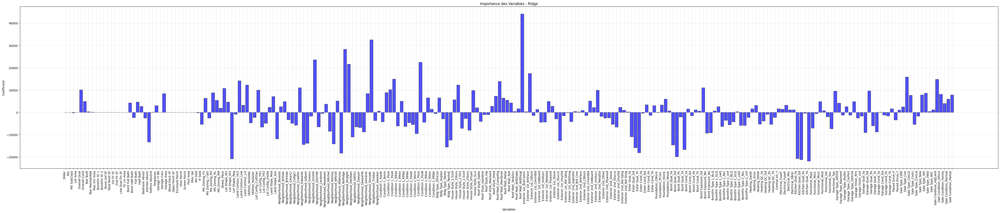

In [ ]:
# Coefficients associés
coefs_ridge = pd.Series(Ridge.coef_, index=X_train.columns)
print("-- COEFFICIENTS RIDGE --")
# print(coefs_ridge)

plt.figure(figsize=(60, 10))
plt.bar(X_train.columns, coefs_ridge, color="blue", alpha=0.7, edgecolor="k")
plt.title("Importance des Variables - Ridge")
plt.xlabel("Variables")
plt.ylabel("Coefficient")
plt.xticks(rotation=90, ha="right")
plt.grid(alpha=0.3)
plt.show()

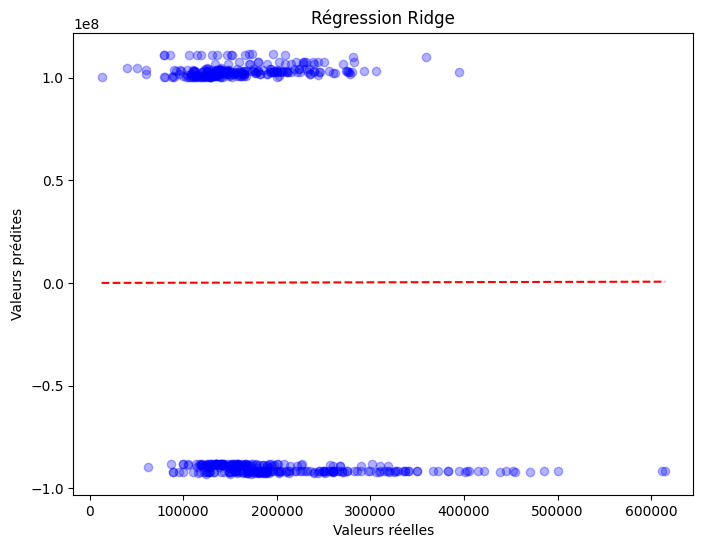

In [ ]:
# Visualisation des prédictions Ridge
plt.figure(figsize=(8, 6))
plt.scatter(y_test_reg, y_Ridge, color='blue', alpha=0.3)
plt.plot([y_test_reg.min(), y_test_reg.max()], [y_test_reg.min(), y_test_reg.max()], 'r--')
plt.xlabel('Valeurs réelles')
plt.ylabel('Valeurs prédites')
plt.title('Régression Ridge')
plt.show()

### Lasso

In [ ]:
# Hyperparamètres à tester
alpha = [0.1, 0.5, 1, 10, 25, 50, 75, 100]

# Fitting du modèle
Lasso = LassoCV(alphas=alpha, max_iter=15000, random_state=rs)
Lasso.fit(X_train, y_train_reg)

# Meilleur alpha
print("-- LASSO --")
print(f"Meilleur alpha : {Lasso.alpha_}\n")

# Prédiction et évaluation
y_lasso = Lasso.predict(X_test)
R2_lasso = r2_score(y_test_reg, y_lasso)
R2_ajuste_lasso = R2_ajuste(y_test_reg, y_lasso, X_test)
RMSE_lasso = np.sqrt(mean_squared_error(y_test_reg, y_lasso))

print(f"R2 : {R2_lasso:.3f}")
print(f"R2 ajusté : {R2_ajuste_lasso:.3f}")
print(f"RMSE : {RMSE_lasso:.3f}")

-- LASSO --
Meilleur alpha : 50.0

R2 : 0.854
R2 ajusté : 0.739
RMSE : 29660.891


-- COEFFICIENTS LASSO --


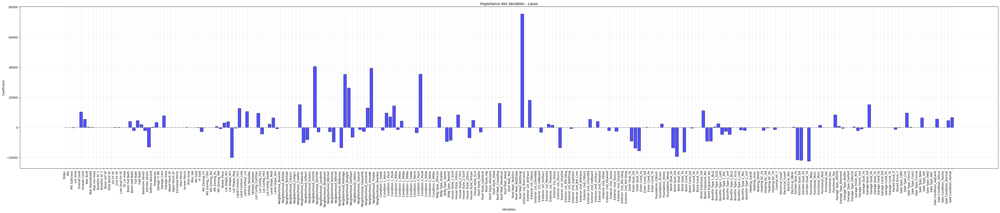

In [ ]:
# Coefficients
coefs_lasso = pd.Series(Lasso.coef_, index=X_train.columns)
print("-- COEFFICIENTS LASSO --")
# print(coefs_lasso)

plt.figure(figsize=(60, 10))
plt.bar(X_train.columns, coefs_lasso, color="blue", alpha=0.7, edgecolor="k")
plt.title("Importance des Variables - Lasso")
plt.xlabel("Variables")
plt.ylabel("Coefficient")
plt.xticks(rotation=90, ha="right")
plt.grid(alpha=0.3)
plt.show()


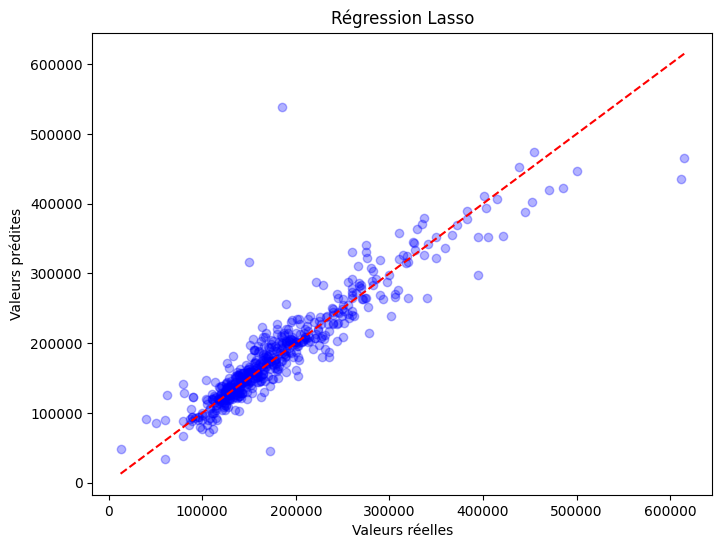

In [ ]:
# Visualisation des prédictions Lasso
plt.figure(figsize=(8, 6))
plt.scatter(y_test_reg, y_lasso, color='blue', alpha=0.3)
plt.plot([y_test_reg.min(), y_test_reg.max()], [y_test_reg.min(), y_test_reg.max()], 'r--')
plt.xlabel('Valeurs réelles')
plt.ylabel('Valeurs prédites')
plt.title('Régression Lasso')
plt.show()


### Arbre de décision

In [ ]:
# Création et entraînement du modèle
Tree_reg = DecisionTreeRegressor(random_state=rs)
Tree_reg.fit(X_train, y_train_reg)

# Prédiction et évaluation
y_tree = Tree_reg.predict(X_test)
R2_tree = r2_score(y_test_reg, y_tree)
R2_ajuste_tree = R2_ajuste(y_test_reg, y_tree, X_test)
RMSE_tree = np.sqrt(mean_squared_error(y_test_reg, y_tree))

print("-- ARBRE DE DECISION --")
print(f"R2 : {R2_tree:.3f}")
print(f"R2 ajusté : {R2_ajuste_tree:.3f}")
print(f"RMSE : {RMSE_tree:.3f}")

-- ARBRE DE DECISION --
R2 : 0.781
R2 ajusté : 0.608
RMSE : 36335.884


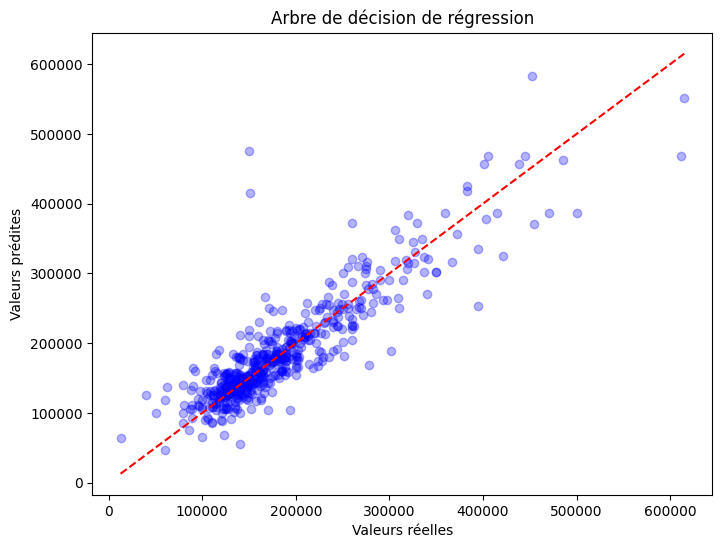

In [ ]:
# Visualisation des prédictions
plt.figure(figsize=(8, 6))
plt.scatter(y_test_reg, y_tree, color='blue', alpha=0.3)
plt.plot([y_test_reg.min(), y_test_reg.max()], [y_test_reg.min(), y_test_reg.max()], 'r--')
plt.xlabel('Valeurs réelles')
plt.ylabel('Valeurs prédites')
plt.title('Arbre de décision de régression')
plt.show()

### K plus proches voisins

In [ ]:
# Création et entraînement du modèle
knn_reg = KNeighborsRegressor(n_neighbors=5)
knn_reg.fit(X_train, y_train_reg)

# Prédiction et évaluation
y_knn = knn_reg.predict(X_test)
R2_knn = r2_score(y_test_reg, y_knn)
R2_ajuste_knn = R2_ajuste(y_test_reg, y_knn, X_test)
RMSE_knn = np.sqrt(mean_squared_error(y_test_reg, y_knn))

print("-- K PLUS PROCHES VOISINS --")
print(f"R2 : {R2_knn:.3f}")
print(f"R2 ajusté : {R2_ajuste_knn:.3f}")
print(f"RMSE : {RMSE_knn:.3f}")


-- K PLUS PROCHES VOISINS --
R2 : 0.689
R2 ajusté : 0.443
RMSE : 43331.544


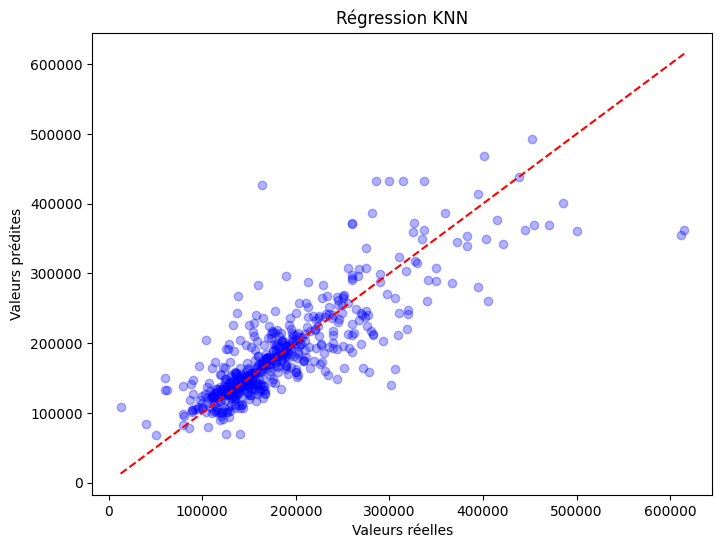

In [ ]:
# Visualisation des prédictions
plt.figure(figsize=(8, 6))
plt.scatter(y_test_reg, y_knn, color='blue', alpha=0.3)
plt.plot([y_test_reg.min(), y_test_reg.max()], [y_test_reg.min(), y_test_reg.max()], 'r--')
plt.xlabel('Valeurs réelles')
plt.ylabel('Valeurs prédites')
plt.title('Régression KNN')
plt.show()

### Machine à vecteurs de support

Les SVM étant couteux en terme de temps d'exécution, nous ne ferons pas de GridSearch et nous utiliserons simplement un kernel rbf car, il est relativement bon pour tous les types de données.

Pour notre regression, étant donné la complexité du modèle, on peut s'attendre à ce que le C soit très grand mais, on ne s'attend pas à des résultats corrects quoiqu'il en soit donc on se limitera à C = 1000.


In [ ]:
# Création et entraînement du modèle SVR
param_grid = {
    'C': [1000],
    'gamma': [0.01, 0.1, 1],
    'kernel': ['rbf']
}

# Recherche des meilleurs hyperparamètres
grid_search = GridSearchCV(SVR(), param_grid, cv=5, scoring='r2')
grid_search.fit(X_train, y_train_reg)
print(f"Meilleurs hyperparamètres : {grid_search.best_params_}")

# Utilisation des meilleurs hyperparamètres pour le modèle final
SVR = grid_search.best_estimator_
SVR.fit(X_train, y_train_reg)

# Prédiction et évaluation
y_svr = SVR.predict(X_test)
R2_svr = r2_score(y_test_reg, y_svr)
R2_ajuste_svr = R2_ajuste(y_test_reg, y_svr, X_test)
RMSE_svr = np.sqrt(mean_squared_error(y_test_reg, y_svr))

print("-- SVM REGRESSION --")
print(f"R2 : {R2_svr:.3f}")
print(f"R2 ajusté : {R2_ajuste_svr:.3f}")
print(f"RMSE : {RMSE_svr:.3f}")


Meilleurs hyperparamètres : {'C': 1000, 'gamma': 0.1, 'kernel': 'rbf'}
-- SVM REGRESSION --
R2 : -0.046
R2 ajusté : -0.871
RMSE : 79424.098


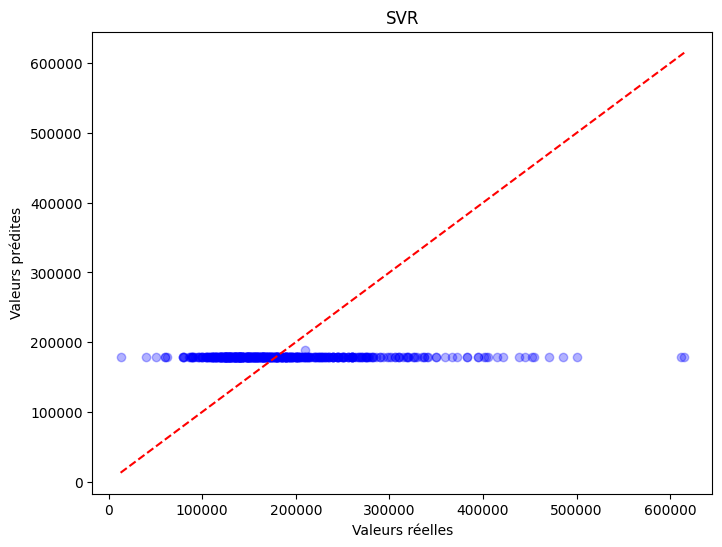

In [ ]:
# Visualisation des prédictions SVR
plt.figure(figsize=(8, 6))
plt.scatter(y_test_reg, y_svr, color='blue', alpha=0.3)
plt.plot([y_test_reg.min(), y_test_reg.max()], [y_test_reg.min(), y_test_reg.max()], 'r--')
plt.xlabel('Valeurs réelles')
plt.ylabel('Valeurs prédites')
plt.title('SVR')
plt.show()

### Adaboost

In [ ]:
# Définir la grille d'hyperparamètres
param_grid = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.001, 0.1, 0.5, 1]
}

# Utiliser GridSearchCV pour trouver les meilleurs hyperparamètres
grid_search = GridSearchCV(estimator=AdaBoostRegressor(random_state=rs), param_grid=param_grid, cv=5, scoring='r2')
grid_search.fit(X_train, y_train_reg)

# Afficher les meilleurs hyperparamètres
print("-- ADA BOOST --")
print(f"Meilleurs paramètres : {grid_search.best_params_}")

# Utiliser les meilleurs hyperparamètres pour le modèle final
ADA = grid_search.best_estimator_

# Prédiction et évaluation
y_ada = ADA.predict(X_test)
R2_ada = r2_score(y_test_reg, y_ada)
R2_ajuste_ada = R2_ajuste(y_test_reg, y_ada, X_test)
RMSE_ada = np.sqrt(mean_squared_error(y_test_reg, y_ada))

print(f"R2 : {R2_ada:.3f}")
print(f"R2 ajusté : {R2_ajuste_ada:.3f}")
print(f"RMSE : {RMSE_ada:.3f}")

-- ADA BOOST --
Meilleurs paramètres : {'learning_rate': 0.1, 'n_estimators': 200}
R2 : 0.834
R2 ajusté : 0.703
RMSE : 31630.632


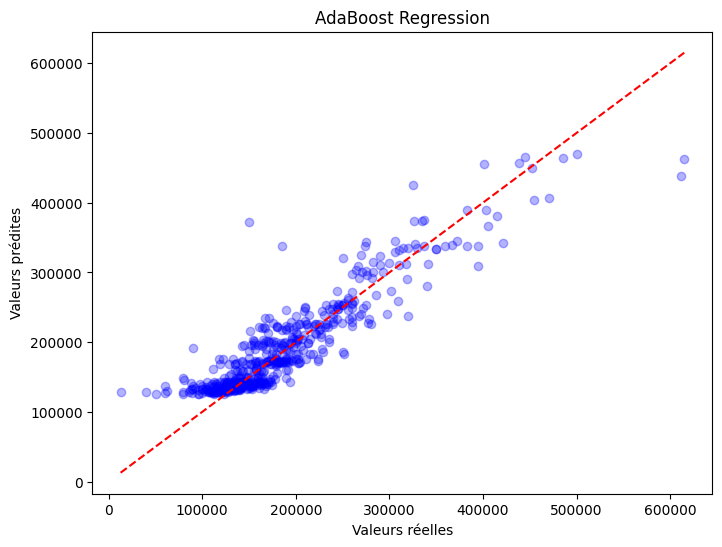

In [ ]:
# Affichage des prédictions contre les valeurs réelles
plt.figure(figsize=(8, 6))
plt.scatter(y_test_reg, y_ada, color='blue', alpha=0.3)
plt.plot([y_test_reg.min(), y_test_reg.max()], [y_test_reg.min(), y_test_reg.max()], 'r--')
plt.xlabel('Valeurs réelles')
plt.ylabel('Valeurs prédites')
plt.title('AdaBoost Regression')
plt.show()

### Gradient boosting

In [ ]:
# Définir la grille d'hyperparamètres
param_grid = {
    'n_estimators': [100, 250, 500],
    'learning_rate': [0.01, 0.1, 0.5],
    'max_depth': [1, 3, 5]
}

# Utiliser GridSearchCV pour trouver les meilleurs hyperparamètres
grid_search = GridSearchCV(estimator=GradientBoostingRegressor(random_state=rs), param_grid=param_grid, cv=5, scoring='r2')
grid_search.fit(X_train, y_train_reg)

# Afficher les meilleurs hyperparamètres
print("-- GRADIENT BOOSTING --")
print(f"Meilleurs paramètres : {grid_search.best_params_}")

# Utiliser les meilleurs hyperparamètres pour le modèle final
GB = grid_search.best_estimator_

# Prédiction et évaluation
y_gb = GB.predict(X_test)
R2_gb = r2_score(y_test_reg, y_gb)
R2_ajuste_gb = R2_ajuste(y_test_reg, y_gb, X_test)
RMSE_gb = np.sqrt(mean_squared_error(y_test_reg, y_gb))

print(f"R2 : {R2_gb:.3f}")
print(f"R2 ajusté : {R2_ajuste_gb:.3f}")
print(f"RMSE : {RMSE_gb:.3f}")

-- GRADIENT BOOSTING --
Meilleurs paramètres : {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 500}
R2 : 0.890
R2 ajusté : 0.802
RMSE : 25813.637


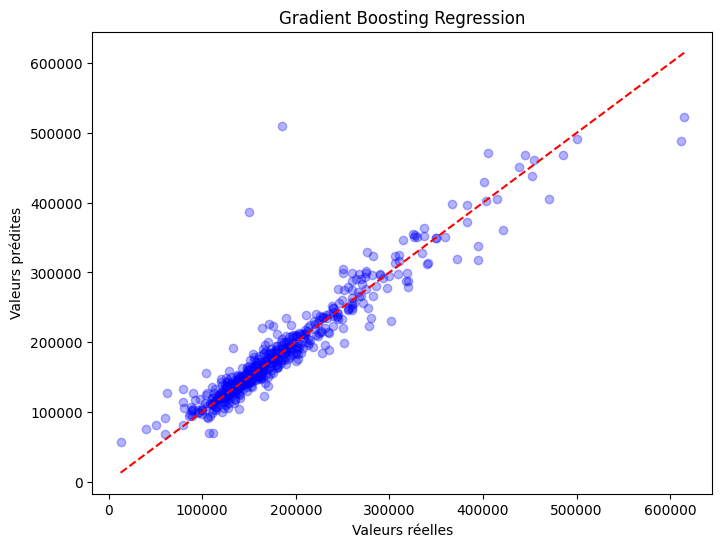

In [ ]:
# Affichage des prédictions contre les valeurs réelles
plt.figure(figsize=(8, 6))
plt.scatter(y_test_reg, y_gb, color='blue', alpha=0.3)
plt.plot([y_test_reg.min(), y_test_reg.max()], [y_test_reg.min(), y_test_reg.max()], 'r--')
plt.xlabel('Valeurs réelles')
plt.ylabel('Valeurs prédites')
plt.title('Gradient Boosting Regression')
plt.show()

### XGBoosting

In [ ]:
# Définir la grille d'hyperparamètres
param_grid = {
    'n_estimators': [100, 250, 500],
    'learning_rate': [0.01, 0.1, 0.5],
    'max_depth': [3, 5, 7]
}

# Utiliser GridSearchCV pour trouver les meilleurs hyperparamètres
grid_search = GridSearchCV(estimator=XGBRegressor(random_state=rs), param_grid=param_grid, cv=5, scoring='r2')
grid_search.fit(X_train, y_train_reg)

# Afficher les meilleurs hyperparamètres
print("-- XGBOOST --")
print(f"Meilleurs paramètres : {grid_search.best_params_}")

# Utiliser les meilleurs hyperparamètres pour le modèle final
XGB = grid_search.best_estimator_

# Prédiction et évaluation
y_xgb = XGB.predict(X_test)
R2_xgb = r2_score(y_test_reg, y_xgb)
R2_ajuste_xgb = R2_ajuste(y_test_reg, y_xgb, X_test)
RMSE_xgb = np.sqrt(mean_squared_error(y_test_reg, y_xgb))

print(f"R2 : {R2_xgb:.3f}")
print(f"R2 ajusté : {R2_ajuste_xgb:.3f}")
print(f"RMSE : {RMSE_xgb:.3f}")


-- XGBOOST --
Meilleurs paramètres : {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 500}
R2 : 0.898
R2 ajusté : 0.817
RMSE : 24814.129


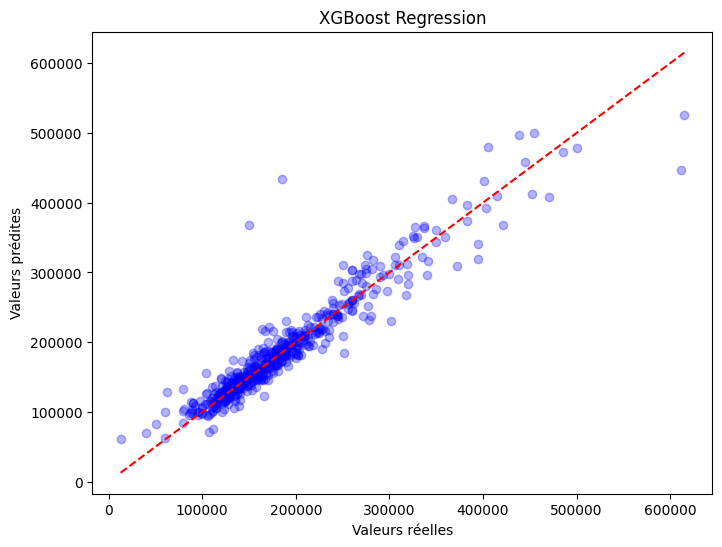

In [ ]:

# Affichage des prédictions contre les valeurs réelles
plt.figure(figsize=(8, 6))
plt.scatter(y_test_reg, y_xgb, color='blue', alpha=0.3)
plt.plot([y_test_reg.min(), y_test_reg.max()], [y_test_reg.min(), y_test_reg.max()], 'r--')
plt.xlabel('Valeurs réelles')
plt.ylabel('Valeurs prédites')
plt.title('XGBoost Regression')
plt.show()

## Sélection du meilleur modèle

In [ ]:
# Résumé des métriques des modèles
metrics_reg = {
    'Modèle': ['Régression linéaire', 'Ridge', 'Lasso', 'Arbre de décision', 'KNN', 'SVR', 'AdaBoost', 'Gradient Boosting', 'XGBoost'],
    'R2': [R2_LR, R2_ridge, R2_lasso, R2_tree, R2_knn, R2_svr, R2_ada, R2_gb, R2_xgb],
    'R2 Adjusté': [R2_ajuste_LR, R2_ajuste_ridge, R2_ajuste_lasso, R2_ajuste_tree, R2_ajuste_knn, R2_ajuste_svr, R2_ajuste_ada, R2_ajuste_gb, R2_ajuste_xgb],
    'RMSE': [RMSE_LR, RMSE_ridge, RMSE_lasso, RMSE_tree, RMSE_knn, RMSE_svr, RMSE_ada, RMSE_gb, RMSE_xgb]
}

# Création du DataFrame
metrics_reg = pd.DataFrame(metrics_reg)

# Affichage du tableau
metrics_reg.round(3)

,Modèle,R2,R2 Adjusté,RMSE
0,Régression linéaire,0.853,0.737,2.976902e+04
1,Ridge,-1555127.422,-2782586.645,9.685731e+07
2,Lasso,0.854,0.739,2.966089e+04
3,Arbre de décision,0.781,0.608,3.633588e+04
4,KNN,0.689,0.443,4.333154e+04
5,SVR,-0.046,-0.871,7.942410e+04
6,AdaBoost,0.834,0.703,3.163063e+04
7,Gradient Boosting,0.890,0.802,2.581364e+04
8,XGBoost,0.898,0.817,2.481413e+04


VALDES : faire le mdl de regression lineaire + preprocess

# CLASSIFICATION

## Preprocessing

Pour assurer la qualité de nos modèles de classification, il nous faut au préalable standardisé nos données.

In [ ]:
# Standardisation des données
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

## Statistiques descriptives et exploratoires

In [ ]:
data_train_class = pd.DataFrame(X_train_scaled, columns=X_train.columns)
data_train_class['SalePrice'] = y_train_class.values

In [ ]:
data_train_class.describe().round(2)

,Order,PID,MS SubClass,Lot Area,Overall Qual,Overall Cond,Year Built,Year Remod/Add,Mas Vnr Area,BsmtFin SF 1,...,Sale Type_New,Sale Type_Oth,Sale Type_VWD,Sale Type_WD,Sale Condition_AdjLand,Sale Condition_Alloca,Sale Condition_Family,Sale Condition_Normal,Sale Condition_Partial,SalePrice
count,2142.00,2142.00,2142.00,2142.00,2142.00,2142.00,2142.00,2142.00,2142.00,2142.00,...,2142.0,2142.00,2142.00,2142.00,2142.00,2142.00,2142.00,2142.00,2142.00,2142.00
mean,0.00,-0.00,-0.00,-0.00,-0.00,0.00,0.00,0.00,0.00,0.00,...,0.0,-0.00,0.00,-0.00,-0.00,-0.00,-0.00,-0.00,0.00,0.51
std,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,...,1.0,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,0.50
min,-1.75,-0.96,-0.88,-1.14,-3.12,-4.27,-3.19,-1.73,-0.59,-1.01,...,-0.3,-0.03,-0.02,-2.54,-0.05,-0.07,-0.13,-2.20,-0.31,0.00
25%,-0.87,-0.95,-0.88,-0.34,-0.90,-0.56,-0.60,-0.90,-0.59,-1.01,...,-0.3,-0.03,-0.02,0.39,-0.05,-0.07,-0.13,0.45,-0.31,0.00
50%,0.02,-0.91,-0.16,-0.09,-0.16,-0.56,0.10,0.43,-0.59,-0.14,...,-0.3,-0.03,-0.02,0.39,-0.05,-0.07,-0.13,0.45,-0.31,1.00
75%,0.84,1.06,0.32,0.18,0.58,0.37,0.95,0.92,0.38,0.64,...,-0.3,-0.03,-0.02,0.39,-0.05,-0.07,-0.13,0.45,-0.31,1.00
max,1.75,1.59,3.20,26.05,2.80,3.15,1.25,1.21,8.23,11.21,...,3.3,32.71,46.27,0.39,20.67,13.92,7.76,0.45,3.25,1.00


Order vs SalePrice : -0.04


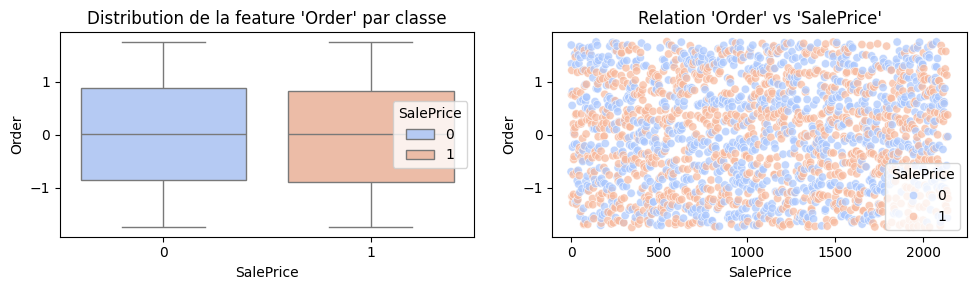

PID vs SalePrice : -0.18


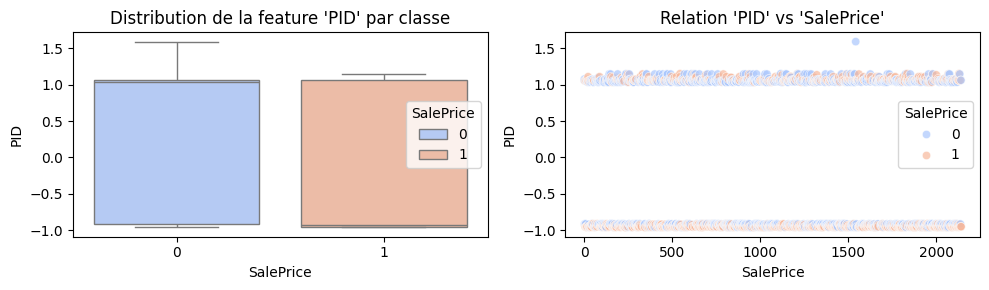

MS SubClass vs SalePrice : -0.01


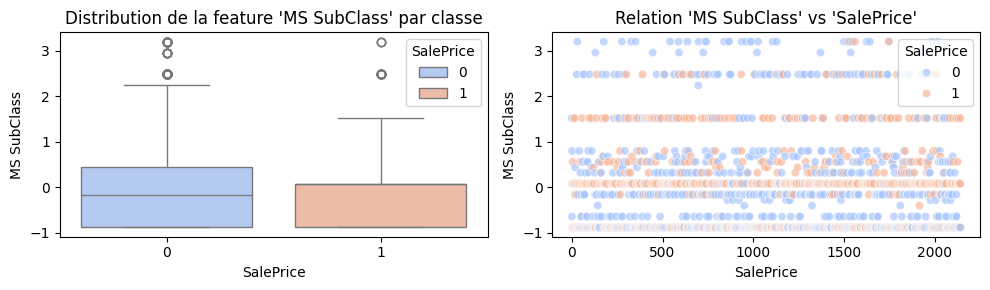

Lot Area vs SalePrice : 0.20


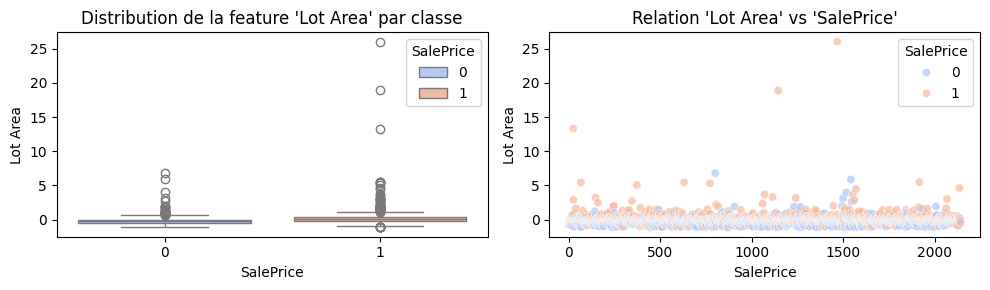

Overall Qual vs SalePrice : 0.68


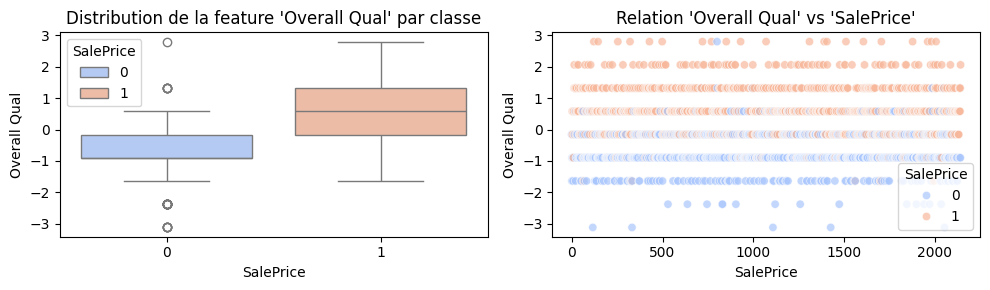

Overall Cond vs SalePrice : -0.19


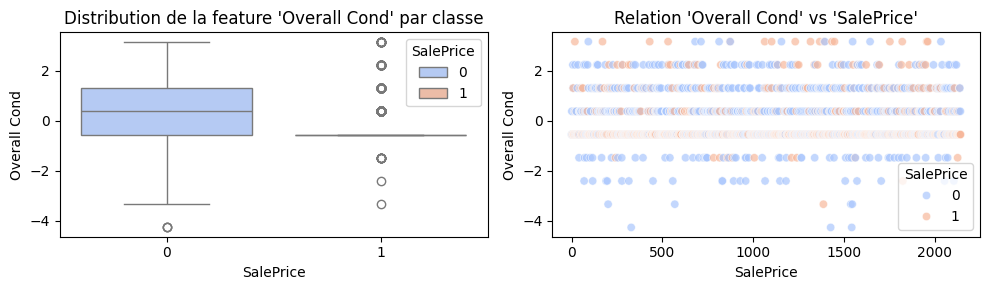

Year Built vs SalePrice : 0.59


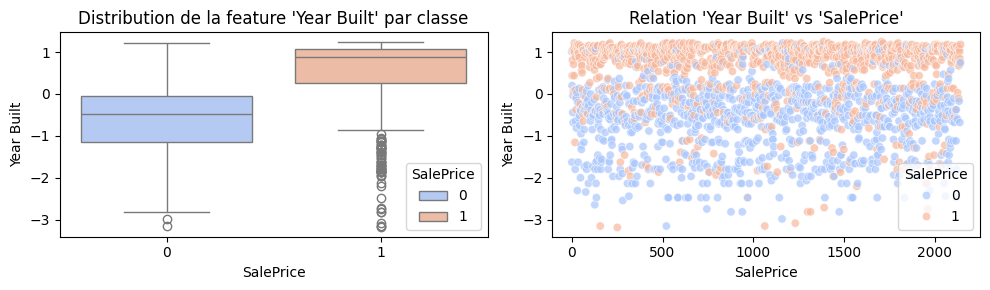

Year Remod/Add vs SalePrice : 0.56


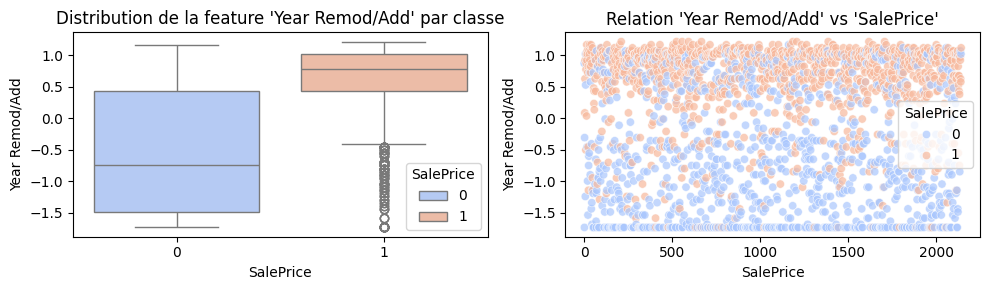

Mas Vnr Area vs SalePrice : 0.29


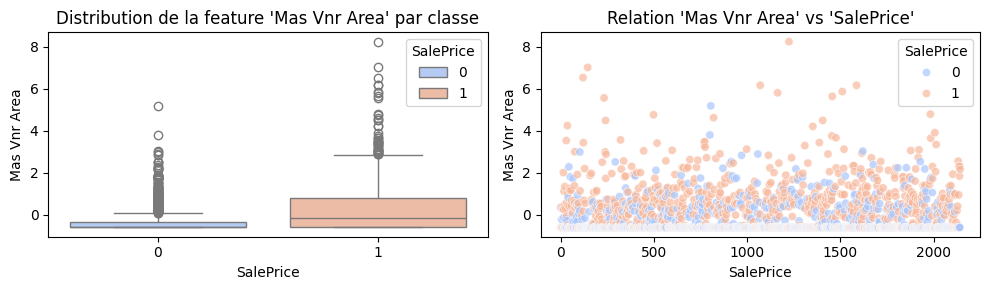

BsmtFin SF 1 vs SalePrice : 0.21


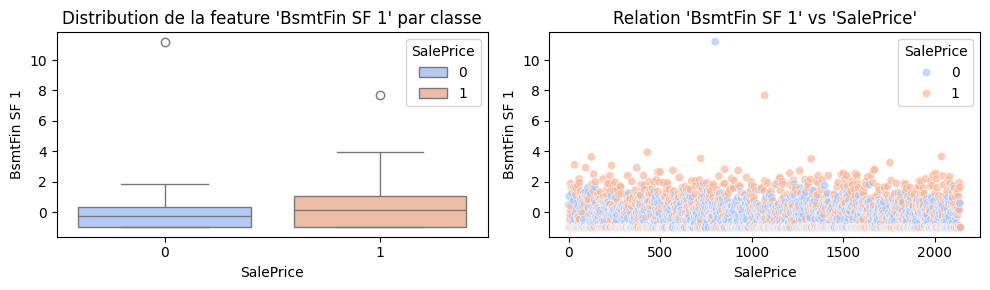

BsmtFin SF 2 vs SalePrice : -0.02


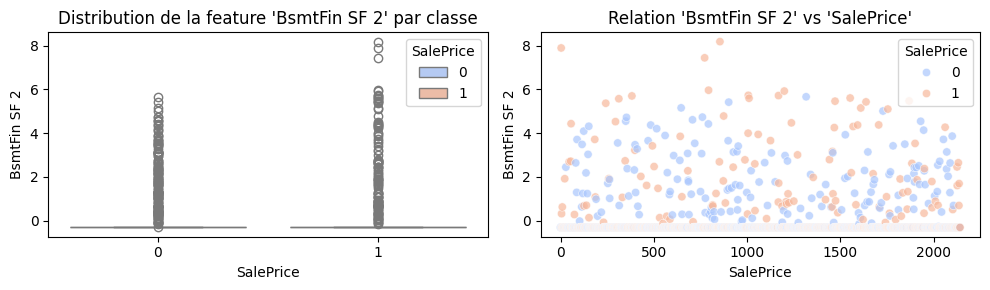

Bsmt Unf SF vs SalePrice : 0.20


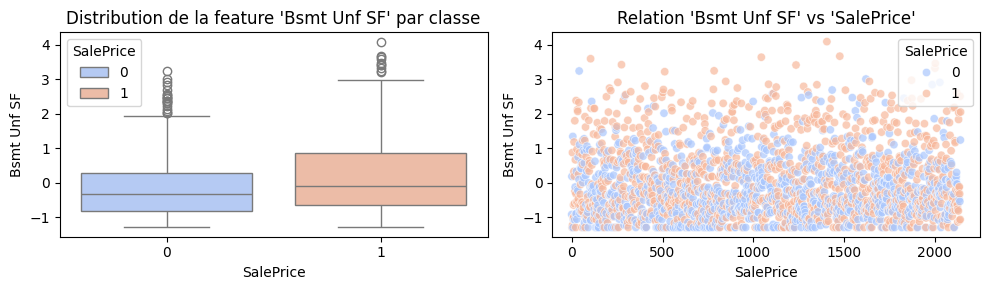

Total Bsmt SF vs SalePrice : 0.43


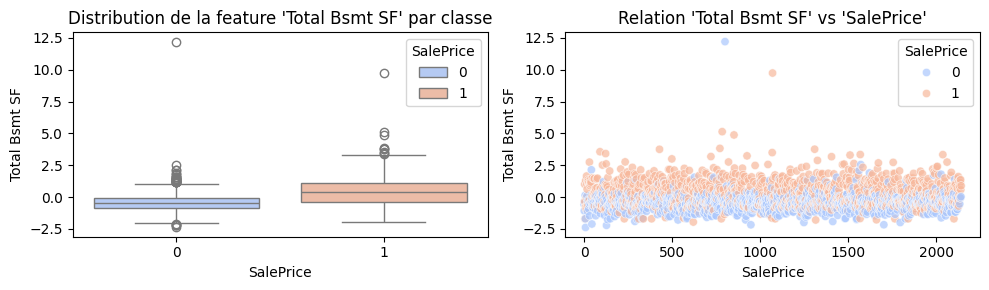

1st Flr SF vs SalePrice : 0.45


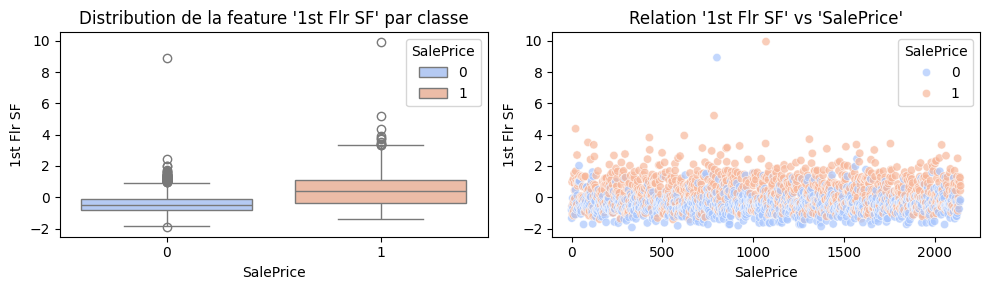

2nd Flr SF vs SalePrice : 0.29


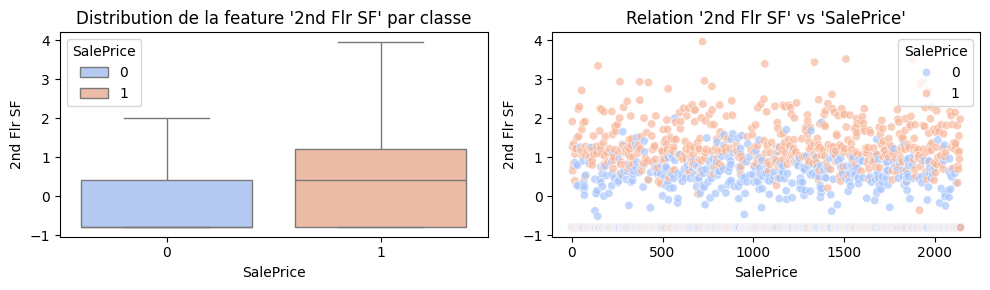

Low Qual Fin SF vs SalePrice : -0.04


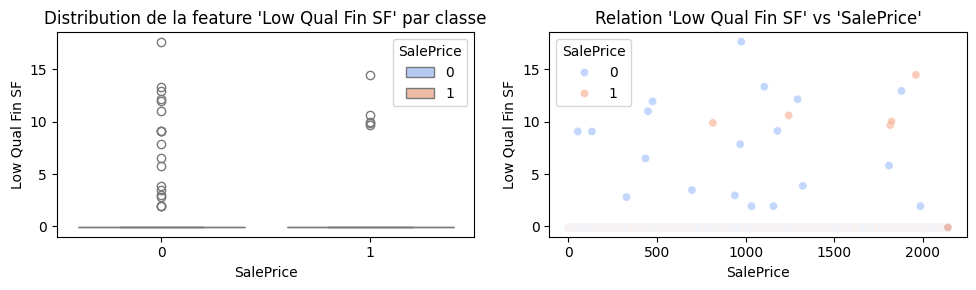

Gr Liv Area vs SalePrice : 0.59


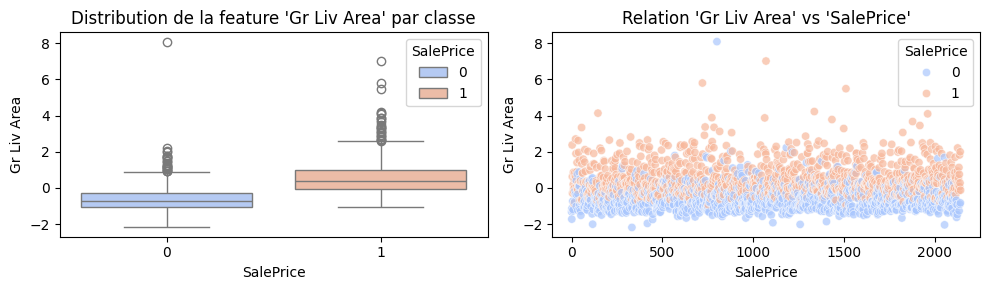

Bsmt Full Bath vs SalePrice : 0.13


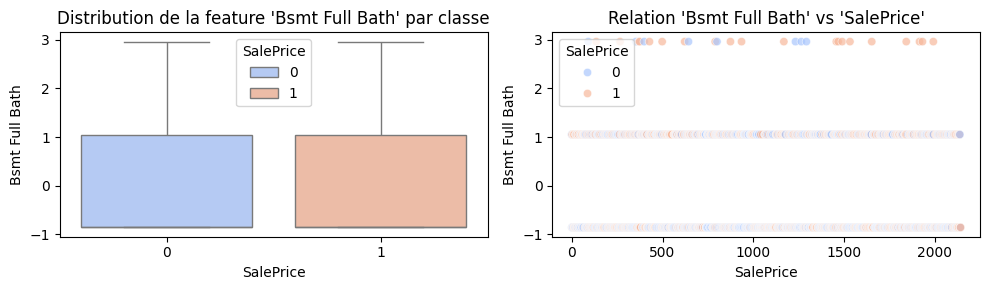

Bsmt Half Bath vs SalePrice : -0.03


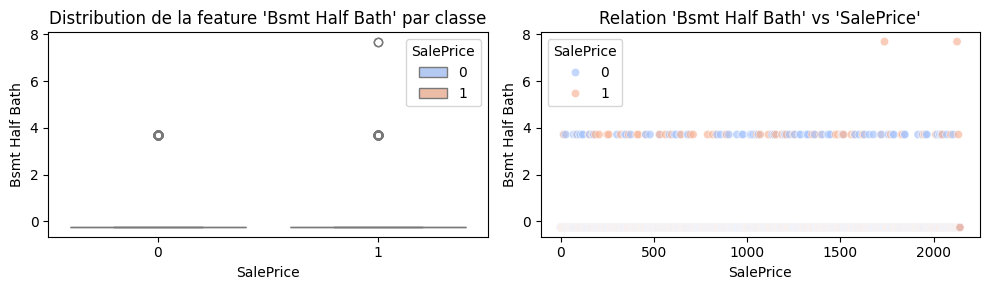

Full Bath vs SalePrice : 0.64


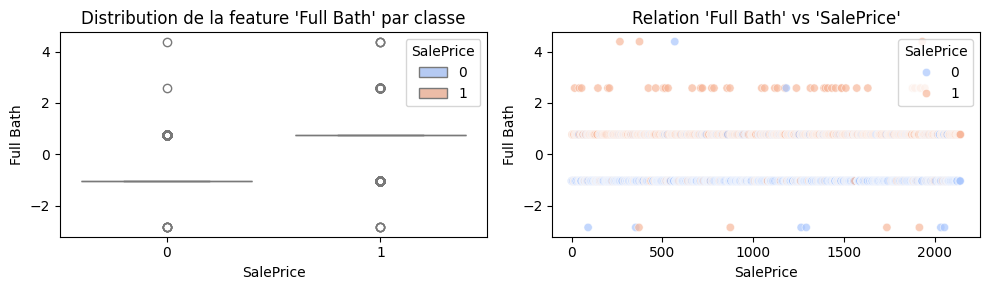

Half Bath vs SalePrice : 0.30


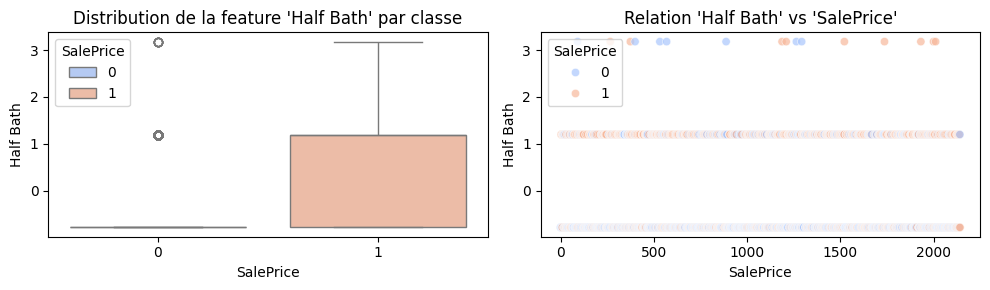

Bedroom AbvGr vs SalePrice : 0.14


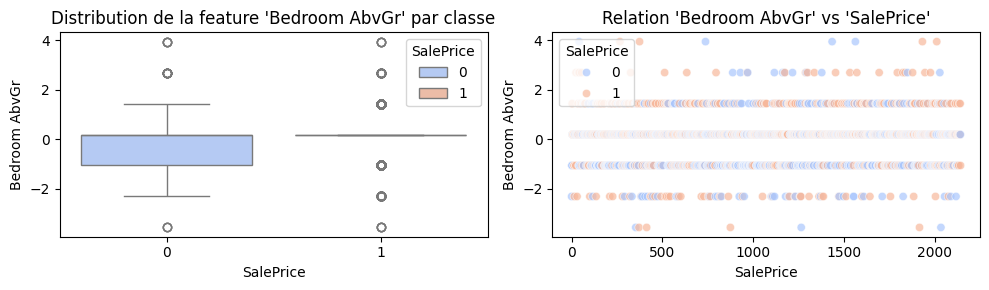

Kitchen AbvGr vs SalePrice : -0.09


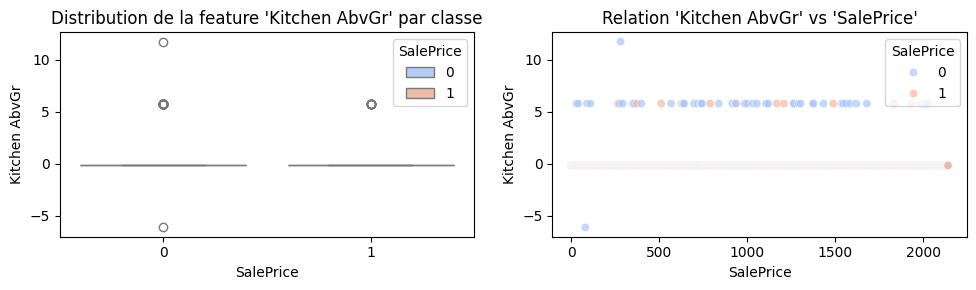

TotRms AbvGrd vs SalePrice : 0.42


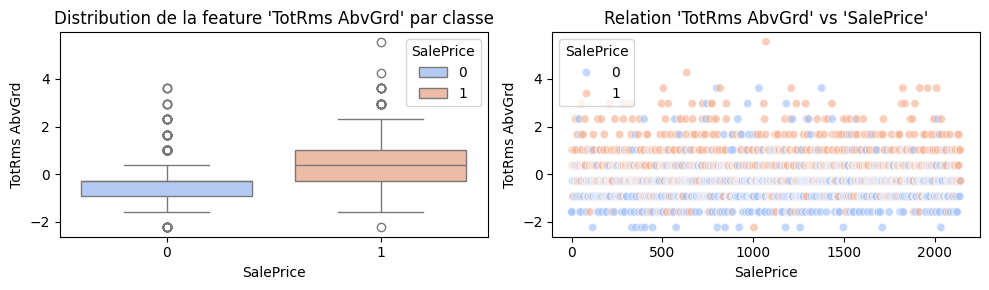

Fireplaces vs SalePrice : 0.39


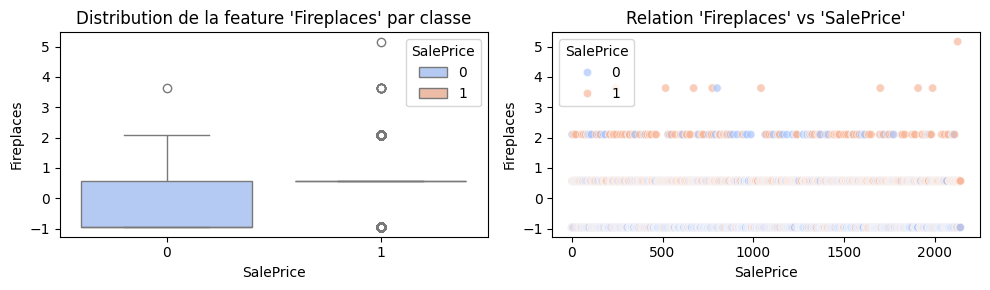

Garage Yr Blt vs SalePrice : 0.55


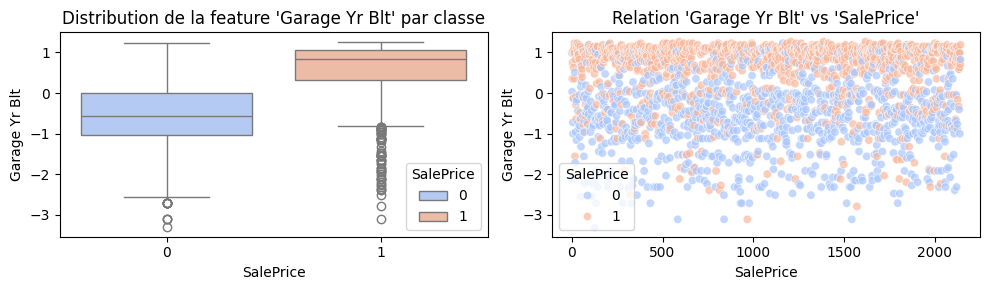

Garage Cars vs SalePrice : 0.57


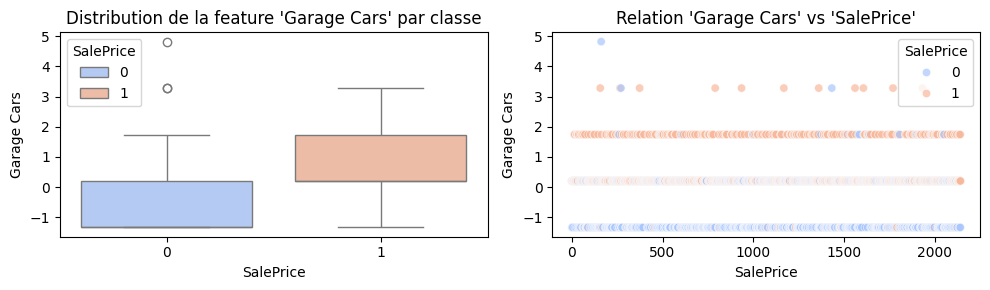

Garage Area vs SalePrice : 0.49


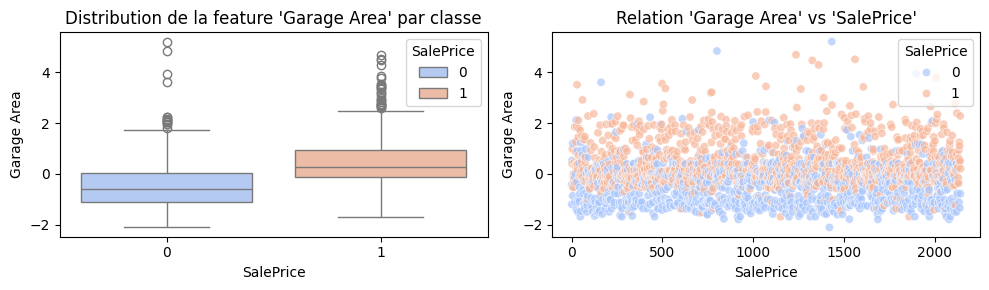

Wood Deck SF vs SalePrice : 0.27


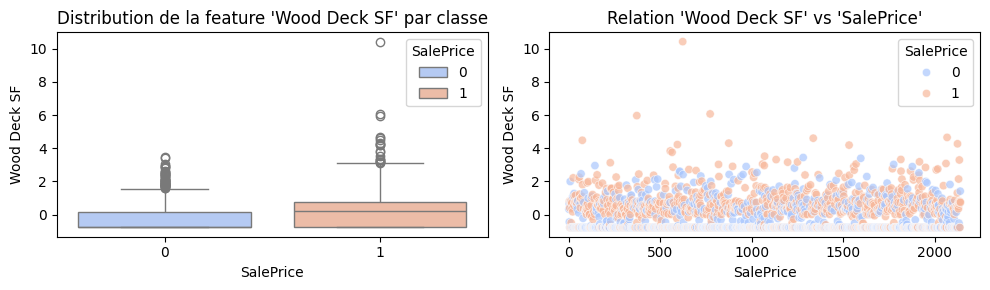

Open Porch SF vs SalePrice : 0.30


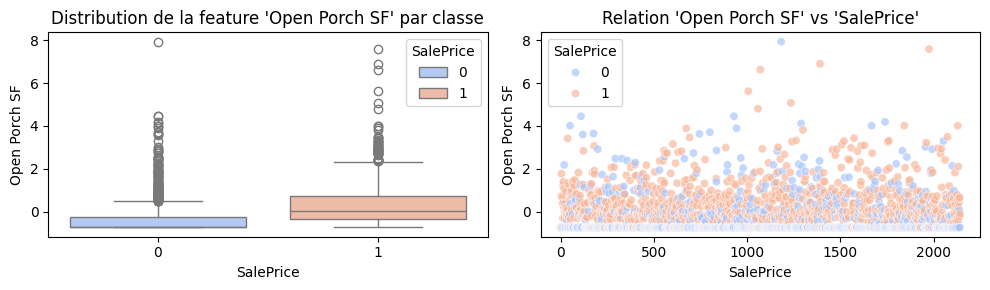

Enclosed Porch vs SalePrice : -0.13


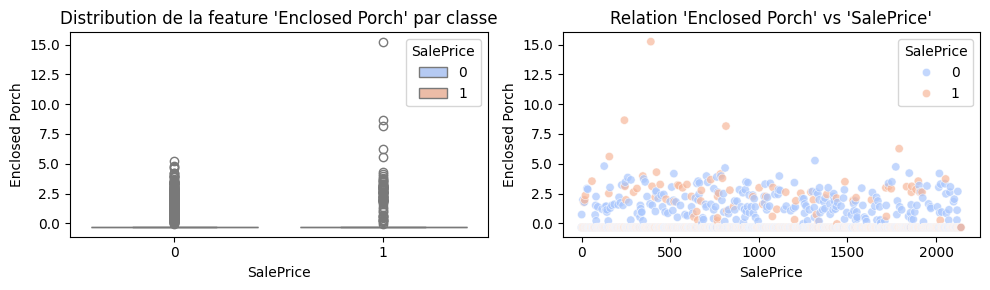

3Ssn Porch vs SalePrice : 0.03


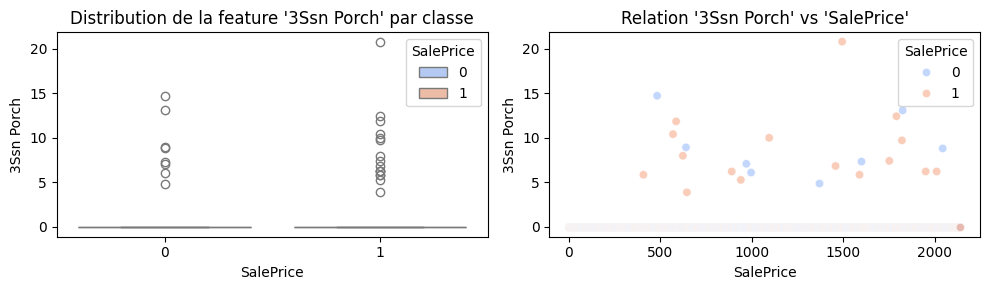

Screen Porch vs SalePrice : 0.05


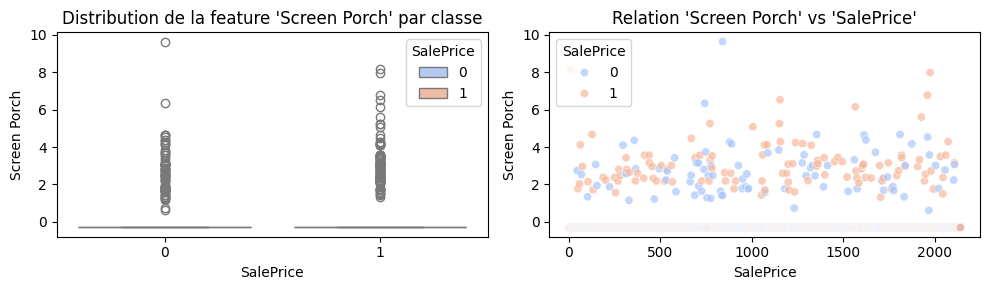

Pool Area vs SalePrice : 0.04


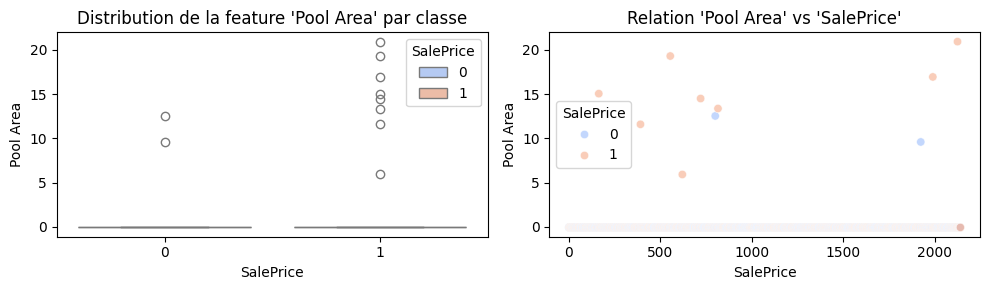

Misc Val vs SalePrice : 0.01


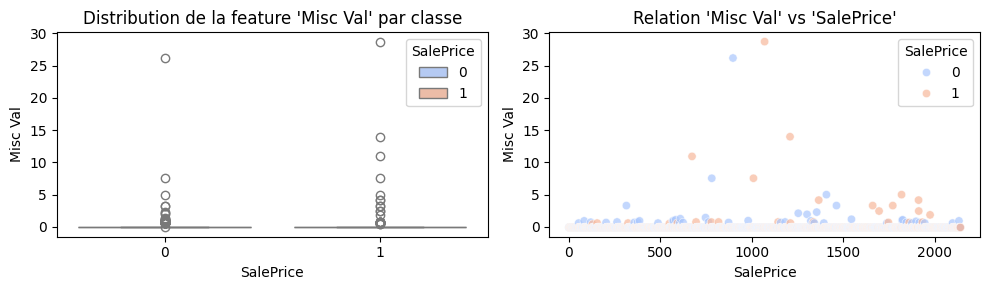

Mo Sold vs SalePrice : 0.03


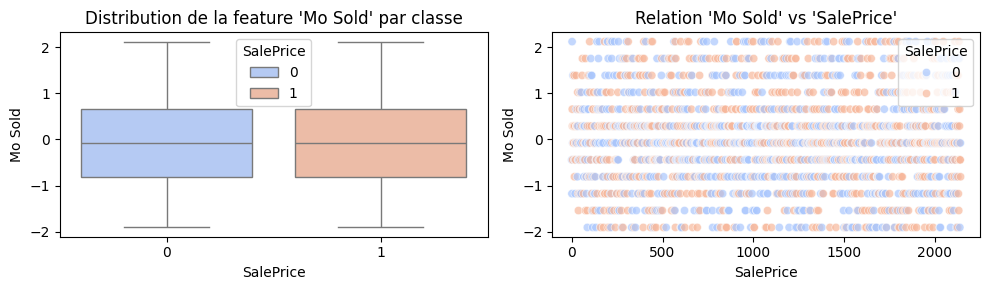

Yr Sold vs SalePrice : -0.00


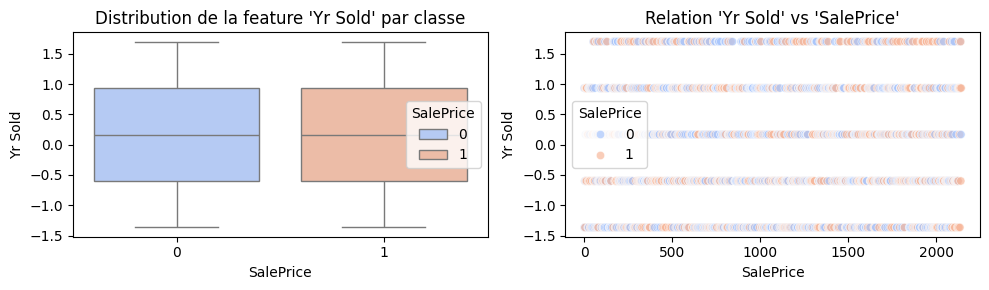

MS Zoning_FV vs SalePrice : 0.16


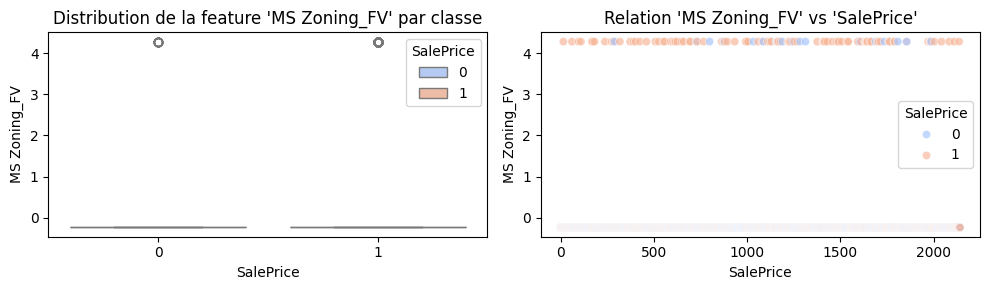

MS Zoning_I (all) vs SalePrice : -0.02


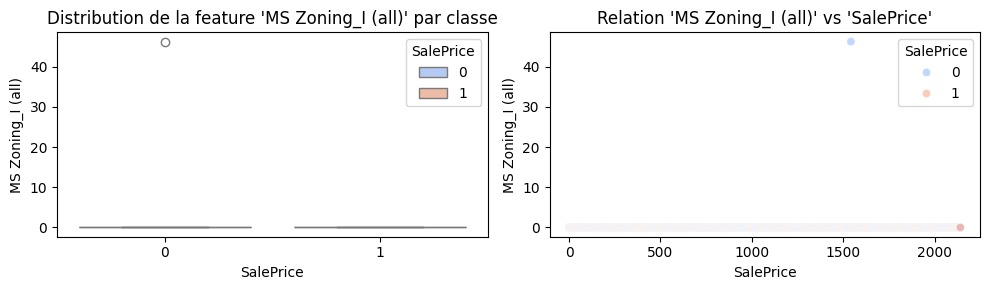

MS Zoning_RH vs SalePrice : -0.06


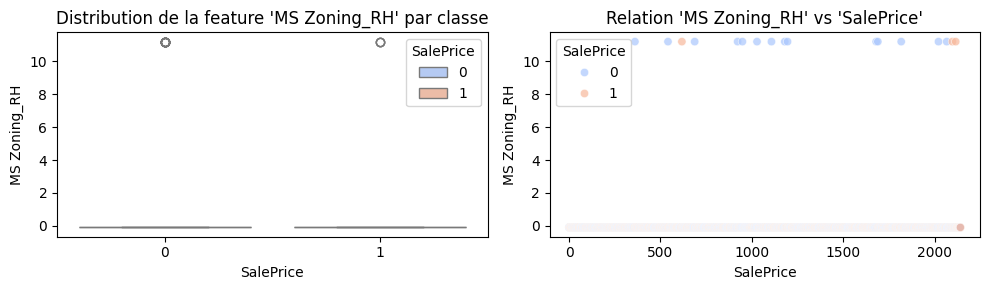

MS Zoning_RL vs SalePrice : 0.23


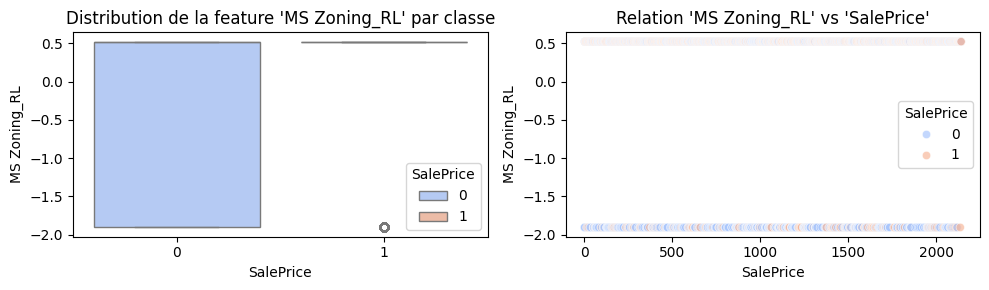

MS Zoning_RM vs SalePrice : -0.33


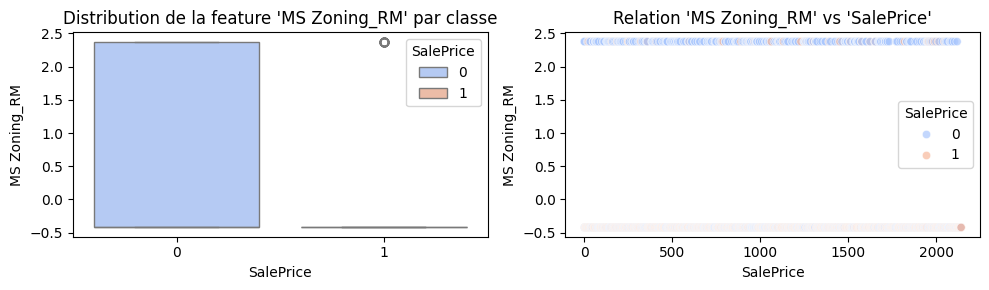

Street_Pave vs SalePrice : 0.04


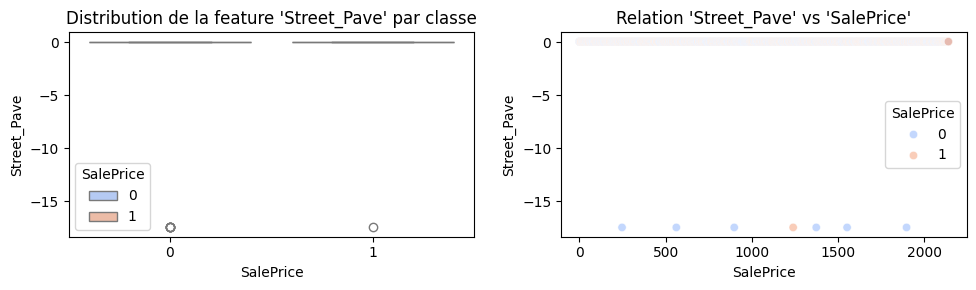

Lot Shape_IR2 vs SalePrice : 0.11


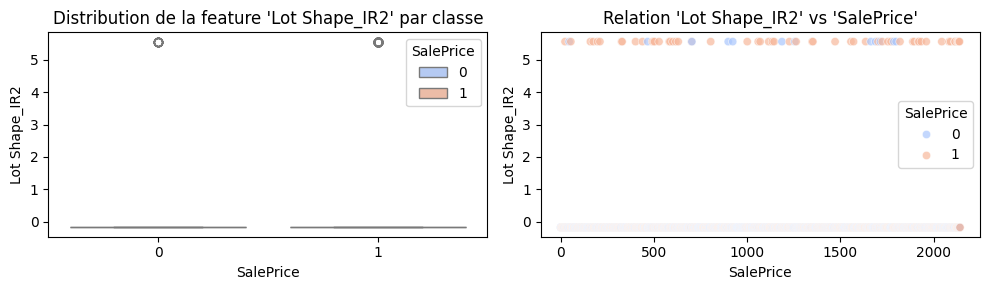

Lot Shape_IR3 vs SalePrice : 0.04


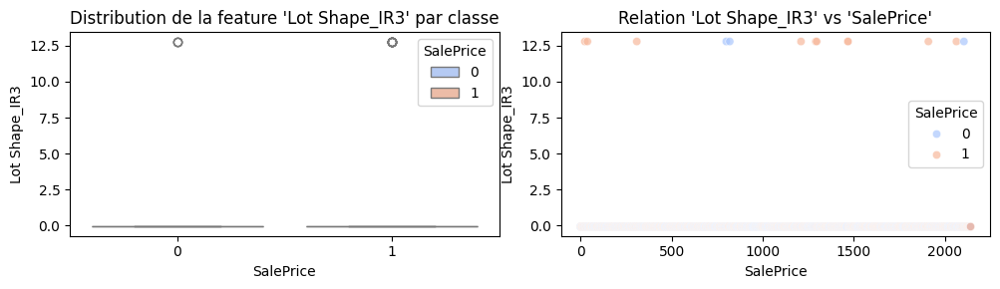

Lot Shape_Reg vs SalePrice : -0.31


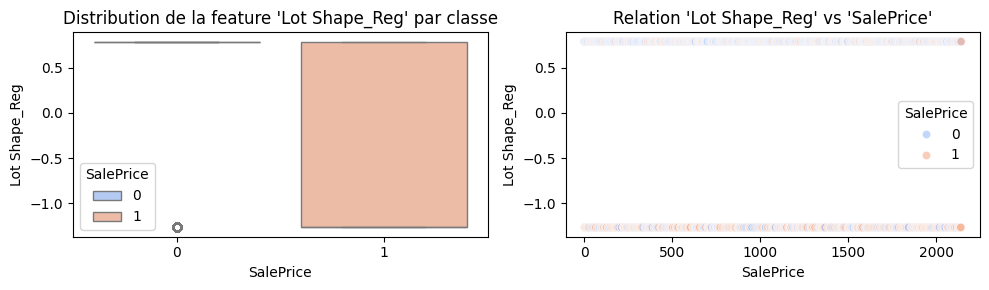

Land Contour_HLS vs SalePrice : 0.09


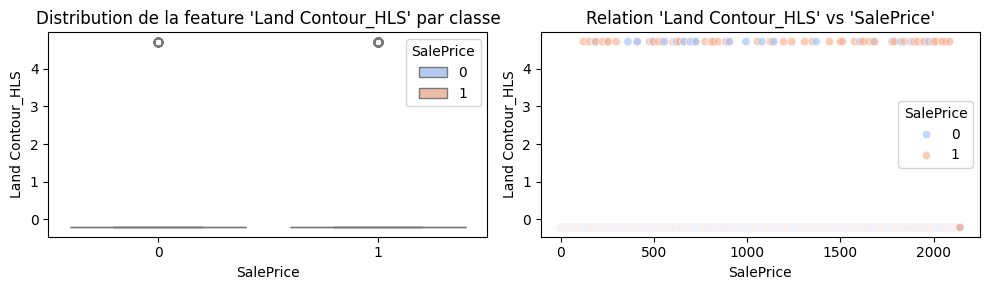

Land Contour_Low vs SalePrice : 0.04


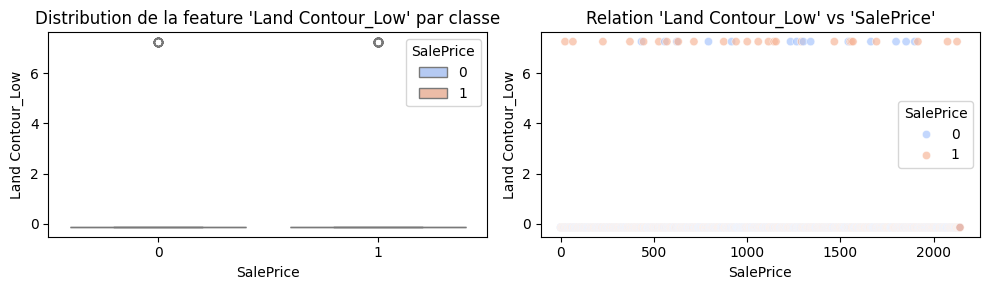

Land Contour_Lvl vs SalePrice : -0.04


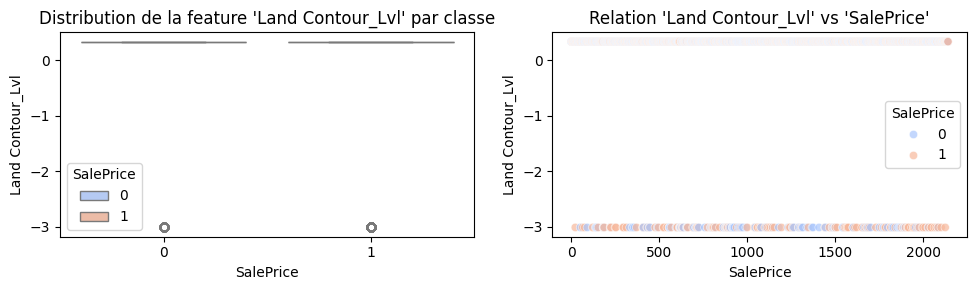

Utilities_NoSeWa vs SalePrice : -0.02


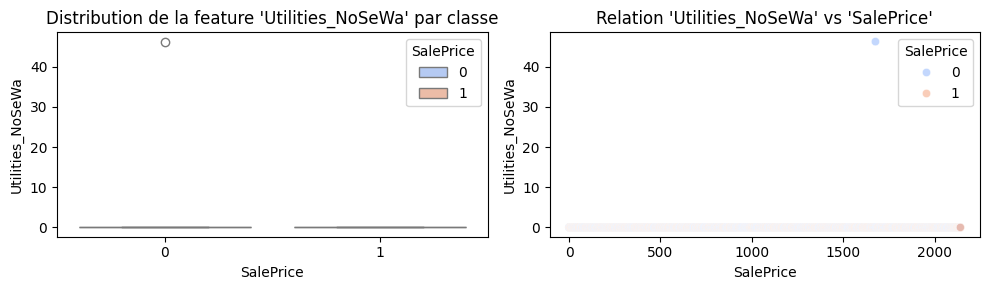

Utilities_NoSewr vs SalePrice : -0.02


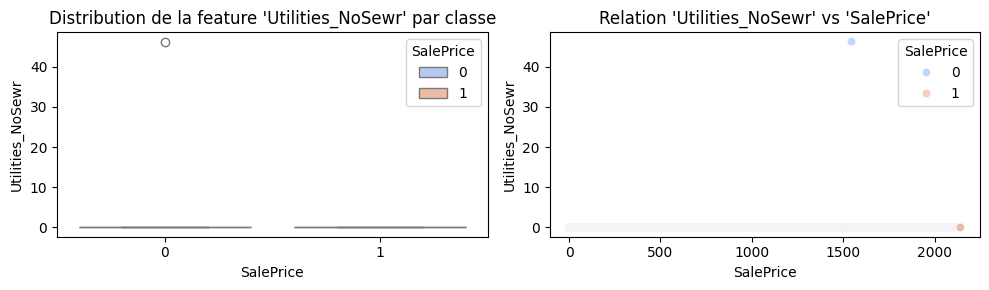

Lot Config_CulDSac vs SalePrice : 0.11


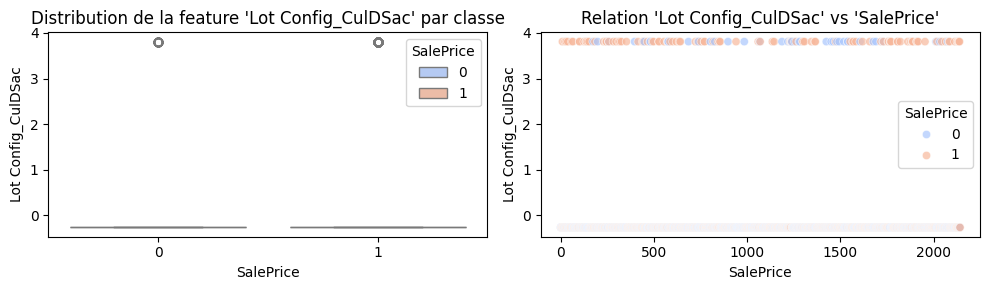

Lot Config_FR2 vs SalePrice : -0.01


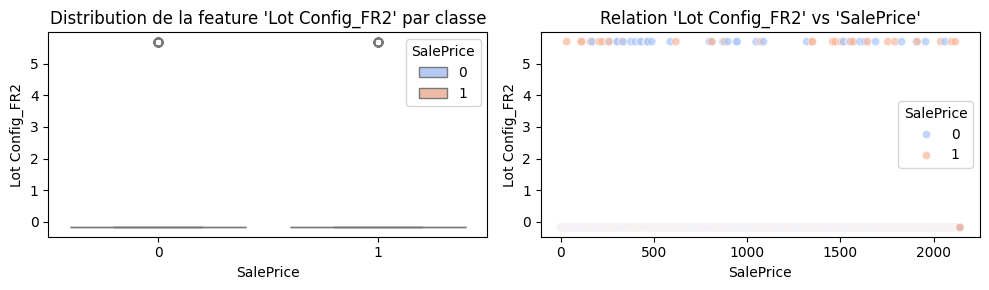

Lot Config_FR3 vs SalePrice : 0.02


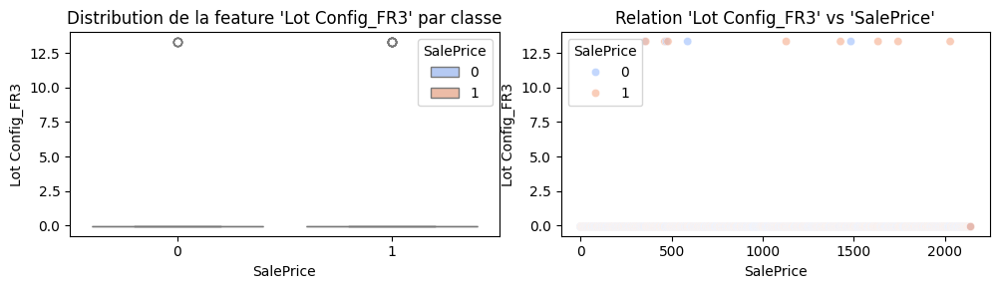

Lot Config_Inside vs SalePrice : -0.04


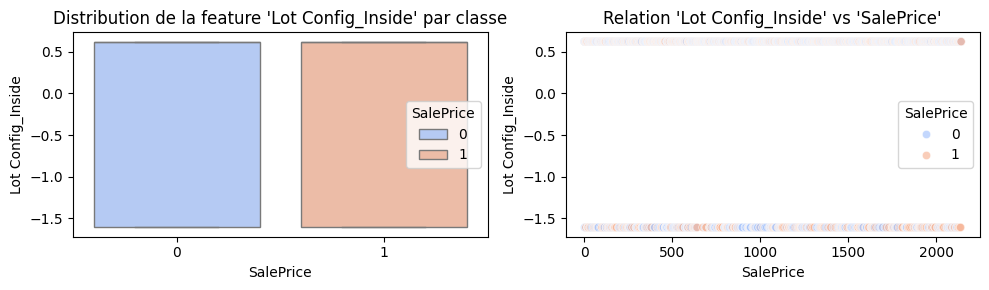

Land Slope_Mod vs SalePrice : 0.05


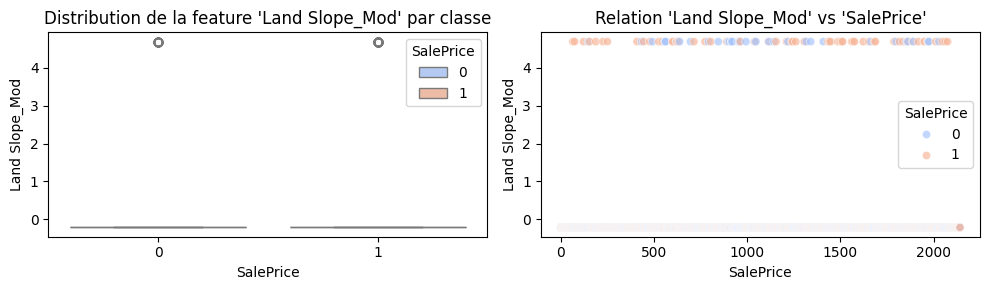

Land Slope_Sev vs SalePrice : 0.02


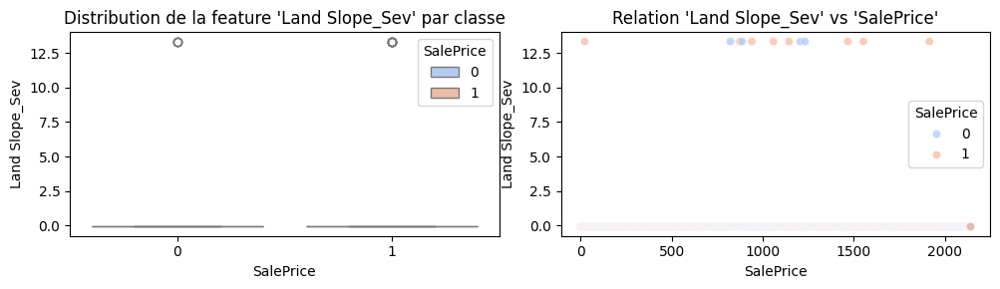

Neighborhood_Blueste vs SalePrice : -0.04


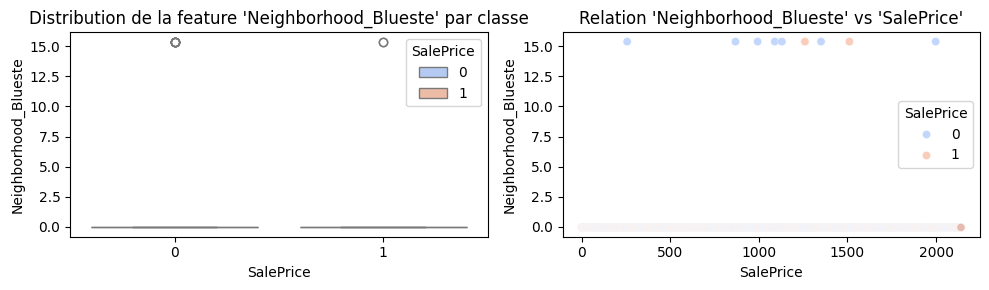

Neighborhood_BrDale vs SalePrice : -0.10


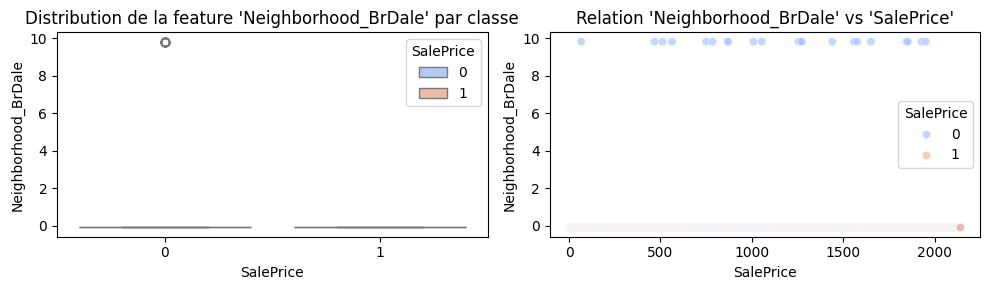

Neighborhood_BrkSide vs SalePrice : -0.15


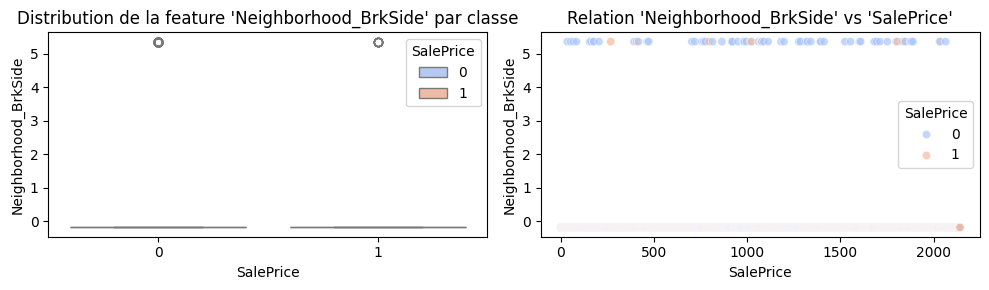

Neighborhood_ClearCr vs SalePrice : 0.06


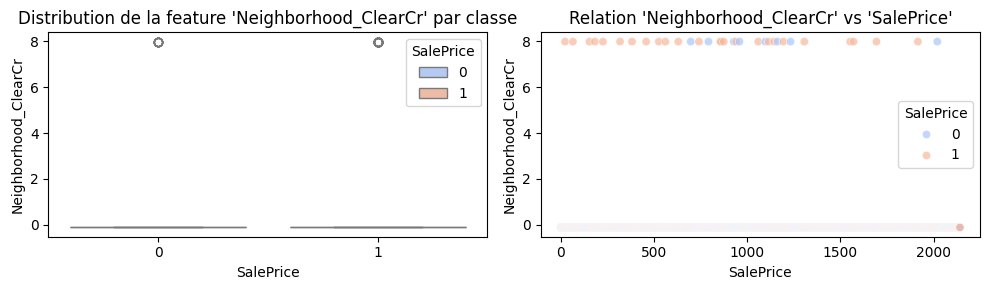

Neighborhood_CollgCr vs SalePrice : 0.16


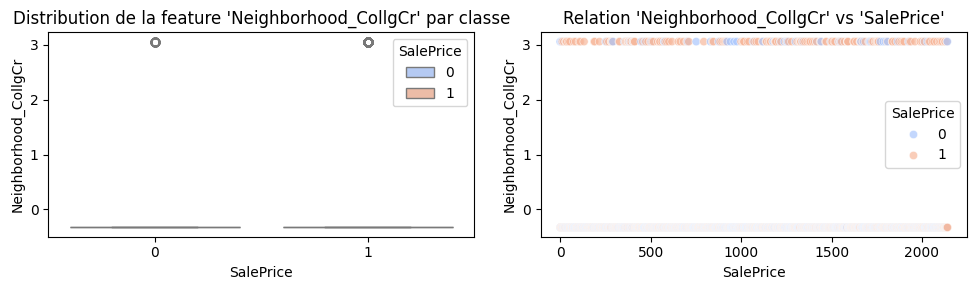

Neighborhood_Crawfor vs SalePrice : 0.08


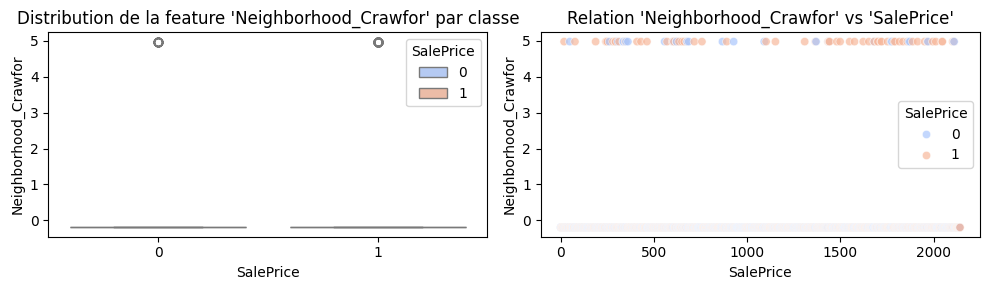

Neighborhood_Edwards vs SalePrice : -0.17


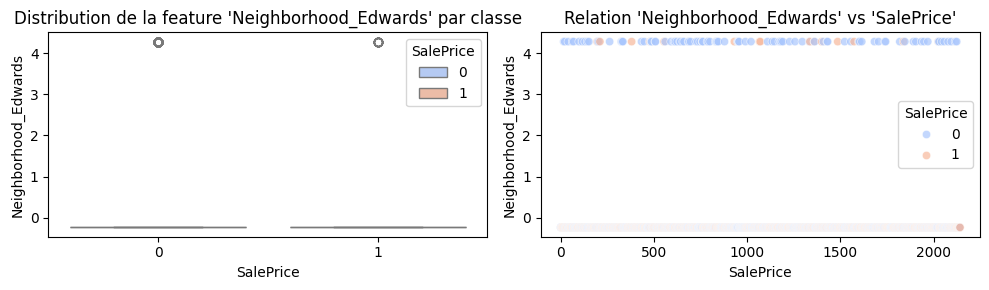

Neighborhood_Gilbert vs SalePrice : 0.19


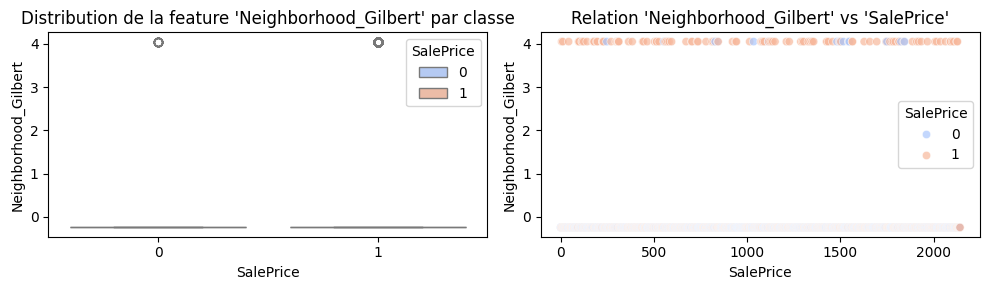

Neighborhood_Greens vs SalePrice : 0.04


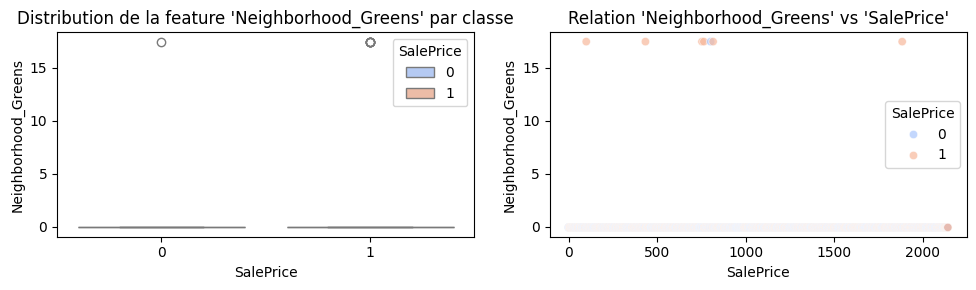

Neighborhood_GrnHill vs SalePrice : 0.02


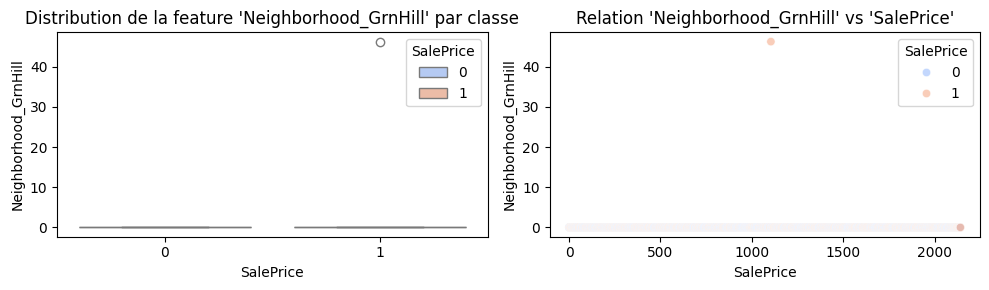

Neighborhood_IDOTRR vs SalePrice : -0.15


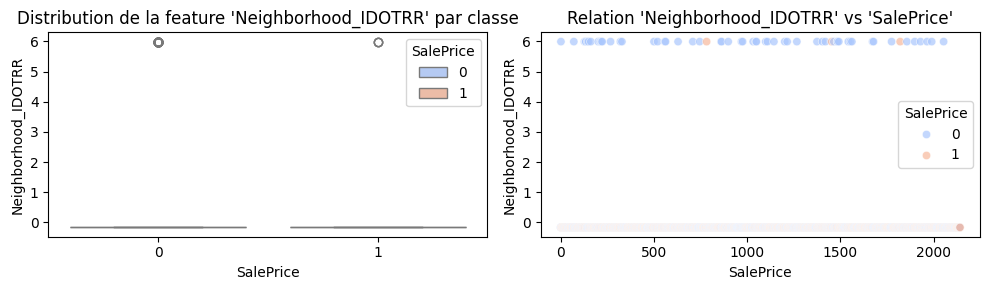

Neighborhood_Landmrk vs SalePrice : -0.02


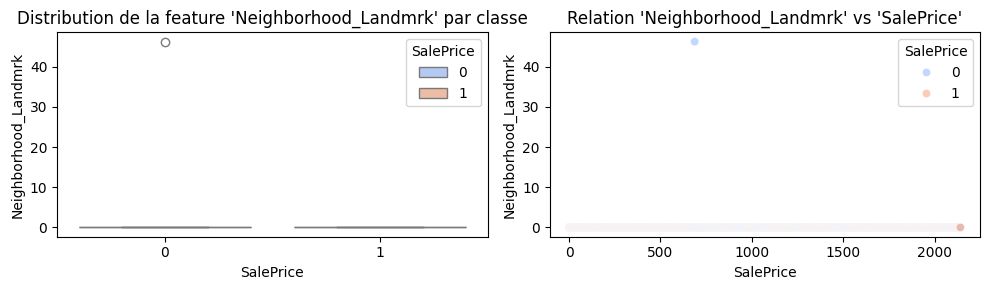

Neighborhood_MeadowV vs SalePrice : -0.10


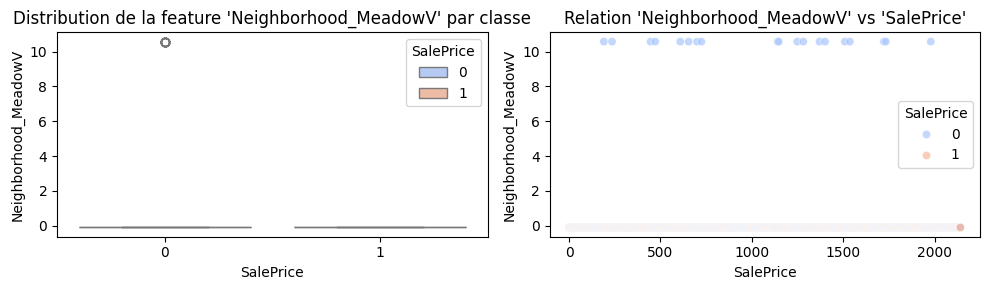

Neighborhood_Mitchel vs SalePrice : -0.06


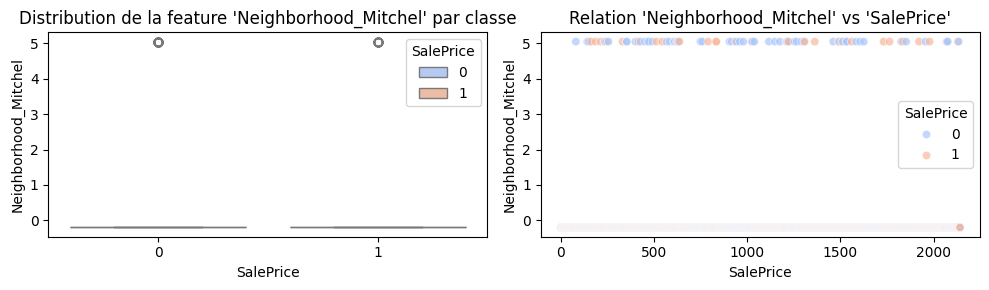

Neighborhood_NAmes vs SalePrice : -0.29


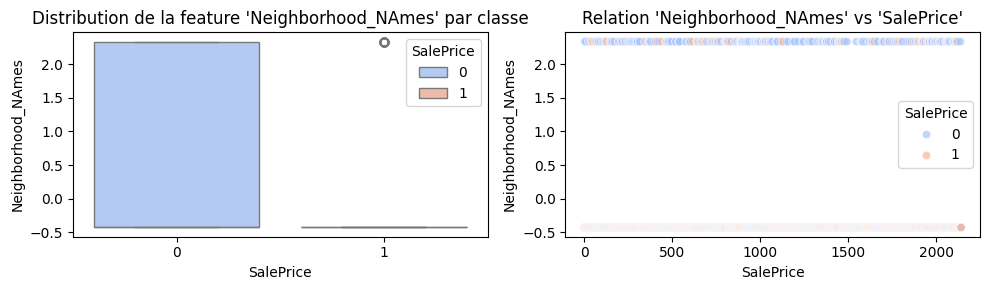

Neighborhood_NPkVill vs SalePrice : -0.09


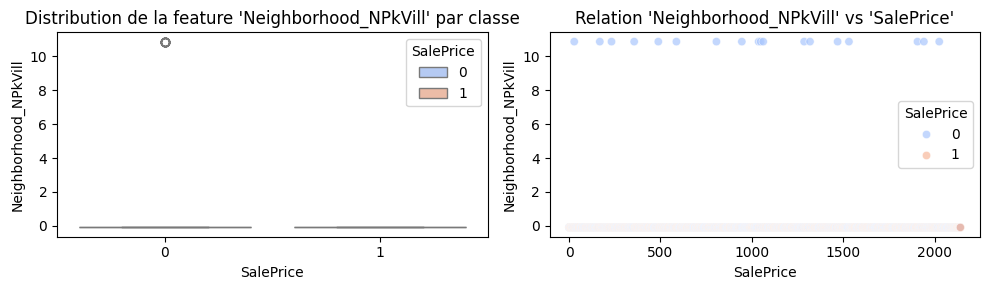

Neighborhood_NWAmes vs SalePrice : 0.09


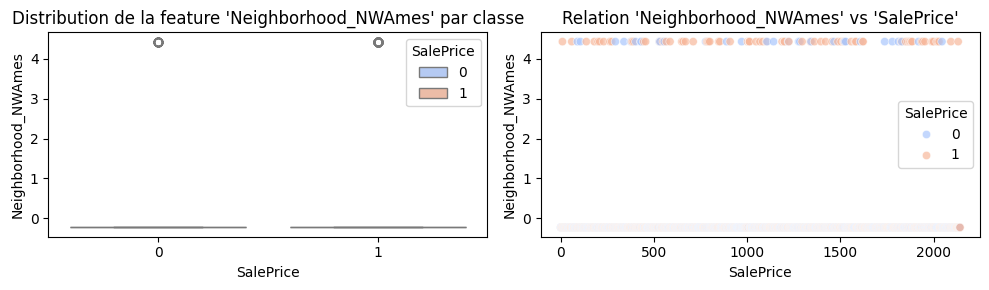

Neighborhood_NoRidge vs SalePrice : 0.16


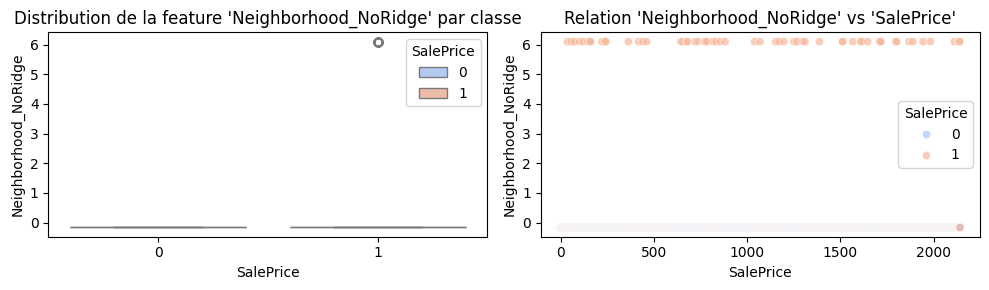

Neighborhood_NridgHt vs SalePrice : 0.25


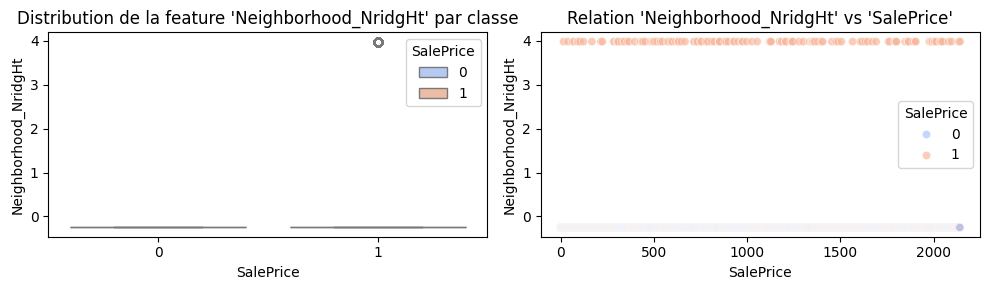

Neighborhood_OldTown vs SalePrice : -0.23


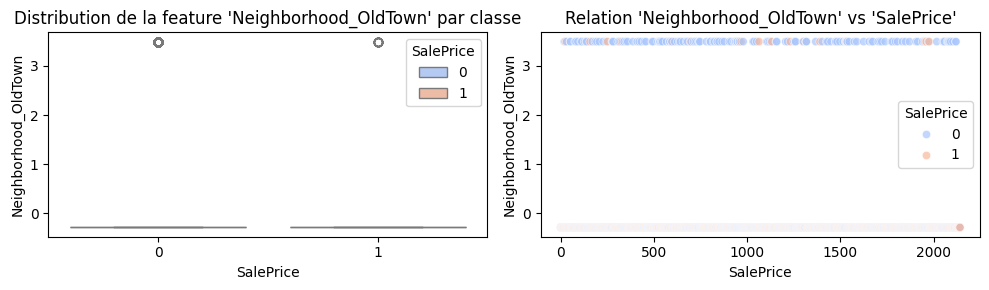

Neighborhood_SWISU vs SalePrice : -0.07


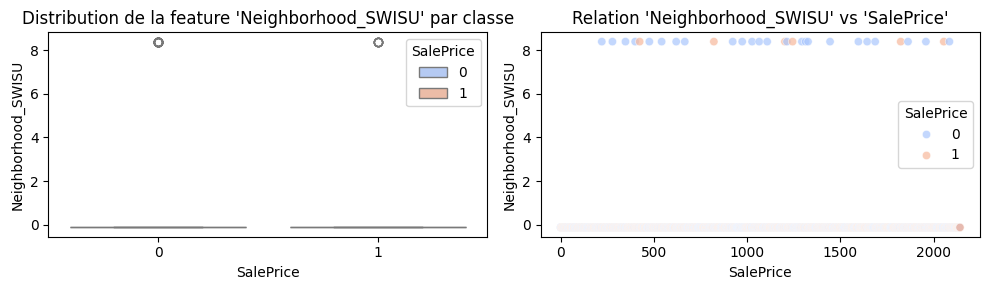

Neighborhood_Sawyer vs SalePrice : -0.19


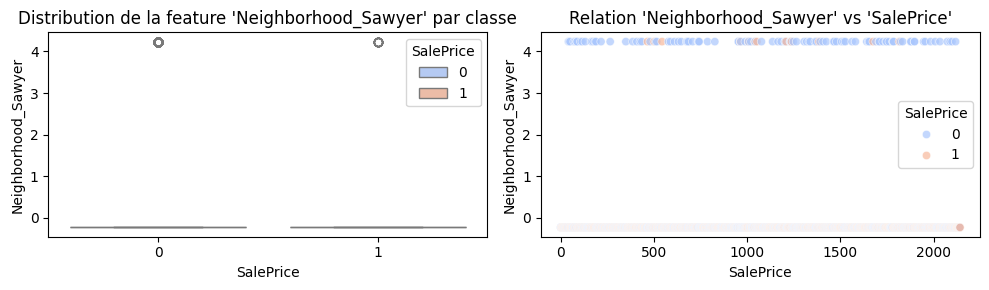

Neighborhood_SawyerW vs SalePrice : 0.09


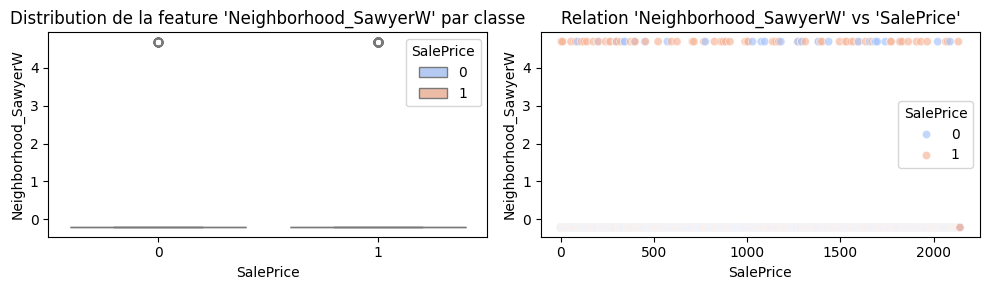

Neighborhood_Somerst vs SalePrice : 0.19


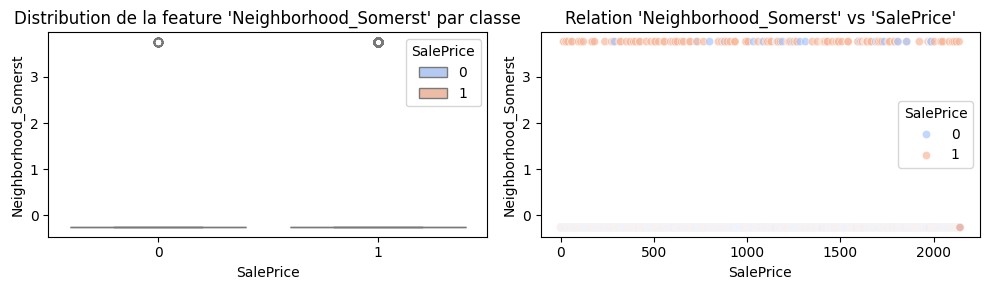

Neighborhood_StoneBr vs SalePrice : 0.13


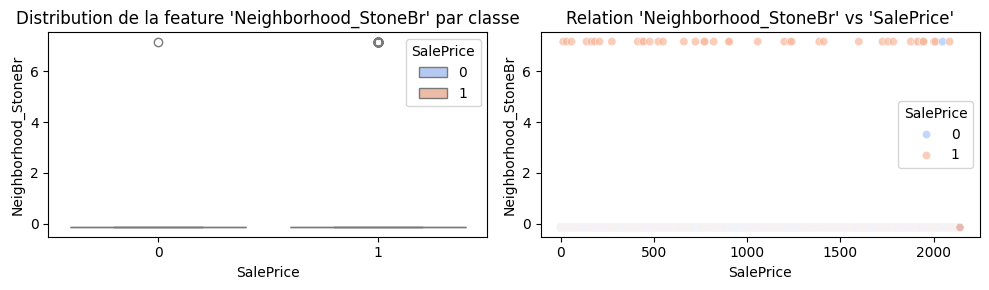

Neighborhood_Timber vs SalePrice : 0.15


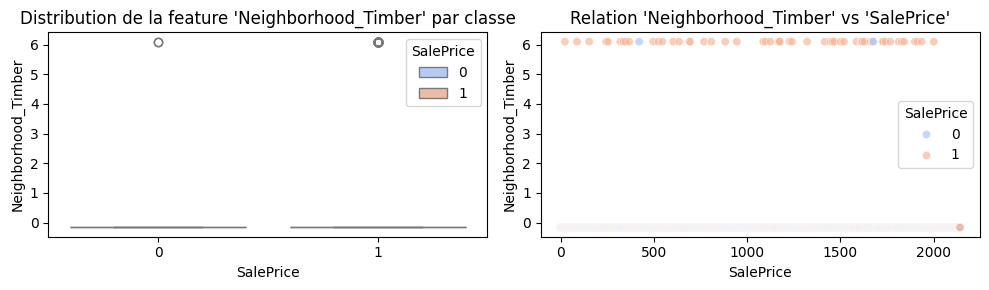

Neighborhood_Veenker vs SalePrice : 0.09


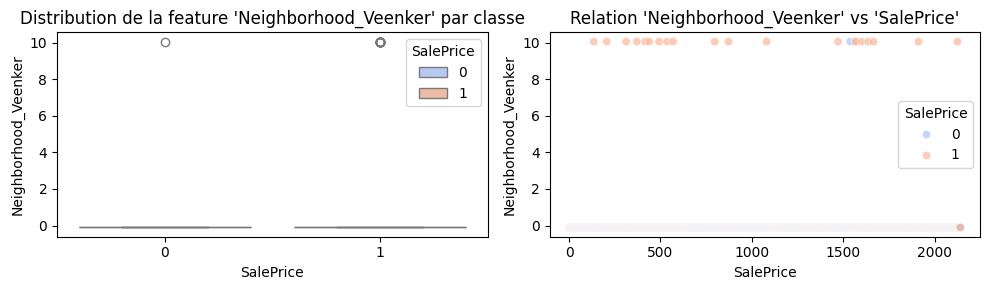

Condition 1_Feedr vs SalePrice : -0.11


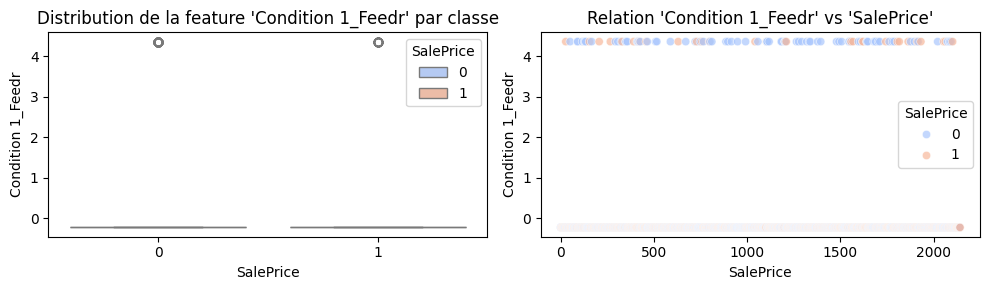

Condition 1_Norm vs SalePrice : 0.11


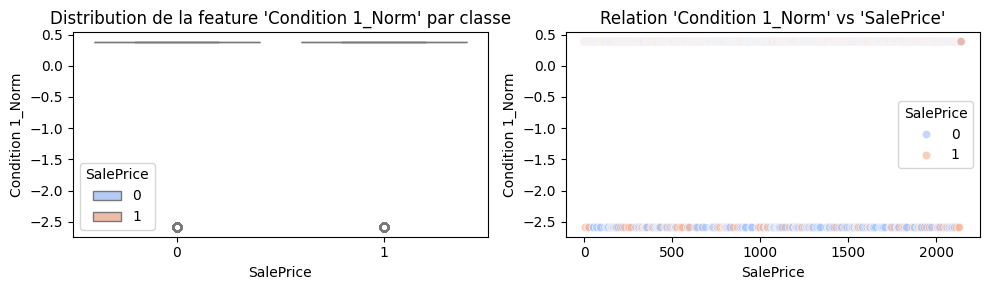

Condition 1_PosA vs SalePrice : 0.08


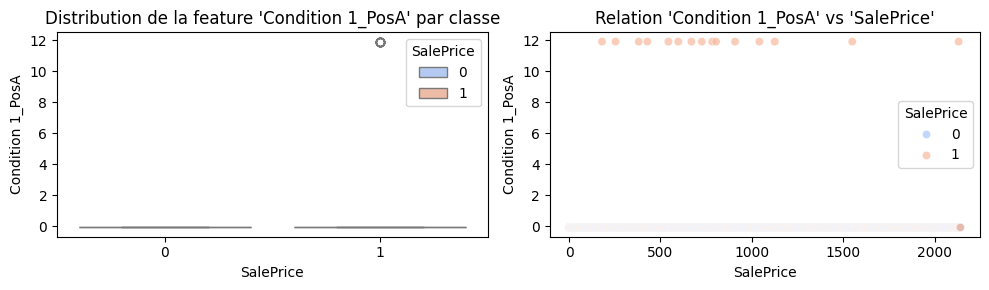

Condition 1_PosN vs SalePrice : 0.06


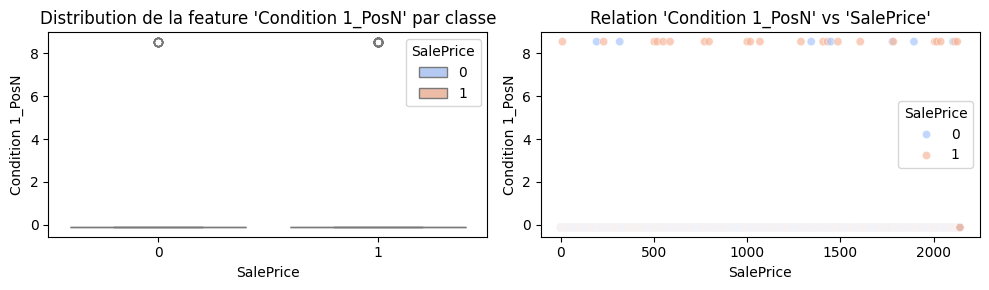

Condition 1_RRAe vs SalePrice : -0.07


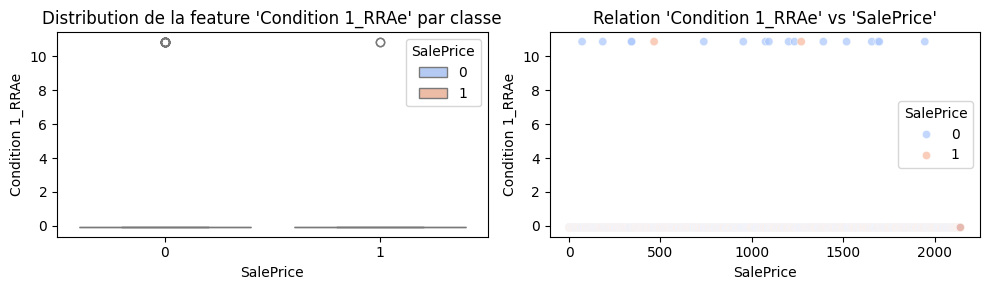

Condition 1_RRAn vs SalePrice : -0.00


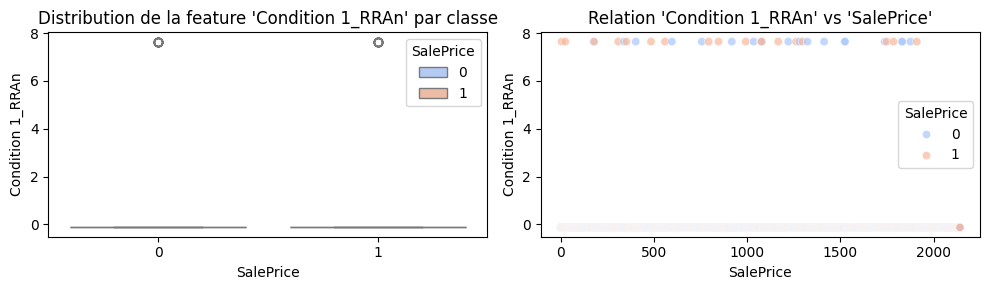

Condition 1_RRNe vs SalePrice : -0.00


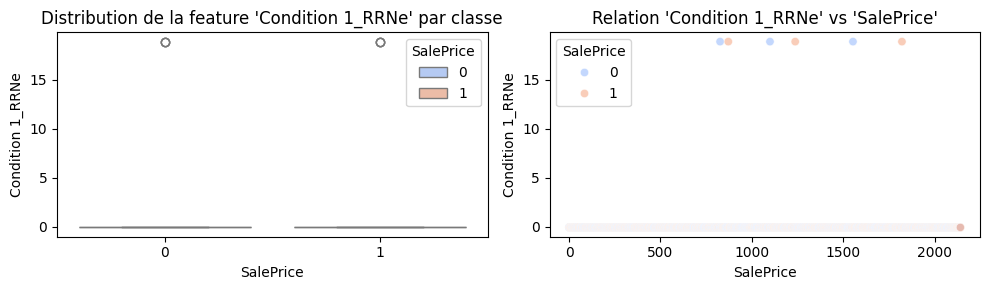

Condition 1_RRNn vs SalePrice : -0.00


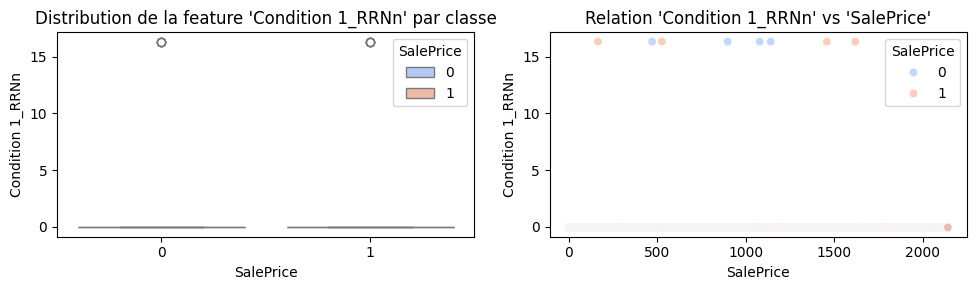

Condition 2_Feedr vs SalePrice : -0.05


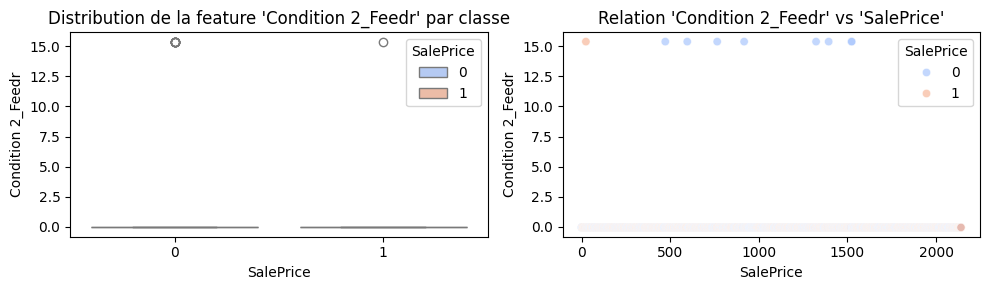

Condition 2_Norm vs SalePrice : 0.03


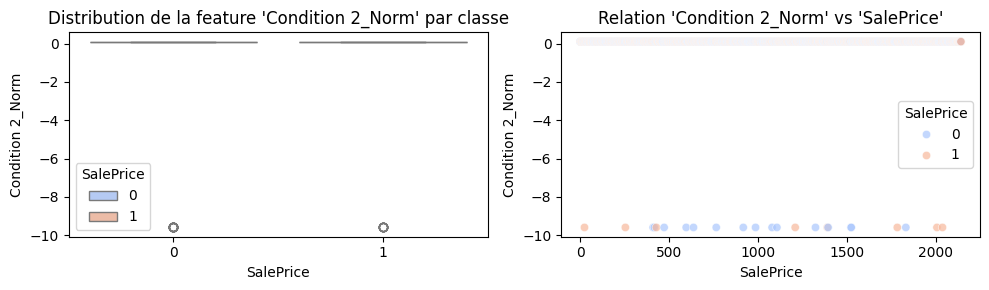

Condition 2_PosA vs SalePrice : 0.04


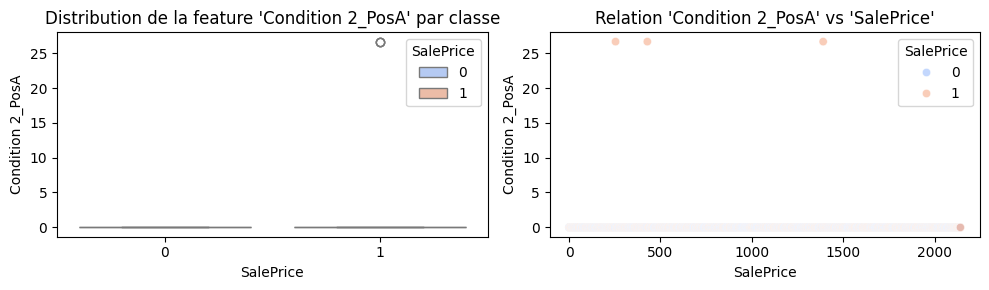

Condition 2_PosN vs SalePrice : 0.04


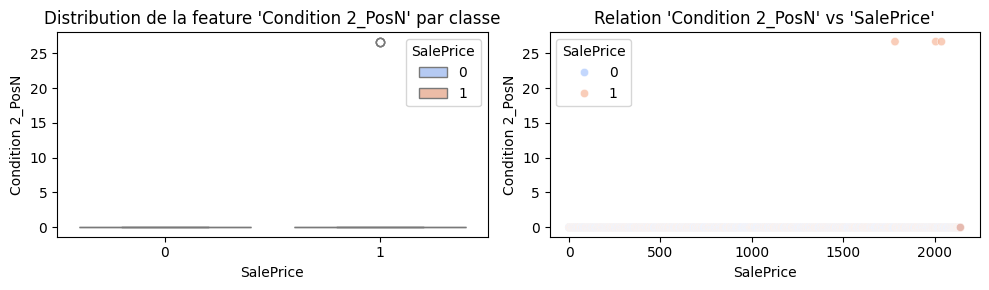

Condition 2_RRAe vs SalePrice : 0.02


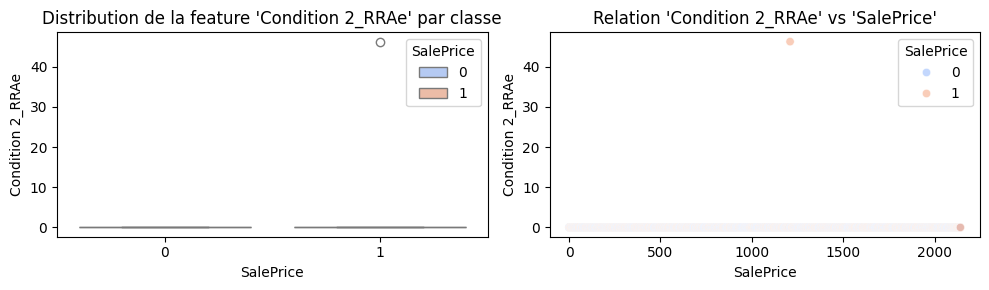

Condition 2_RRAn vs SalePrice : -0.02


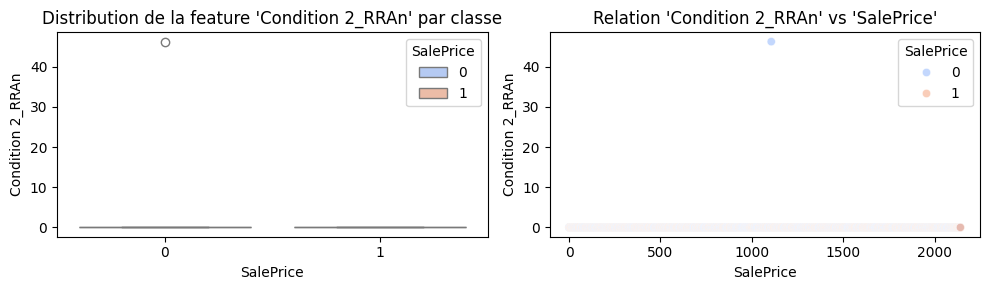

Condition 2_RRNn vs SalePrice : -0.03


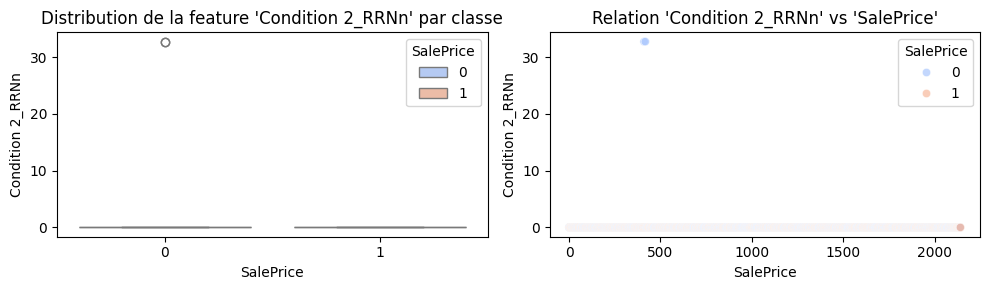

Bldg Type_2fmCon vs SalePrice : -0.10


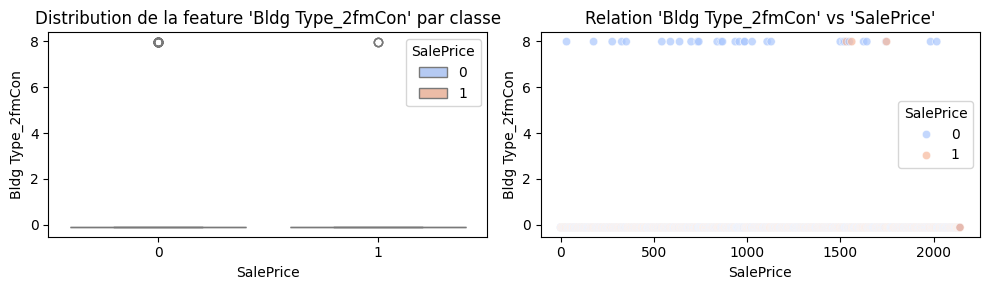

Bldg Type_Duplex vs SalePrice : -0.07


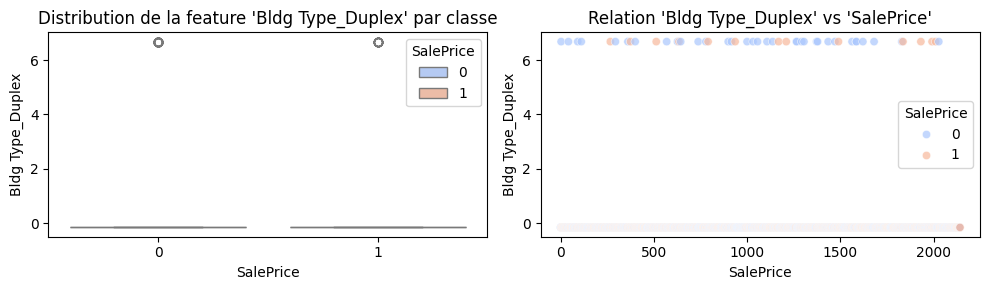

Bldg Type_Twnhs vs SalePrice : -0.09


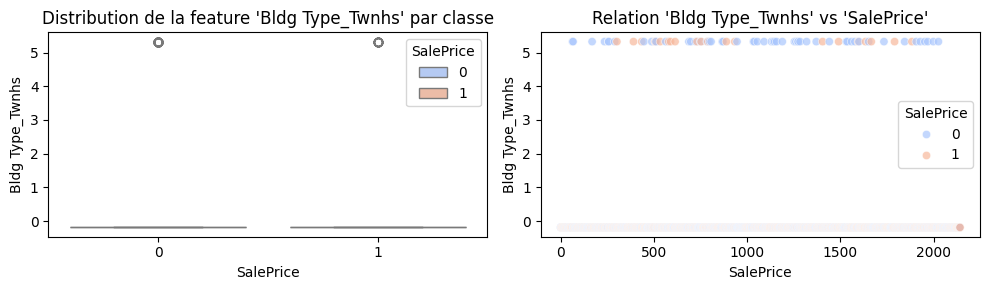

Bldg Type_TwnhsE vs SalePrice : 0.06


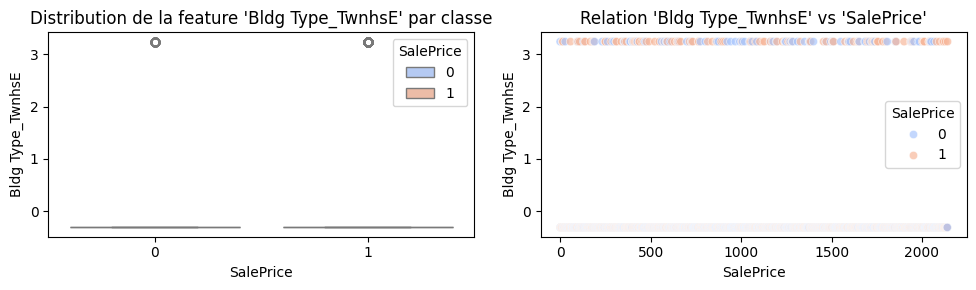

House Style_1.5Unf vs SalePrice : -0.08


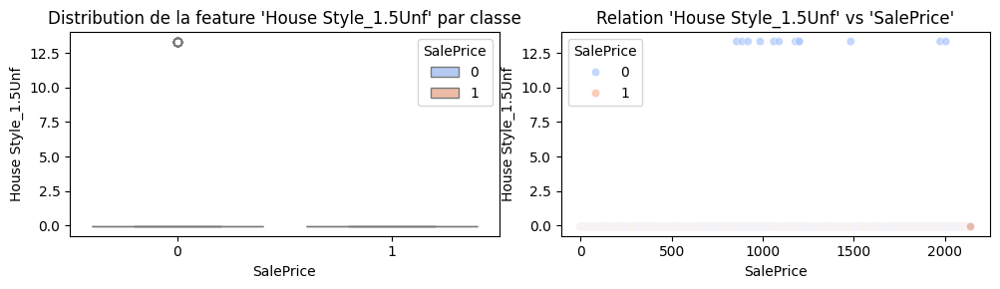

House Style_1Story vs SalePrice : -0.09


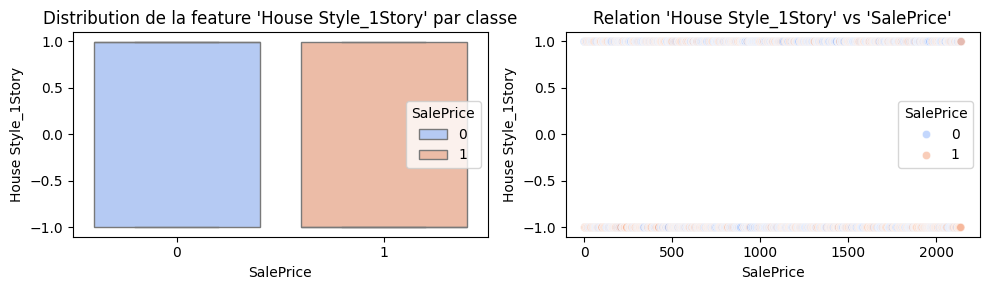

House Style_2.5Fin vs SalePrice : 0.03


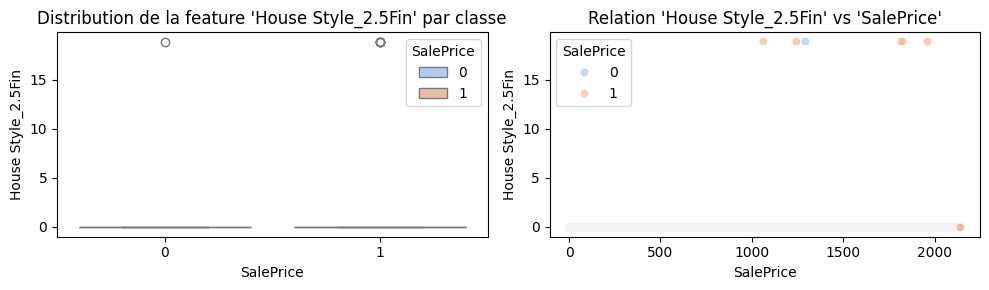

House Style_2.5Unf vs SalePrice : -0.02


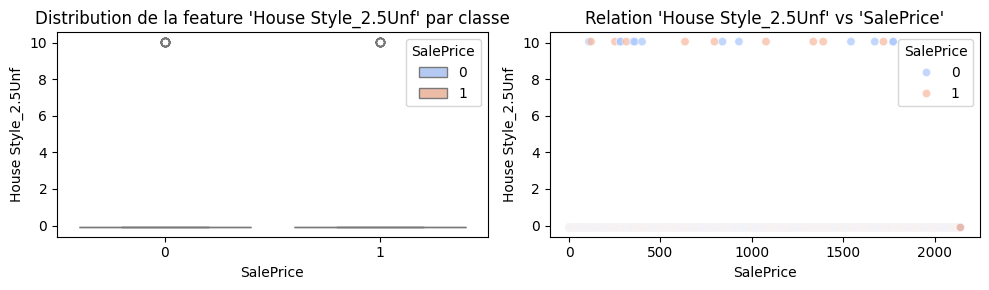

House Style_2Story vs SalePrice : 0.28


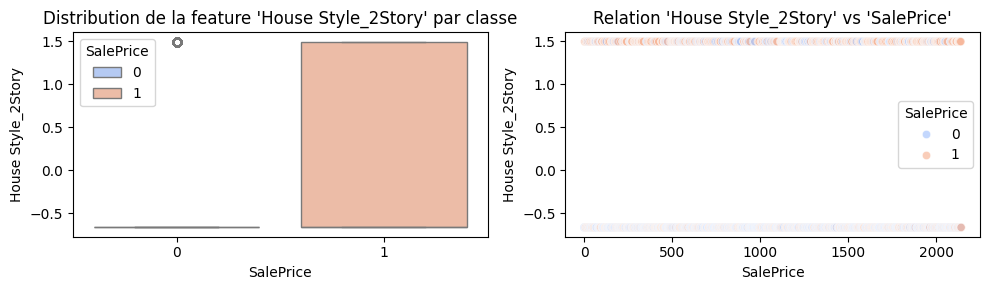

House Style_SFoyer vs SalePrice : -0.09


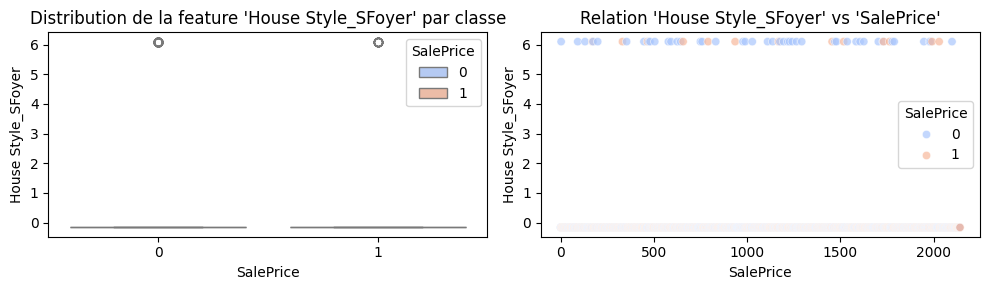

House Style_SLvl vs SalePrice : 0.00


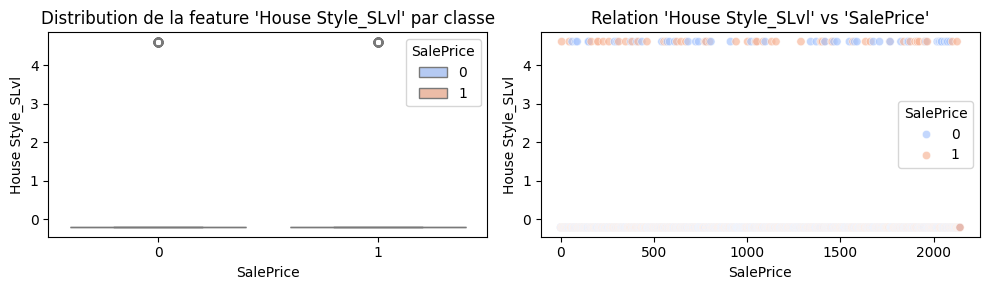

Roof Style_Gable vs SalePrice : -0.07


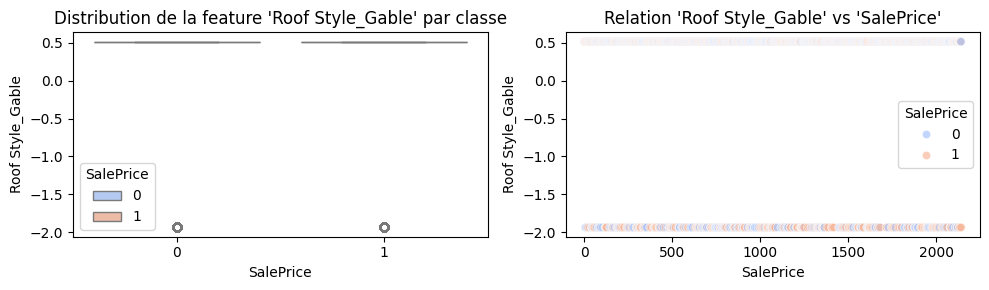

Roof Style_Gambrel vs SalePrice : -0.05


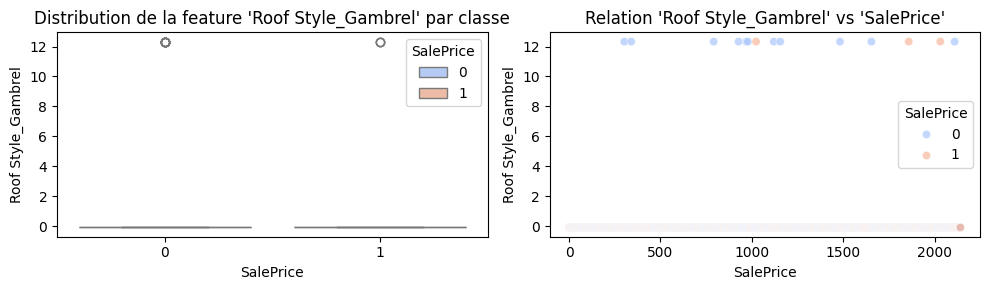

Roof Style_Hip vs SalePrice : 0.07


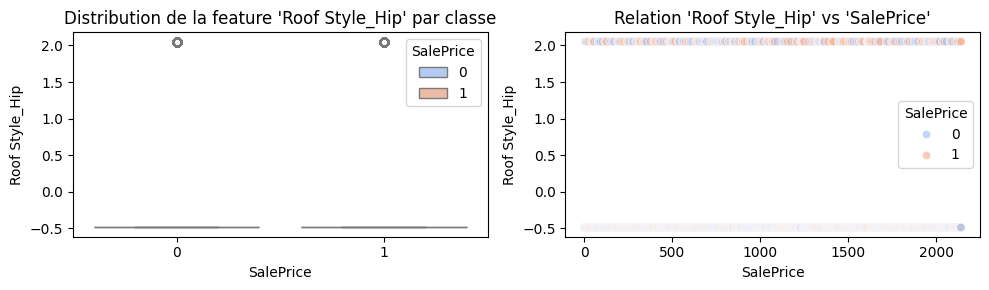

Roof Style_Mansard vs SalePrice : 0.01


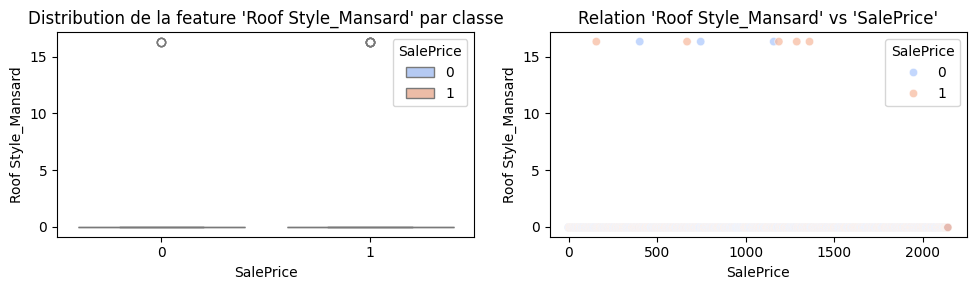

Roof Style_Shed vs SalePrice : 0.02


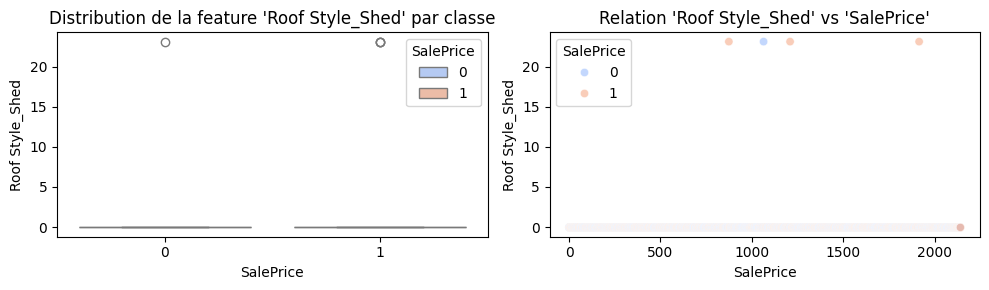

Roof Matl_CompShg vs SalePrice : -0.06


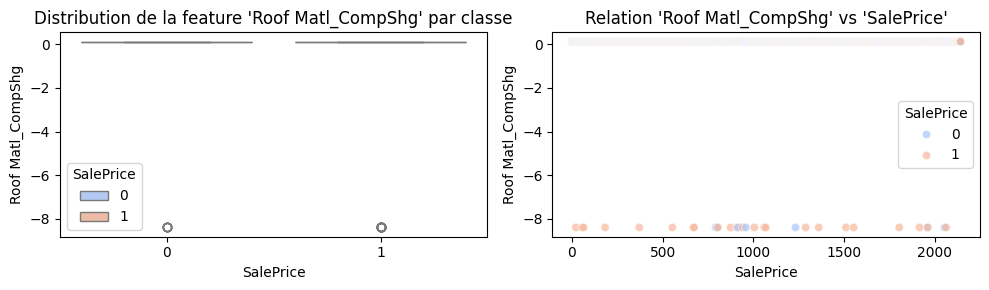

Roof Matl_Membran vs SalePrice : 0.02


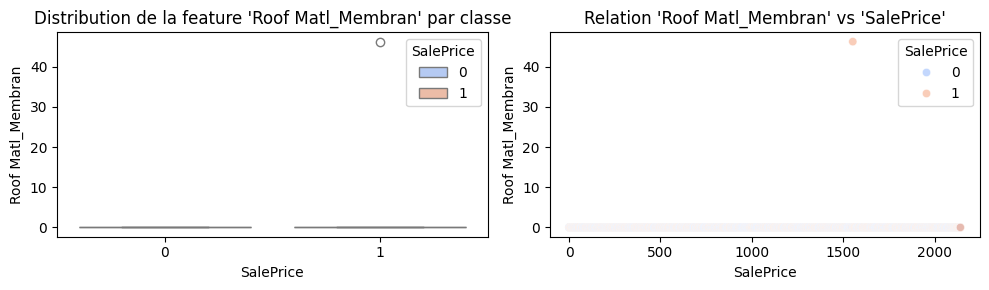

Roof Matl_Metal vs SalePrice : 0.02


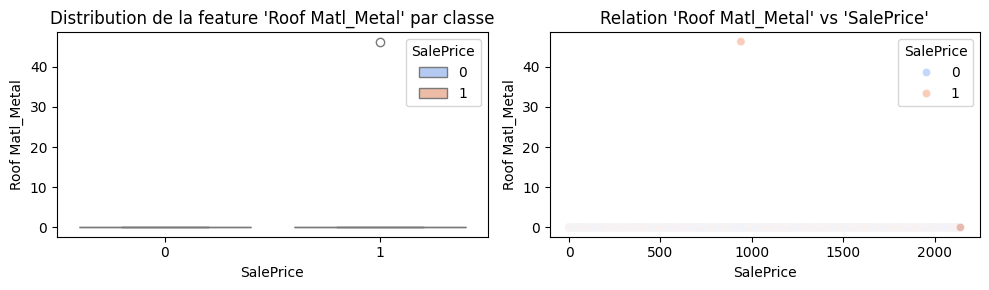

Roof Matl_Roll vs SalePrice : -0.02


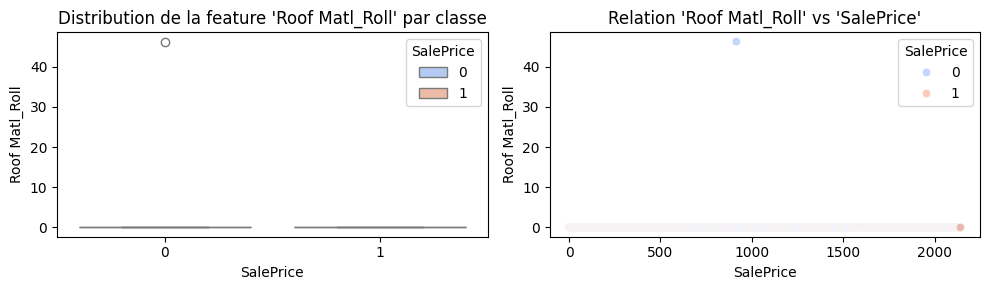

Roof Matl_Tar&Grv vs SalePrice : 0.02


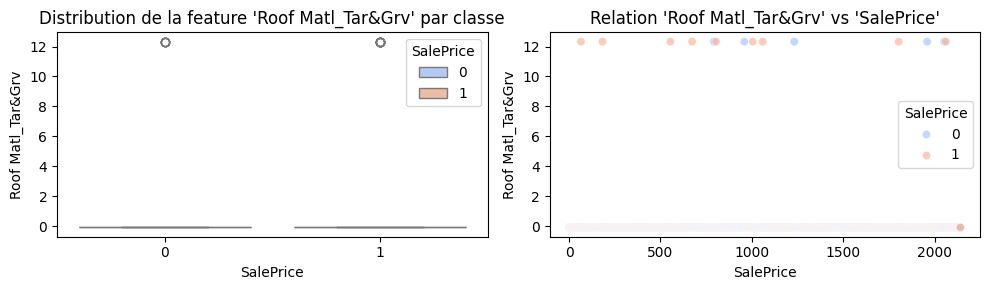

Roof Matl_WdShake vs SalePrice : 0.06


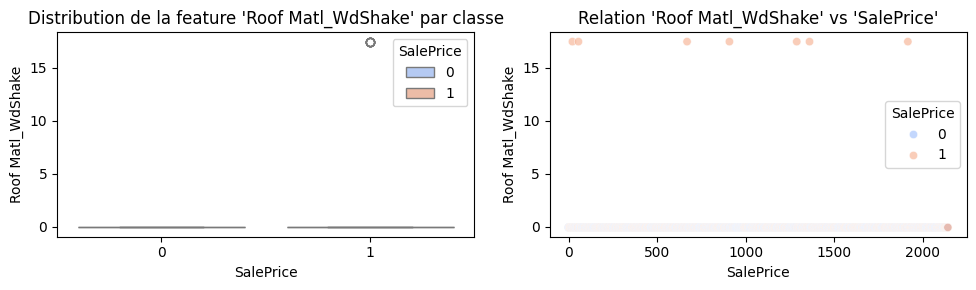

Roof Matl_WdShngl vs SalePrice : 0.05


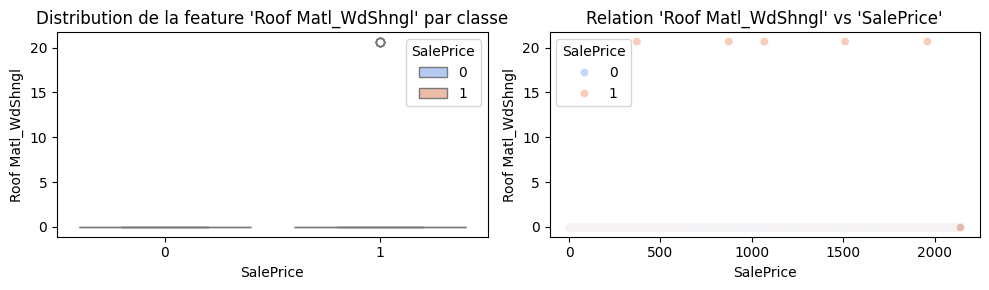

Exterior 1st_BrkComm vs SalePrice : -0.00


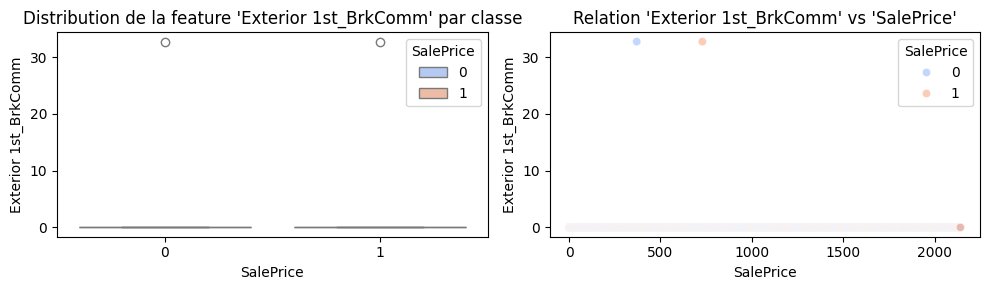

Exterior 1st_BrkFace vs SalePrice : 0.02


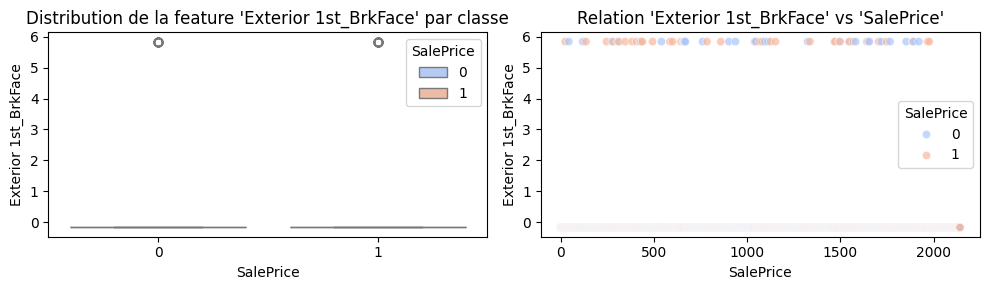

Exterior 1st_CBlock vs SalePrice : -0.02


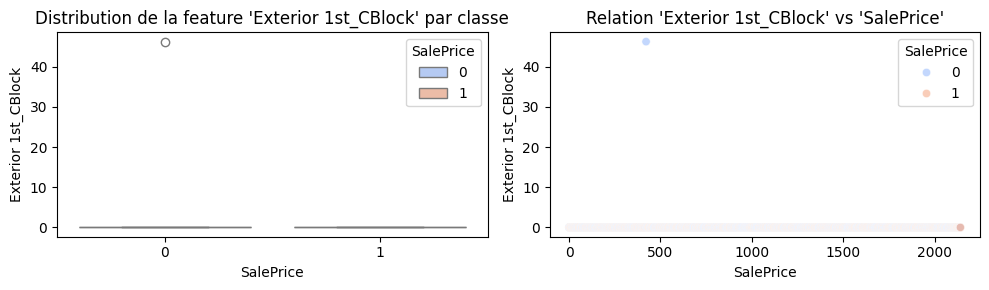

Exterior 1st_CemntBd vs SalePrice : 0.09


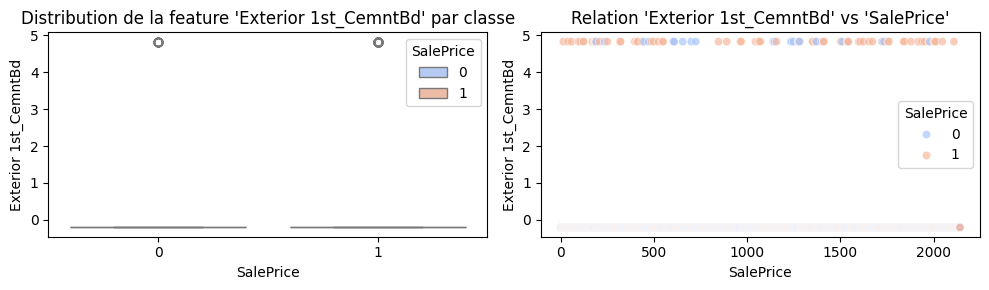

Exterior 1st_HdBoard vs SalePrice : -0.11


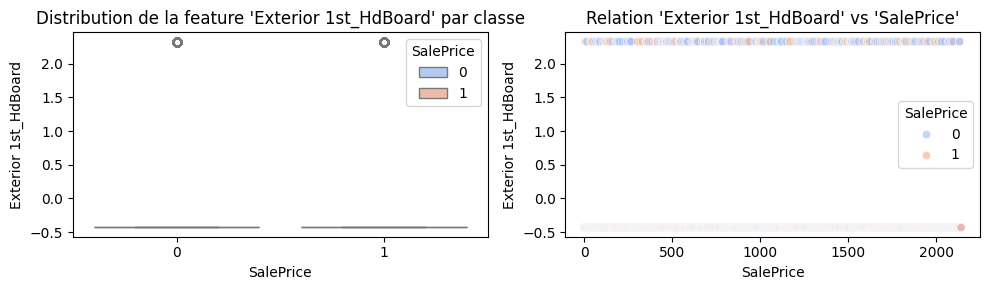

Exterior 1st_ImStucc vs SalePrice : 0.02


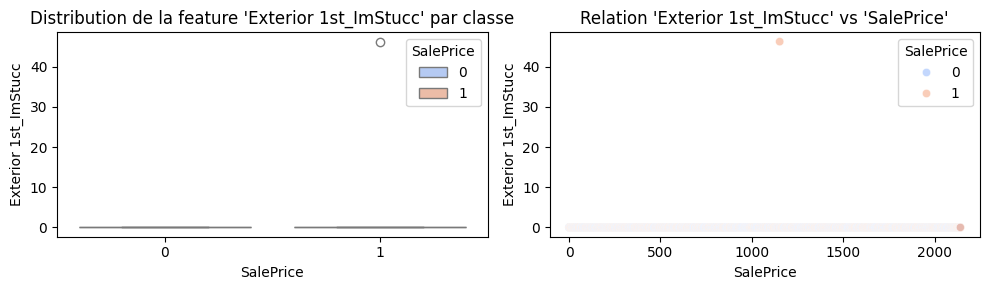

Exterior 1st_MetalSd vs SalePrice : -0.20


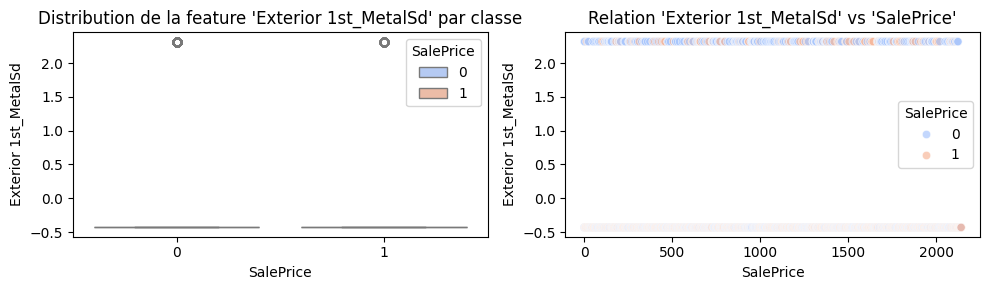

Exterior 1st_Plywood vs SalePrice : -0.04


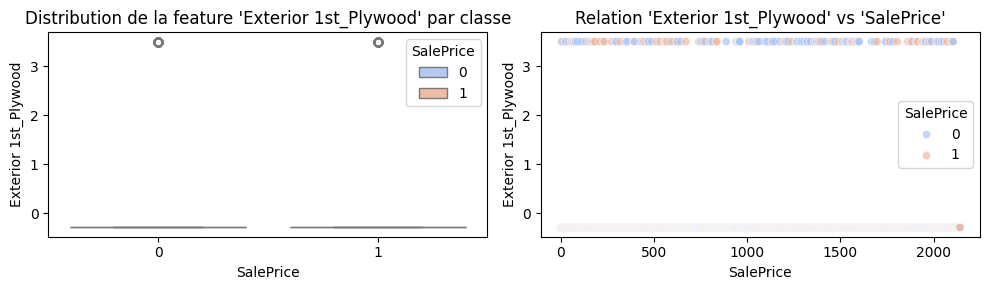

Exterior 1st_Stone vs SalePrice : 0.03


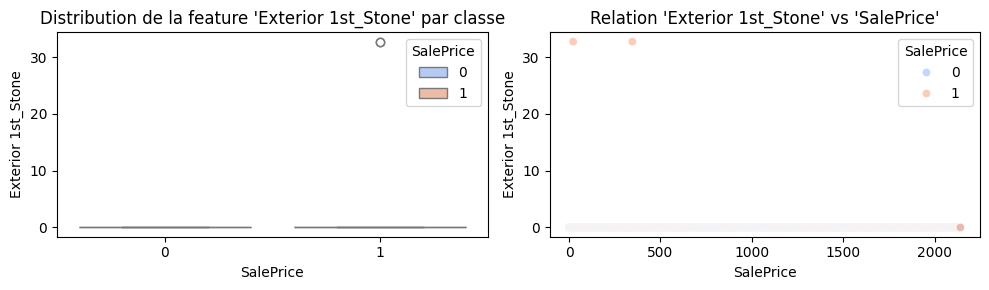

Exterior 1st_Stucco vs SalePrice : -0.06


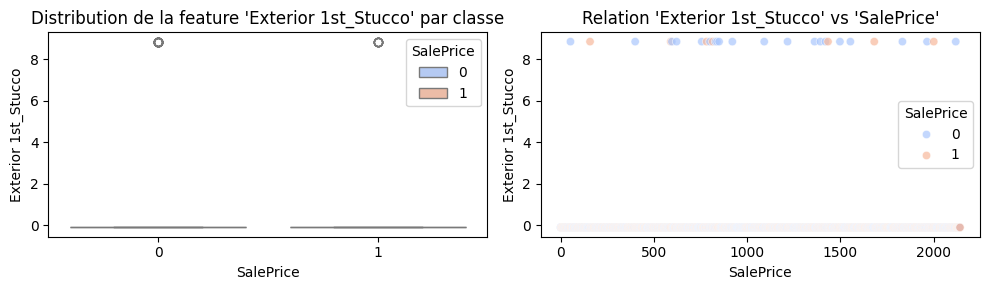

Exterior 1st_VinylSd vs SalePrice : 0.40


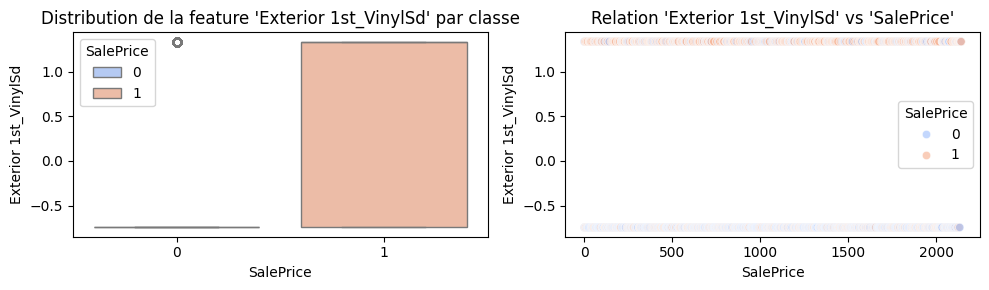

Exterior 1st_Wd Sdng vs SalePrice : -0.19


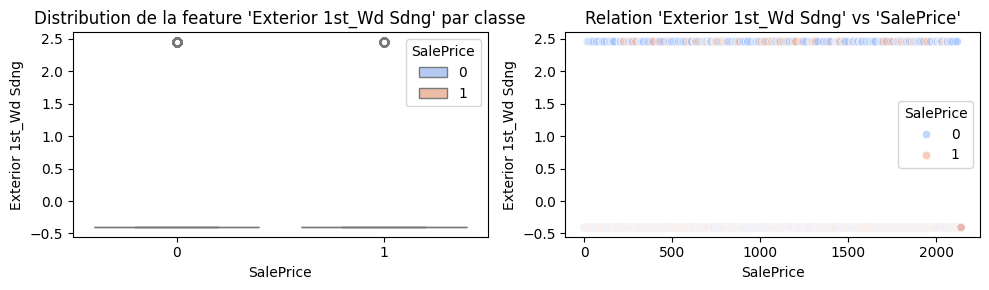

Exterior 1st_WdShing vs SalePrice : -0.04


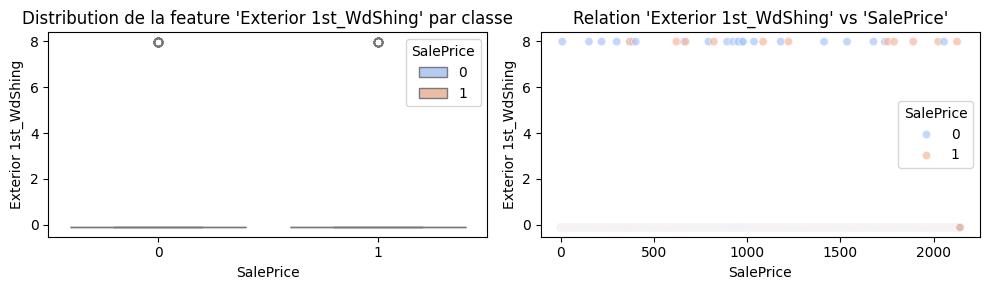

Exterior 2nd_AsphShn vs SalePrice : -0.00


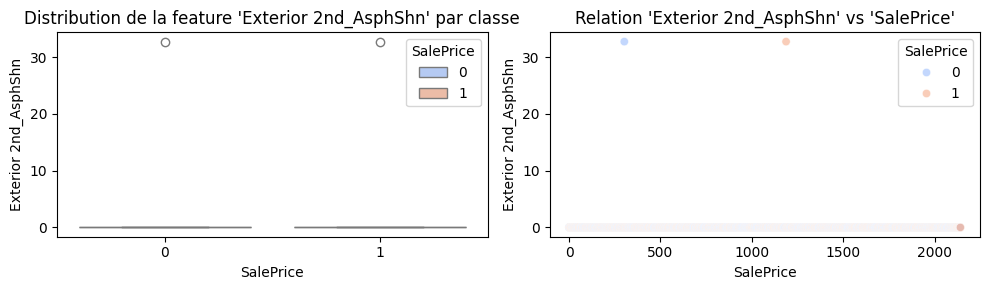

Exterior 2nd_Brk Cmn vs SalePrice : -0.08


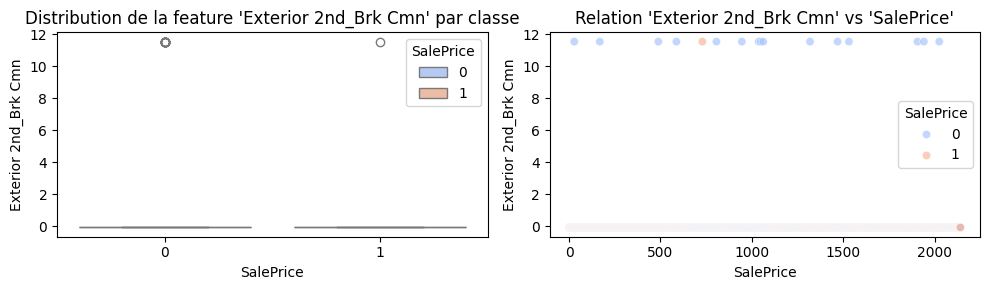

Exterior 2nd_BrkFace vs SalePrice : -0.01


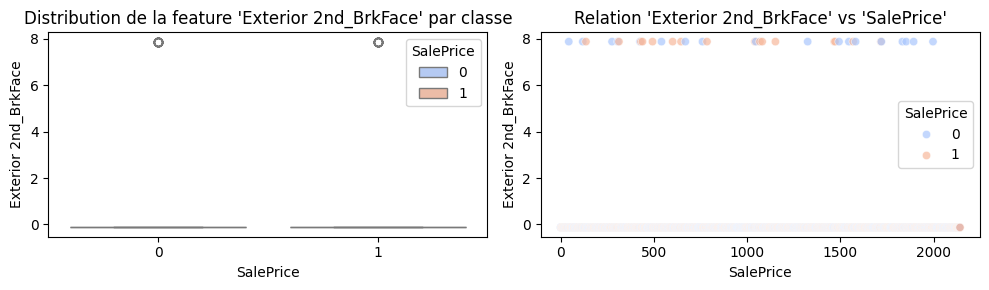

Exterior 2nd_CBlock vs SalePrice : -0.02


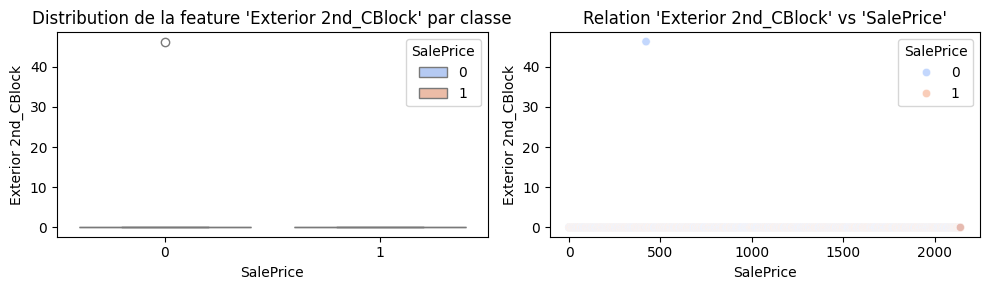

Exterior 2nd_CmentBd vs SalePrice : 0.09


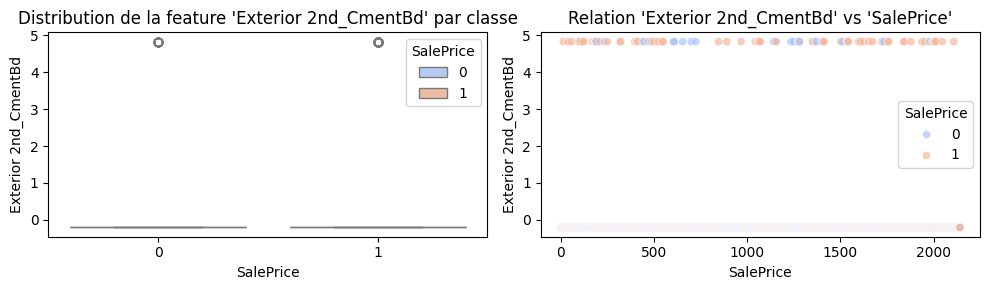

Exterior 2nd_HdBoard vs SalePrice : -0.09


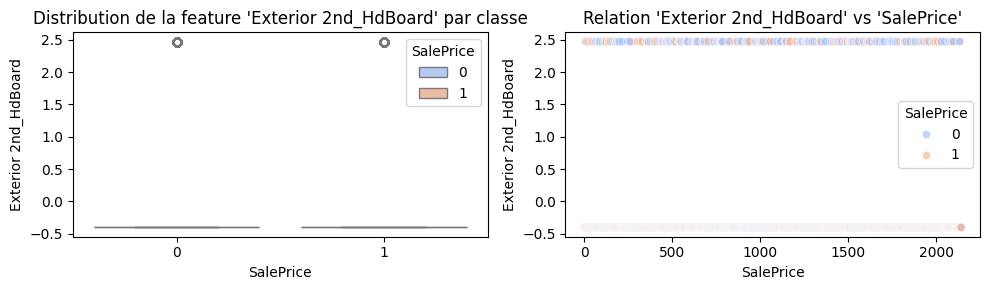

Exterior 2nd_ImStucc vs SalePrice : 0.01


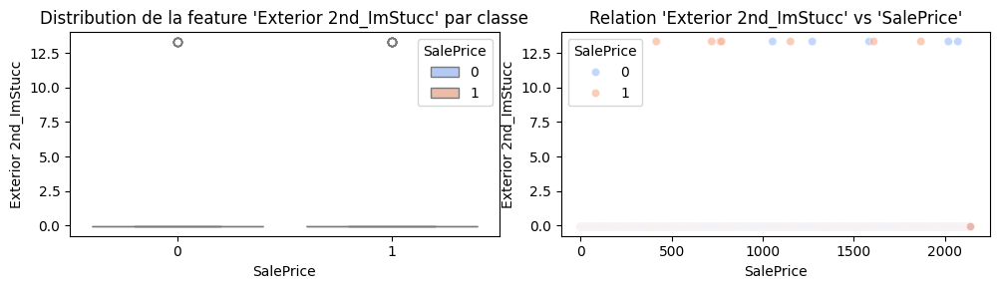

Exterior 2nd_MetalSd vs SalePrice : -0.20


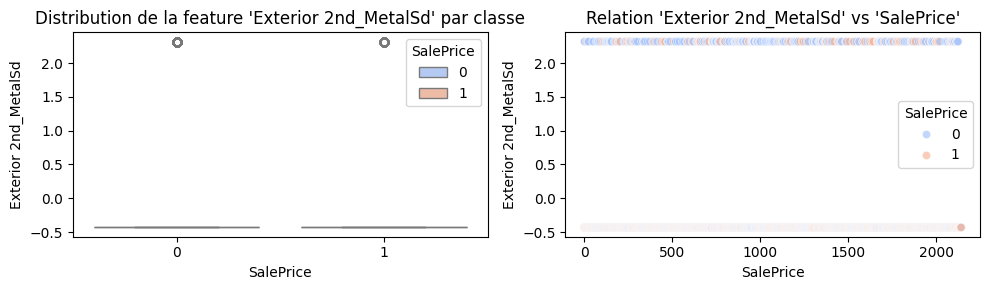

Exterior 2nd_Other vs SalePrice : 0.02


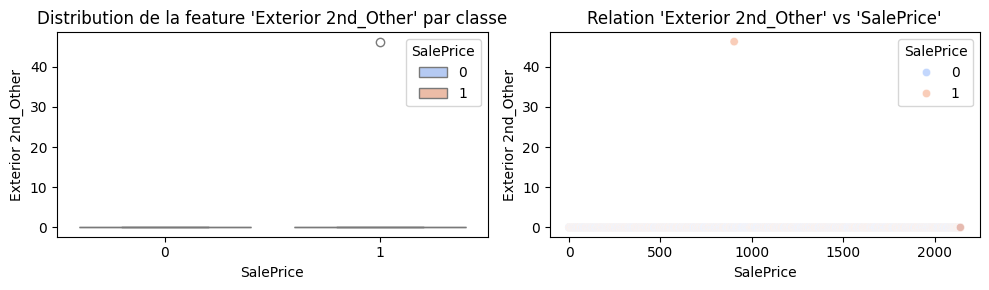

Exterior 2nd_Plywood vs SalePrice : -0.04


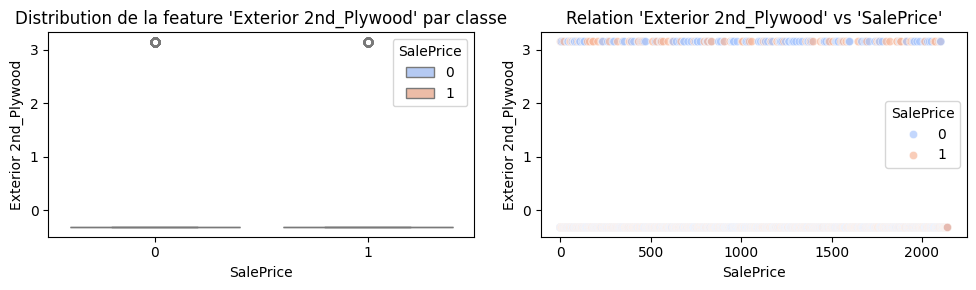

Exterior 2nd_Stone vs SalePrice : 0.03


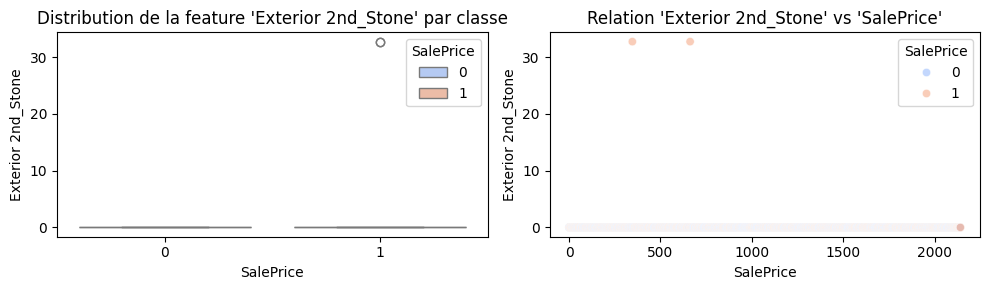

Exterior 2nd_Stucco vs SalePrice : -0.04


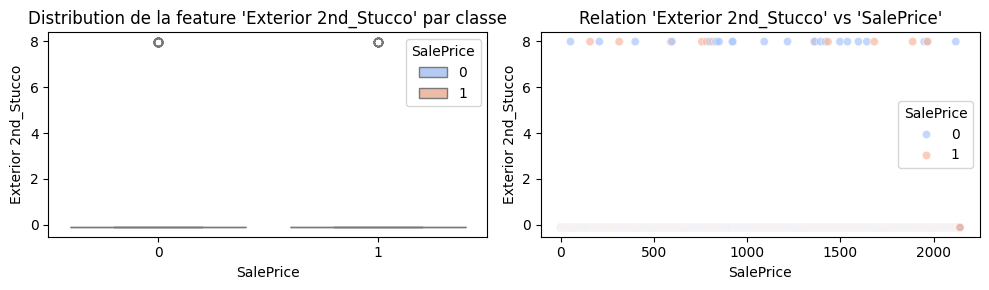

Exterior 2nd_VinylSd vs SalePrice : 0.40


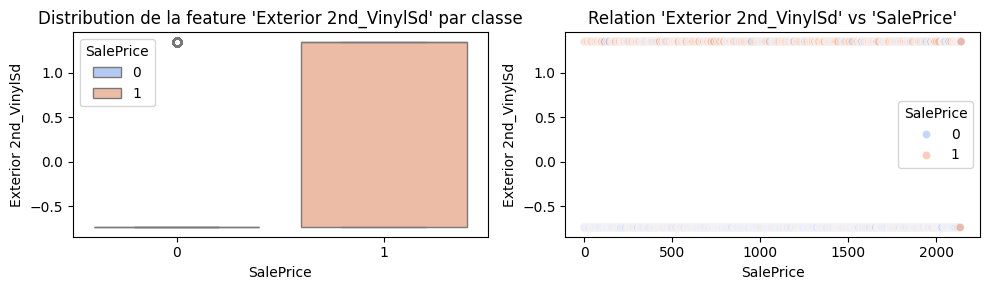

Exterior 2nd_Wd Sdng vs SalePrice : -0.19


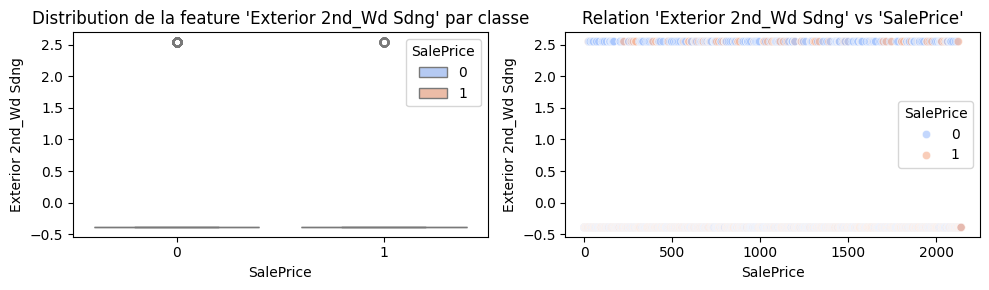

Exterior 2nd_Wd Shng vs SalePrice : -0.04


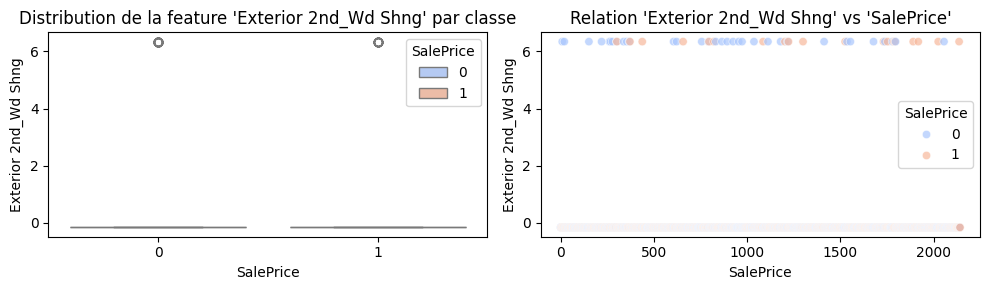

Exter Qual_Fa vs SalePrice : -0.08


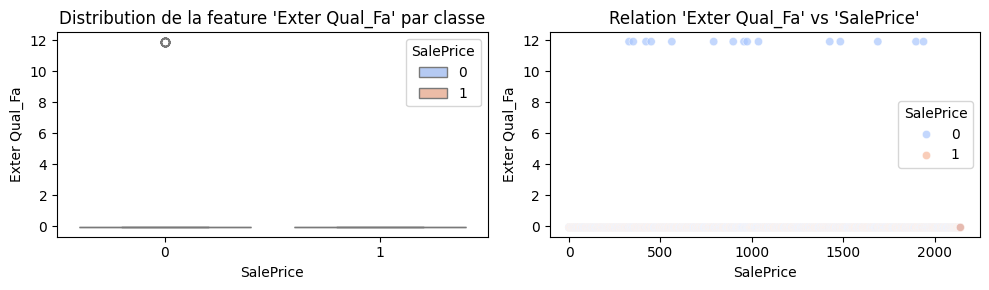

Exter Qual_Gd vs SalePrice : 0.57


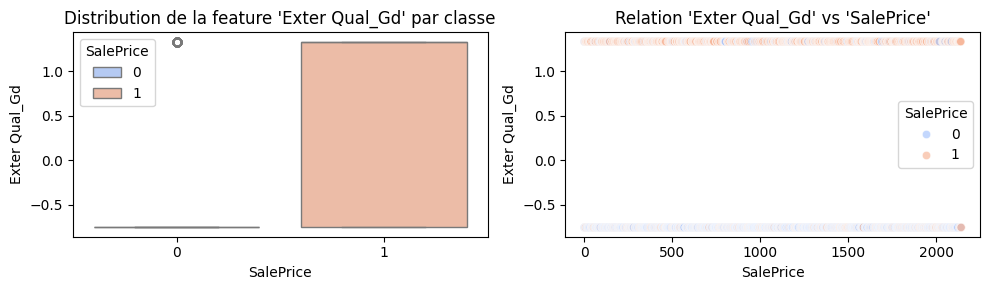

Exter Qual_TA vs SalePrice : -0.61


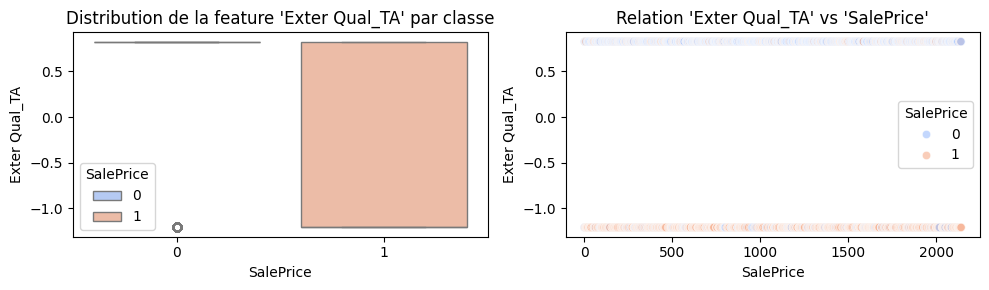

Exter Cond_Fa vs SalePrice : -0.08


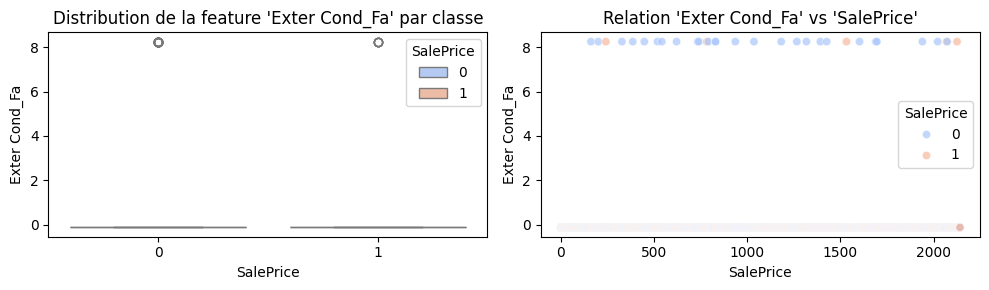

Exter Cond_Gd vs SalePrice : -0.06


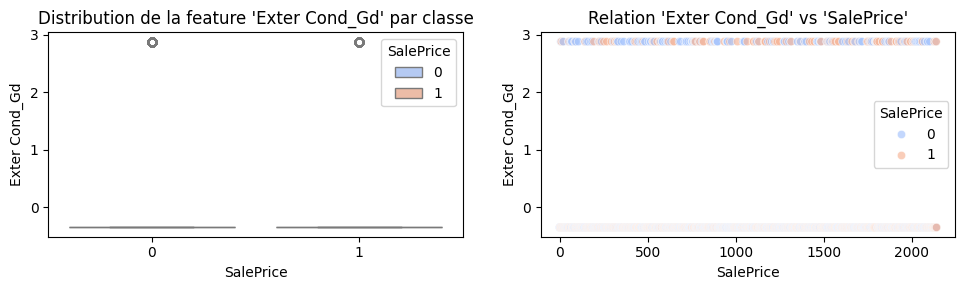

Exter Cond_Po vs SalePrice : -0.02


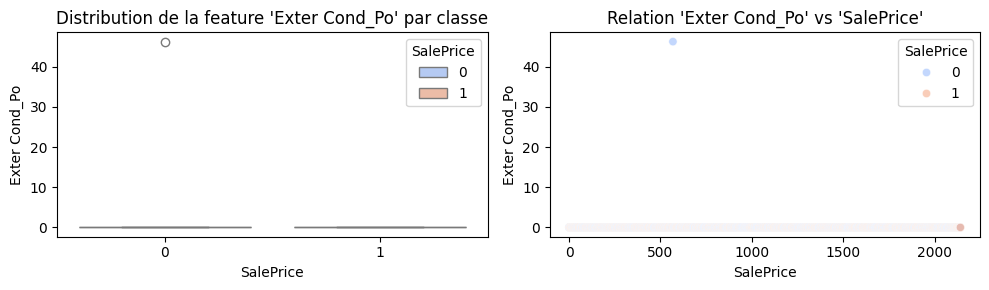

Exter Cond_TA vs SalePrice : 0.09


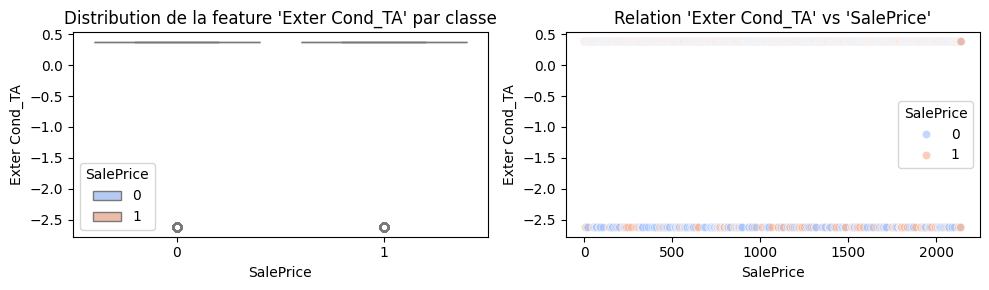

Foundation_CBlock vs SalePrice : -0.43


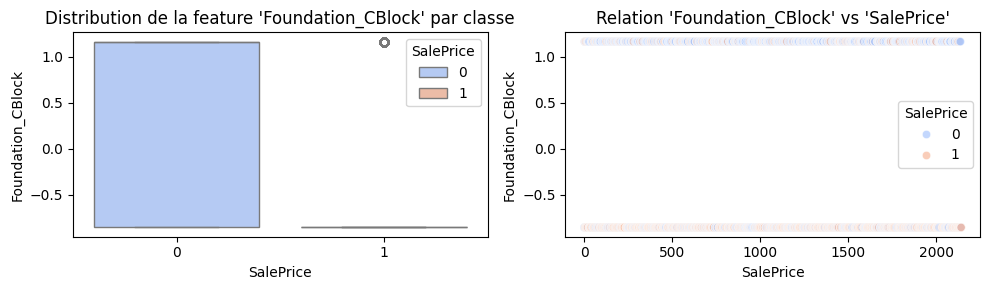

Foundation_PConc vs SalePrice : 0.58


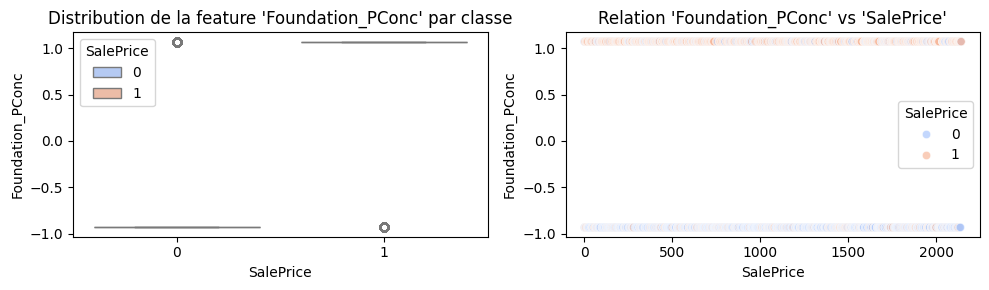

Foundation_Stone vs SalePrice : -0.03


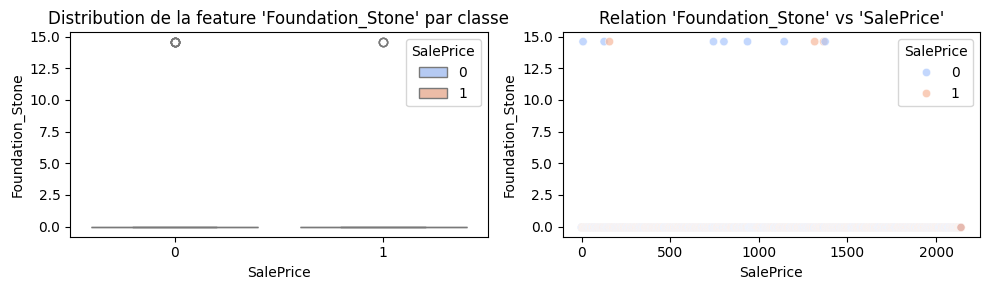

Foundation_Wood vs SalePrice : -0.01


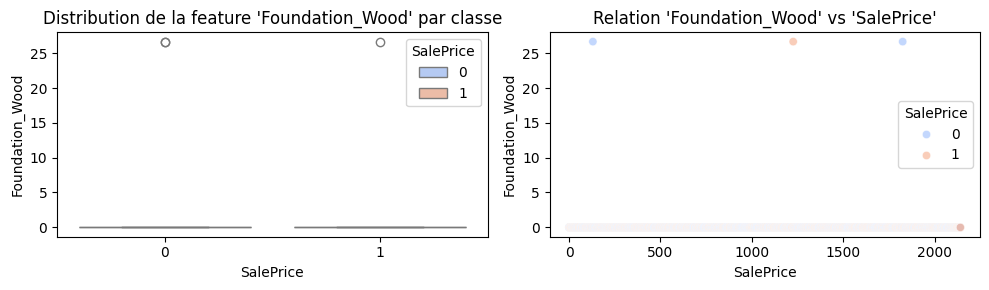

Bsmt Qual_Fa vs SalePrice : -0.15


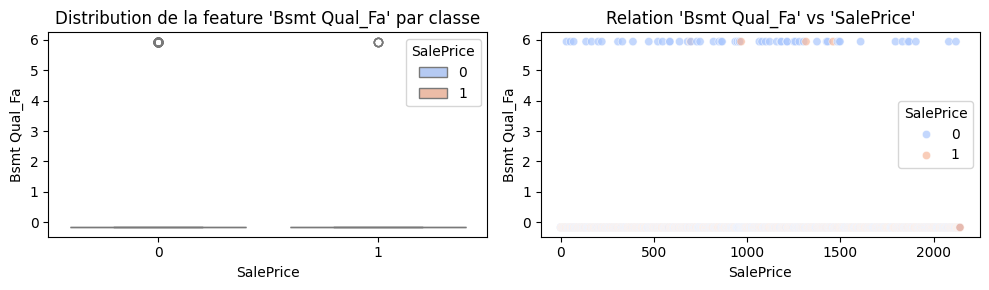

Bsmt Qual_Gd vs SalePrice : 0.43


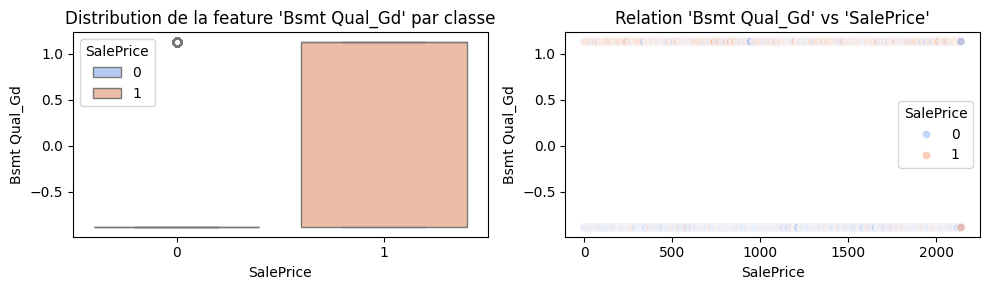

Bsmt Qual_Po vs SalePrice : -0.03


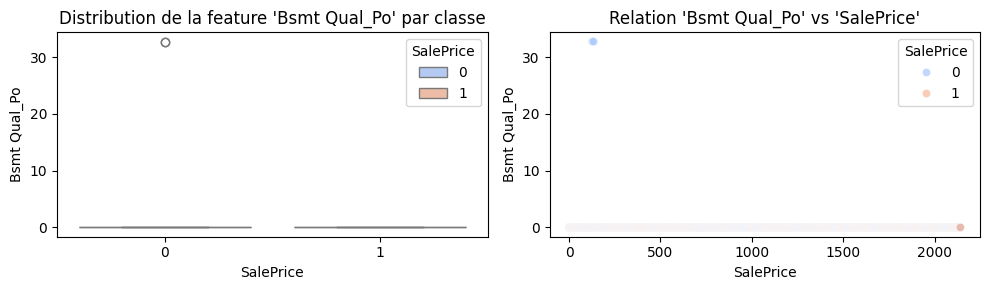

Bsmt Qual_TA vs SalePrice : -0.56


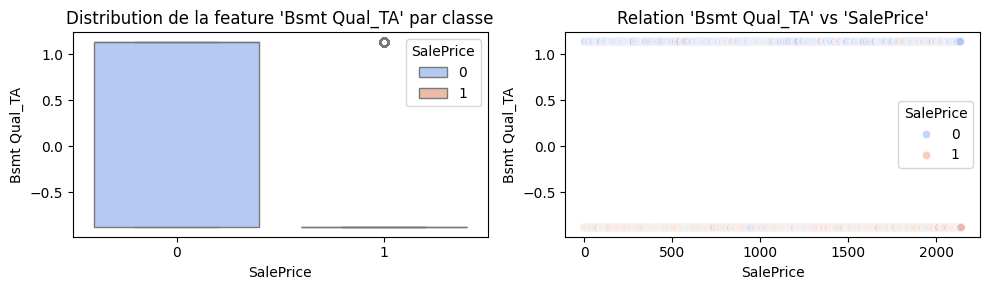

Bsmt Cond_Fa vs SalePrice : -0.13


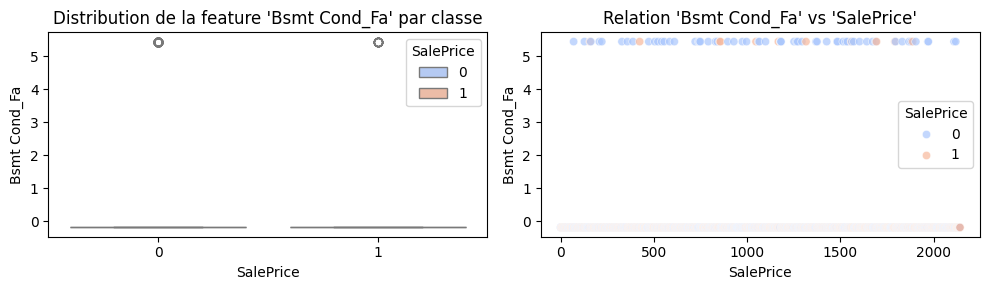

Bsmt Cond_Gd vs SalePrice : 0.08


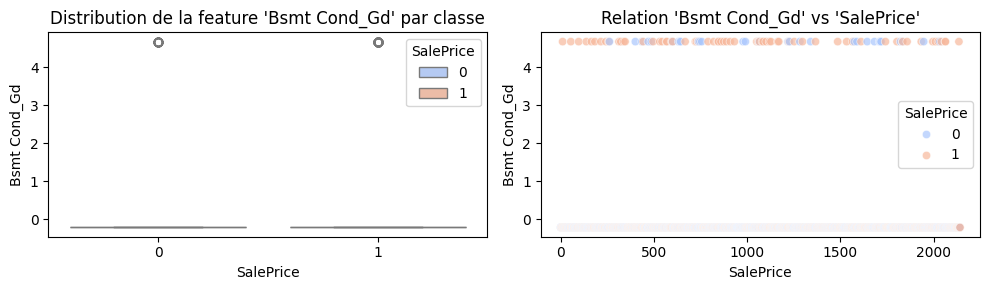

Bsmt Cond_Po vs SalePrice : -0.02


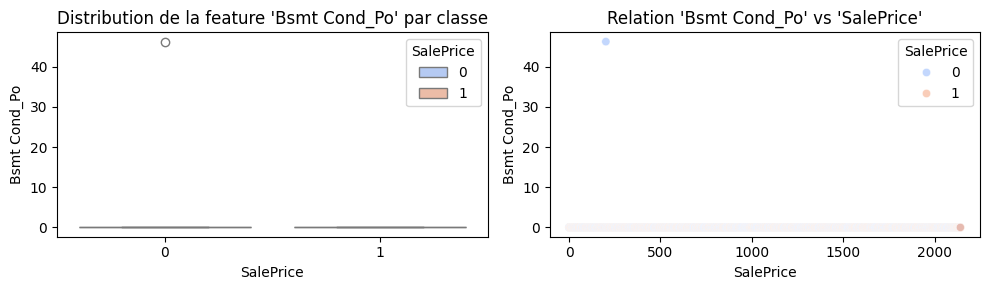

Bsmt Cond_TA vs SalePrice : 0.03


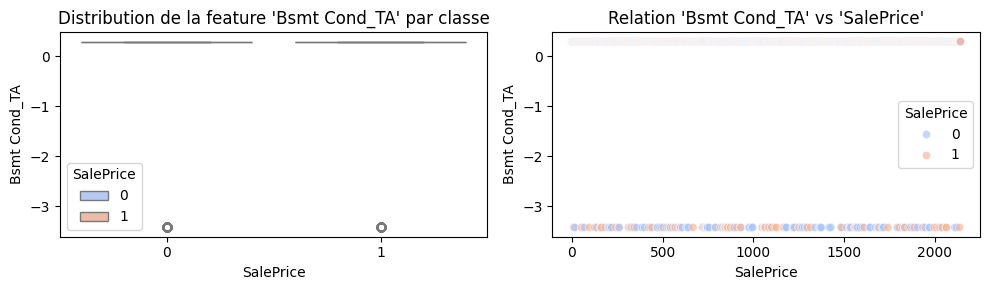

Bsmt Exposure_Gd vs SalePrice : 0.23


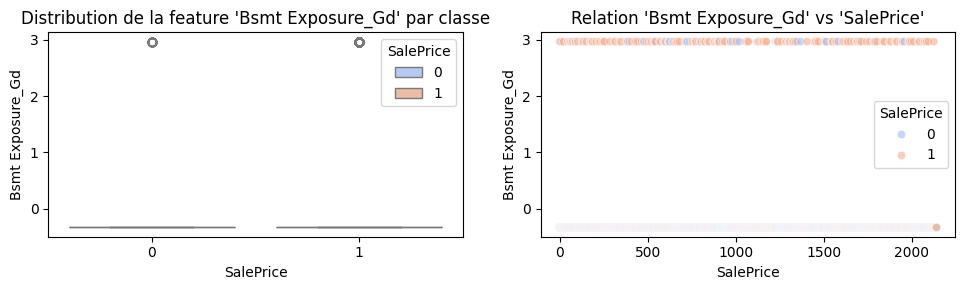

Bsmt Exposure_Mn vs SalePrice : 0.03


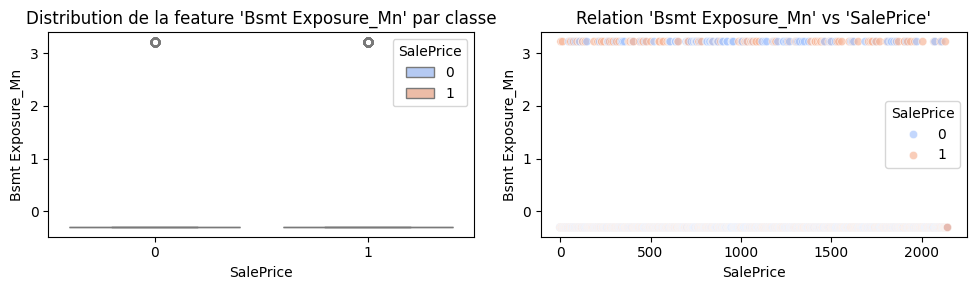

Bsmt Exposure_No vs SalePrice : -0.25


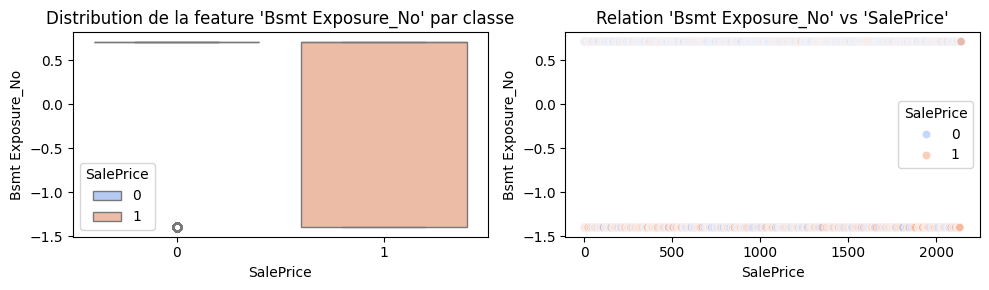

BsmtFin Type 1_BLQ vs SalePrice : -0.17


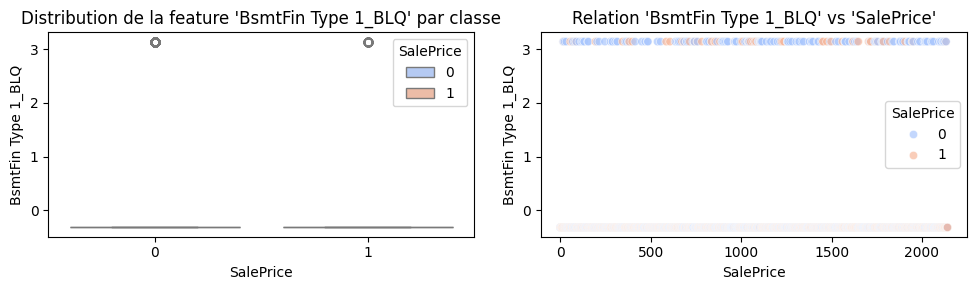

BsmtFin Type 1_GLQ vs SalePrice : 0.41


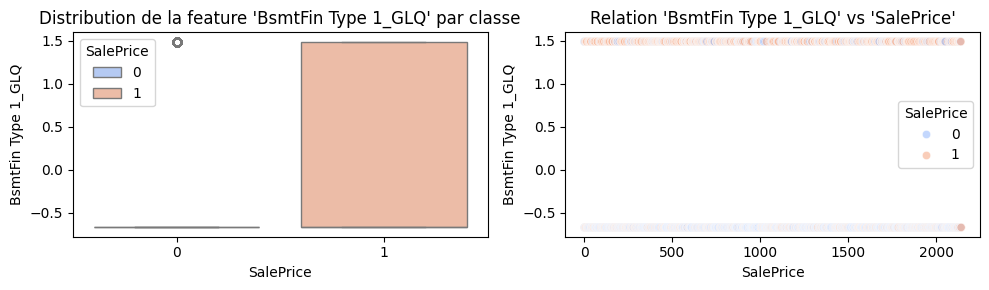

BsmtFin Type 1_LwQ vs SalePrice : -0.08


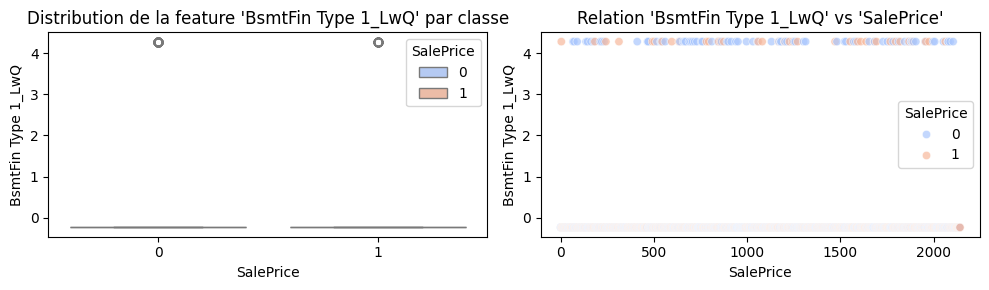

BsmtFin Type 1_Rec vs SalePrice : -0.25


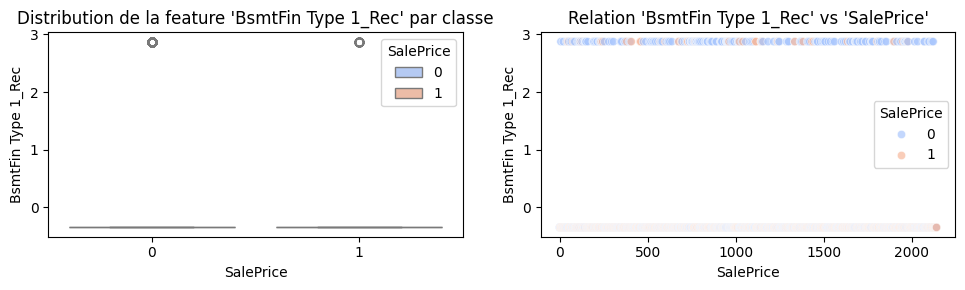

BsmtFin Type 1_Unf vs SalePrice : -0.01


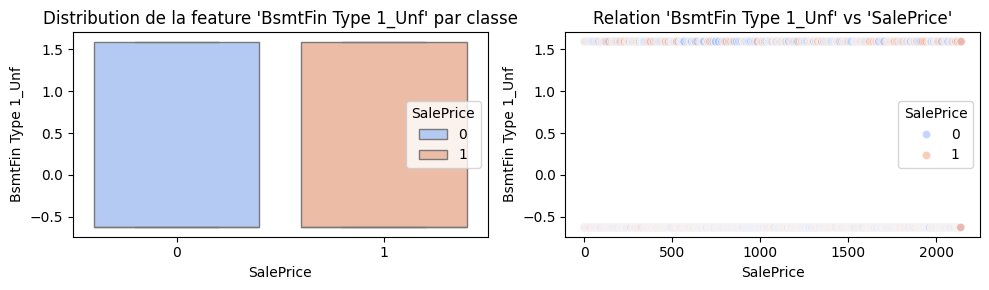

BsmtFin Type 2_BLQ vs SalePrice : -0.06


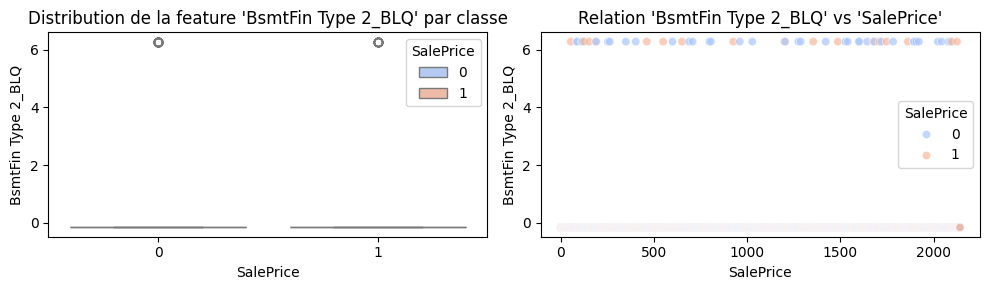

BsmtFin Type 2_GLQ vs SalePrice : 0.03


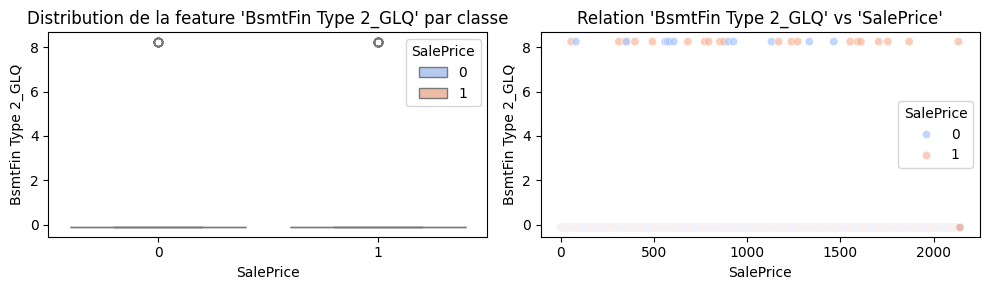

BsmtFin Type 2_LwQ vs SalePrice : -0.03


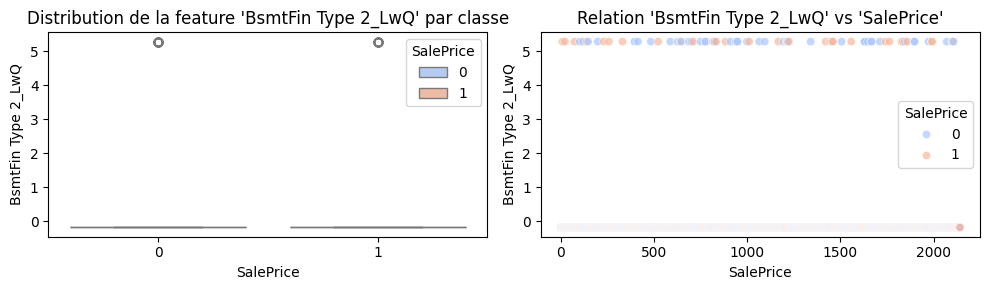

BsmtFin Type 2_Rec vs SalePrice : -0.05


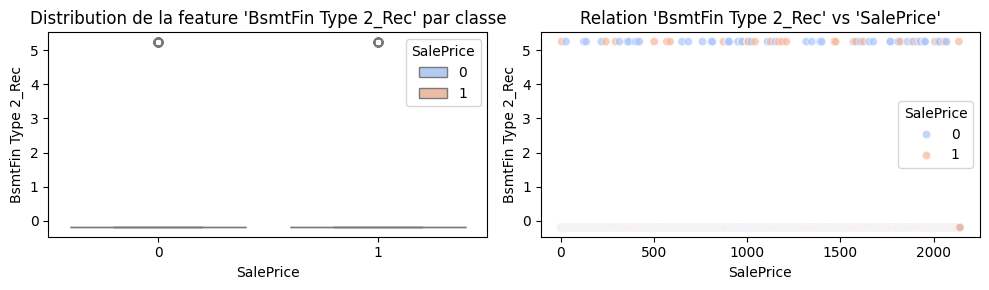

BsmtFin Type 2_Unf vs SalePrice : 0.06


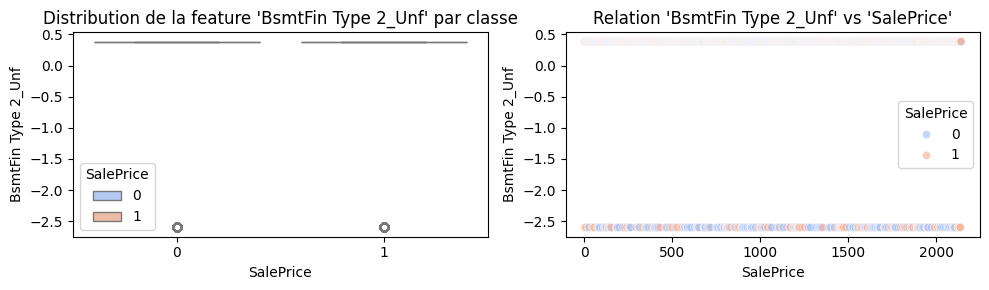

Heating_GasW vs SalePrice : -0.03


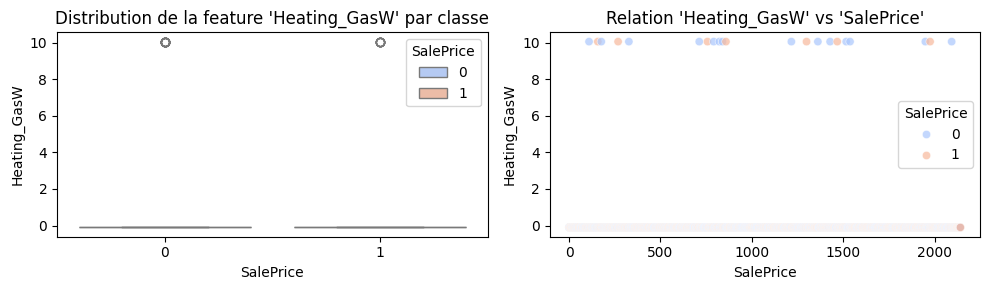

Heating_Grav vs SalePrice : -0.02


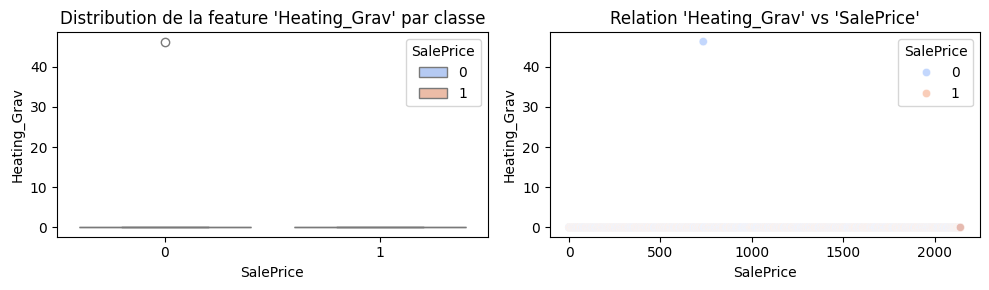

Heating_OthW vs SalePrice : -0.02


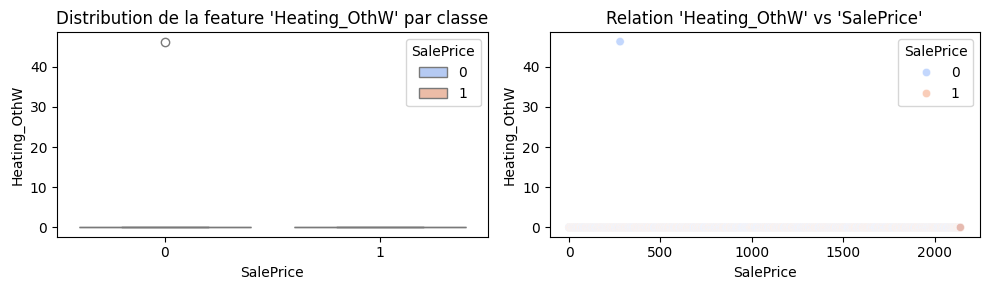

Heating QC_Fa vs SalePrice : -0.08


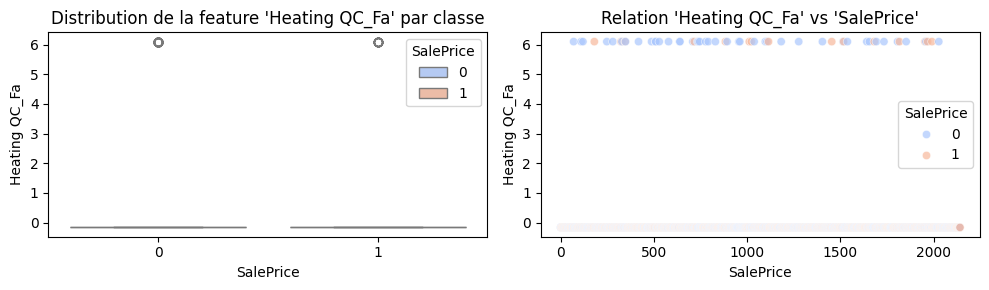

Heating QC_Gd vs SalePrice : -0.10


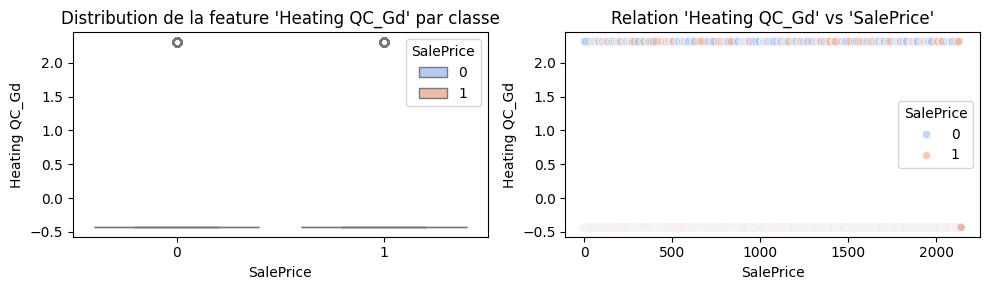

Heating QC_Po vs SalePrice : -0.03


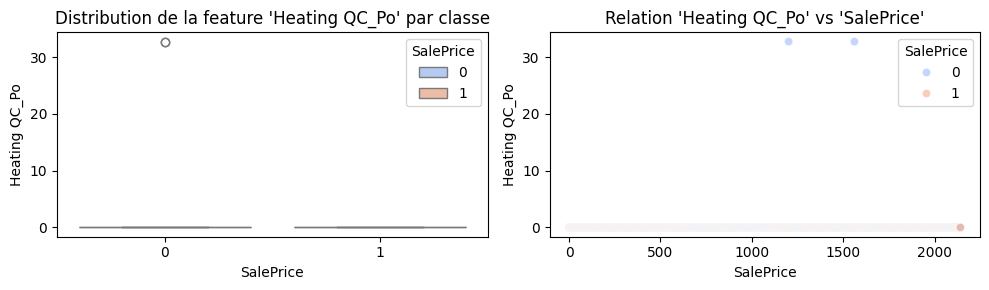

Heating QC_TA vs SalePrice : -0.38


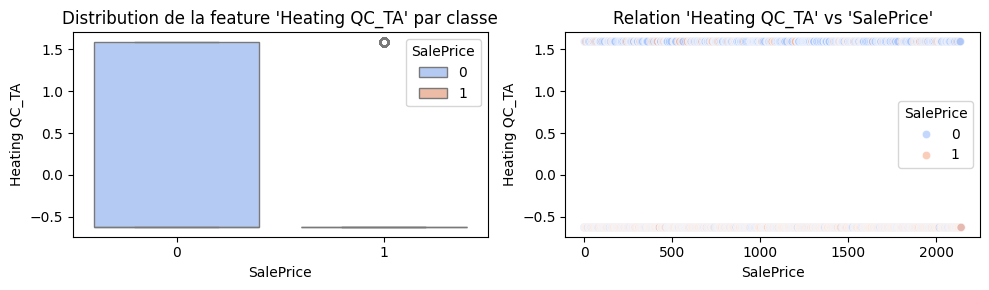

Central Air_Y vs SalePrice : 0.19


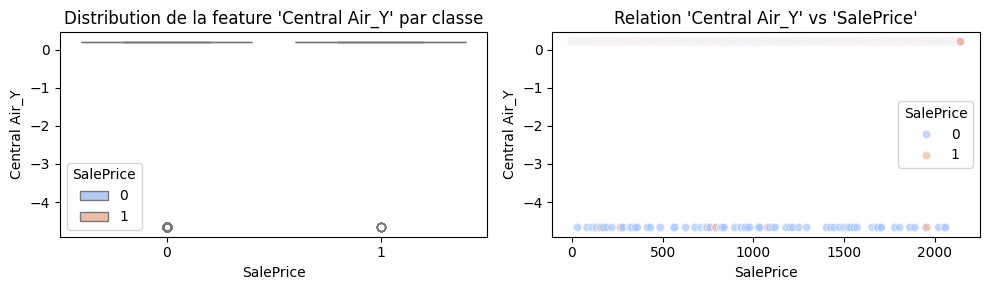

Electrical_FuseF vs SalePrice : -0.10


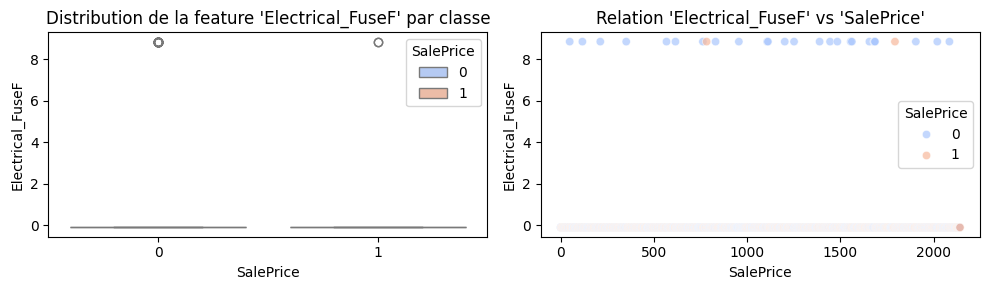

Electrical_FuseP vs SalePrice : -0.05


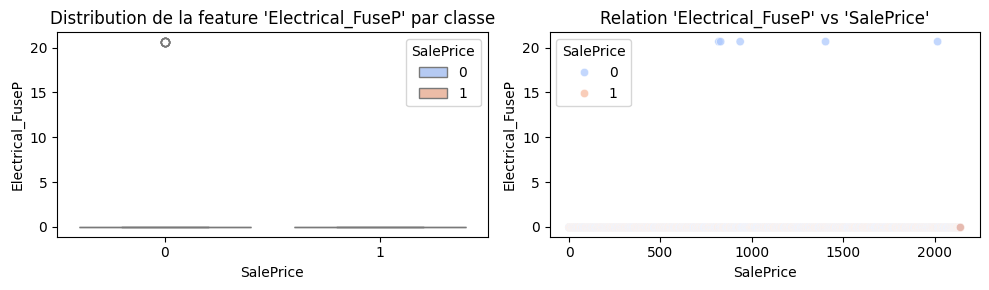

Electrical_Mix vs SalePrice : -0.02


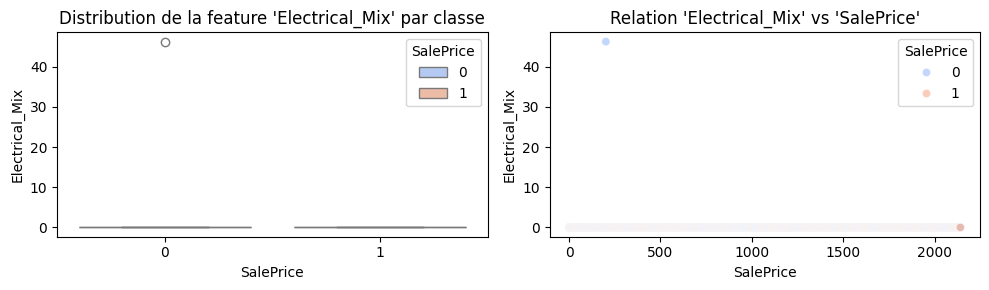

Electrical_SBrkr vs SalePrice : 0.25


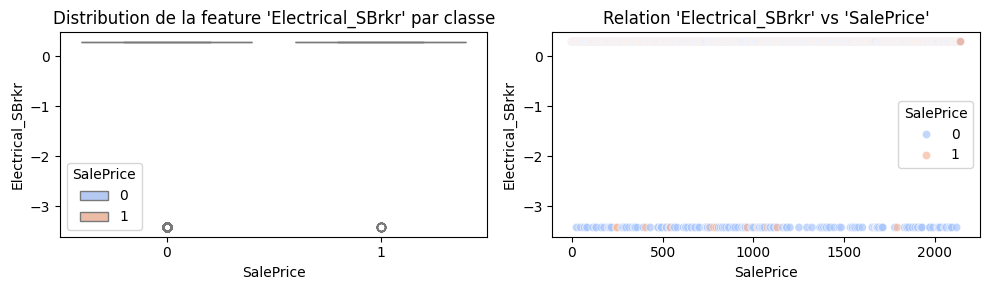

Kitchen Qual_Fa vs SalePrice : -0.12


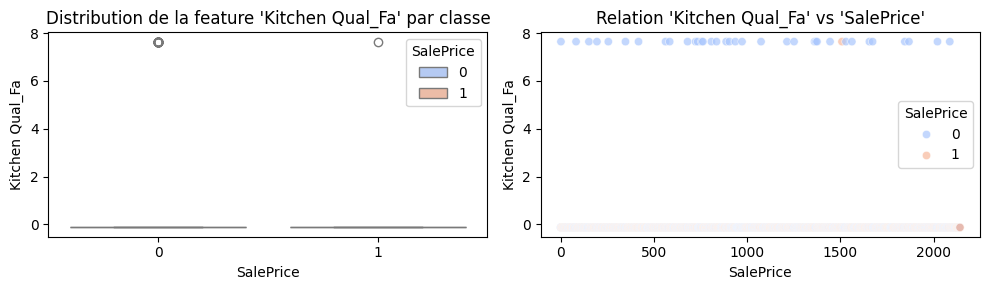

Kitchen Qual_Gd vs SalePrice : 0.46


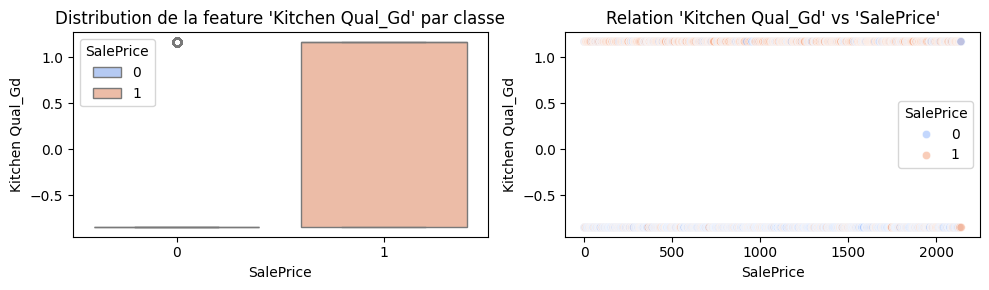

Kitchen Qual_Po vs SalePrice : -0.02


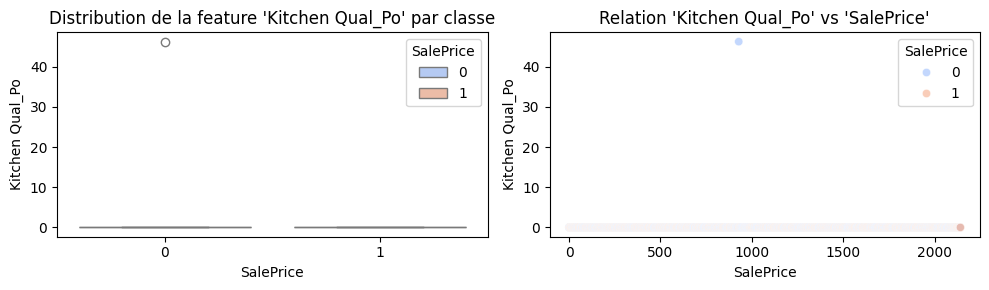

Kitchen Qual_TA vs SalePrice : -0.55


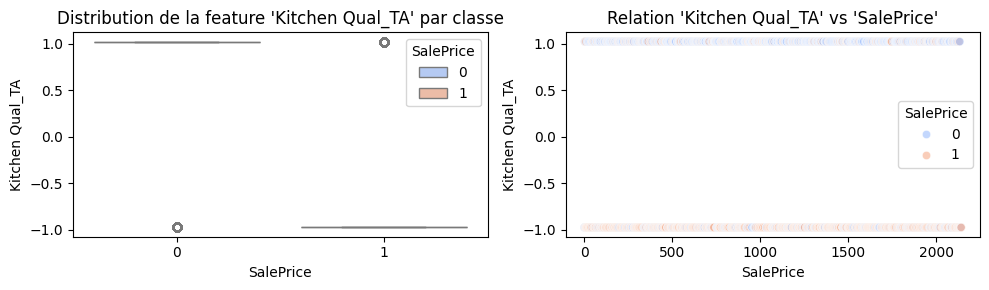

Functional_Maj2 vs SalePrice : -0.04


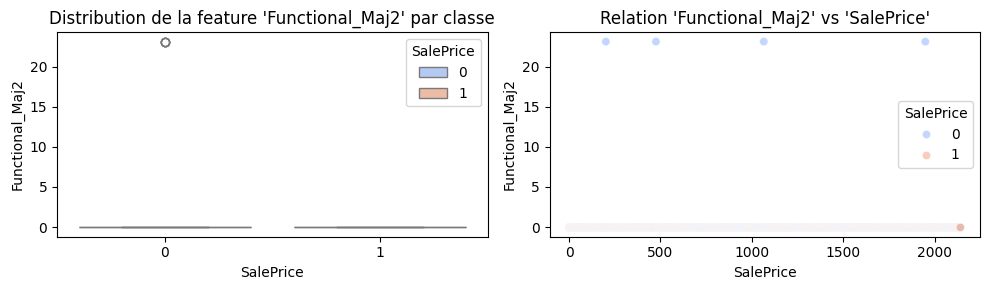

Functional_Min1 vs SalePrice : -0.05


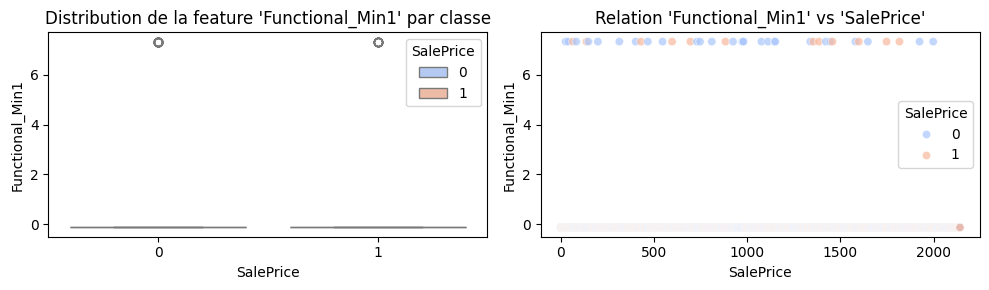

Functional_Min2 vs SalePrice : -0.03


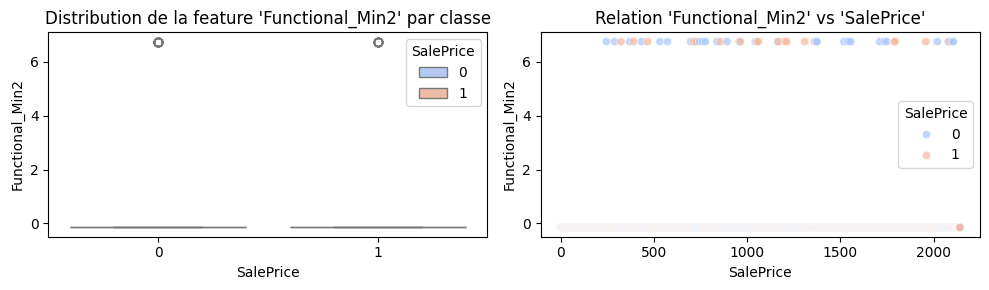

Functional_Mod vs SalePrice : -0.04


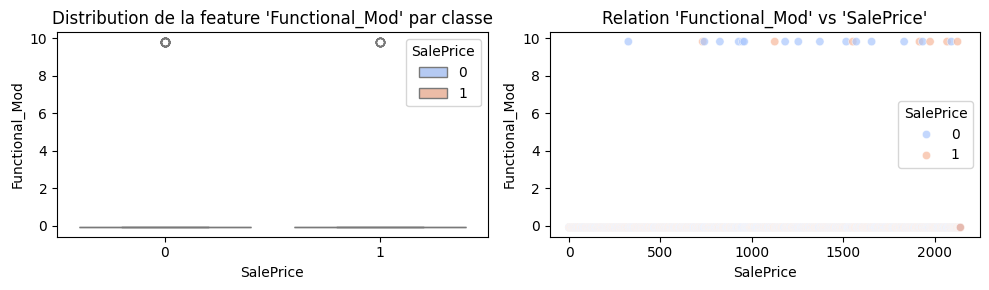

Functional_Sal vs SalePrice : -0.02


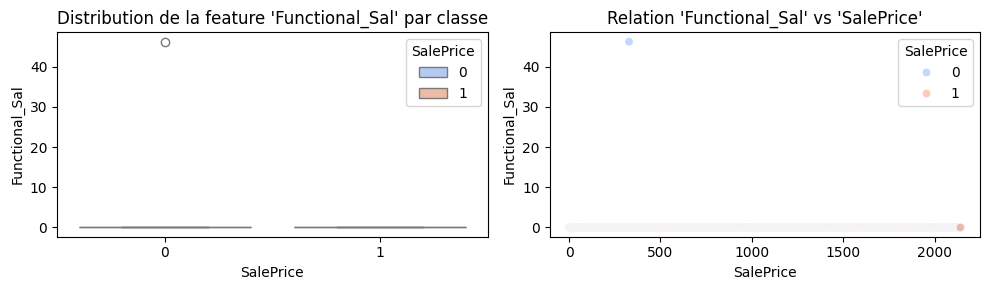

Functional_Sev vs SalePrice : -0.02


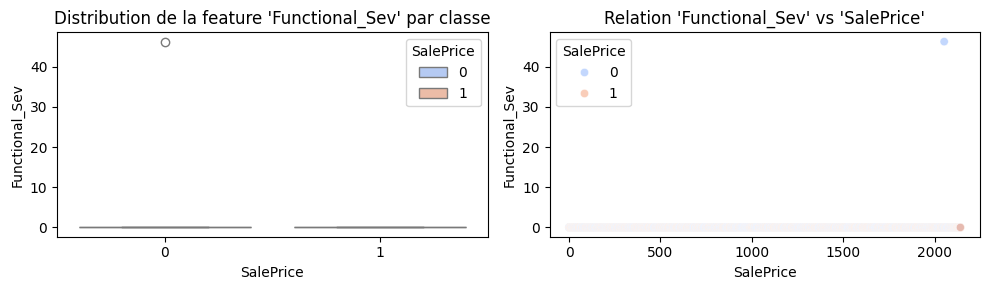

Functional_Typ vs SalePrice : 0.09


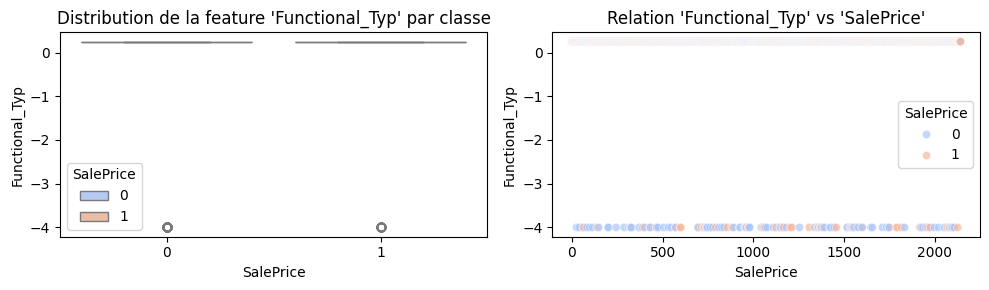

Garage Type_Attchd vs SalePrice : 0.36


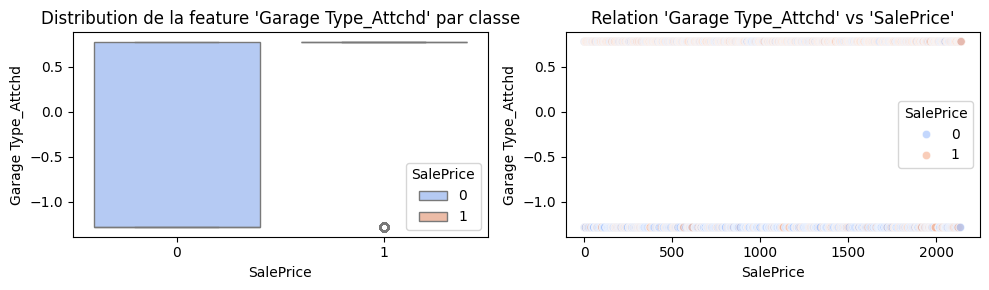

Garage Type_Basment vs SalePrice : -0.07


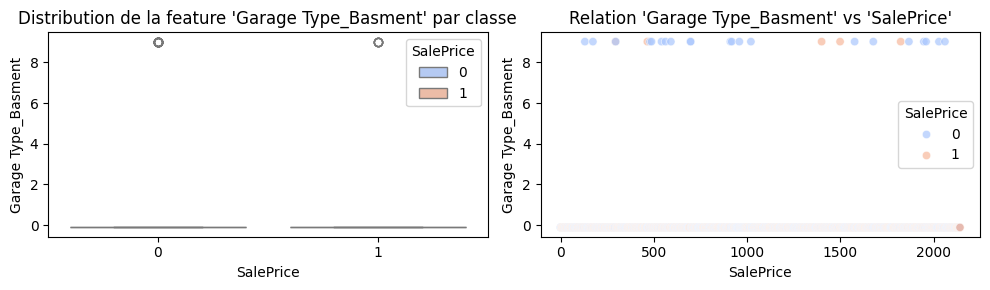

Garage Type_BuiltIn vs SalePrice : 0.21


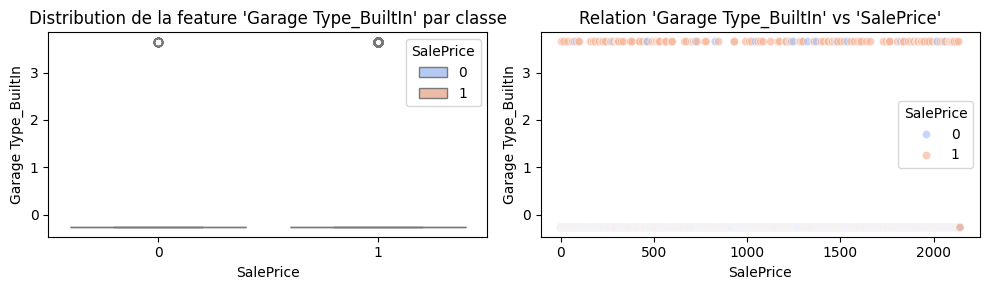

Garage Type_CarPort vs SalePrice : -0.08


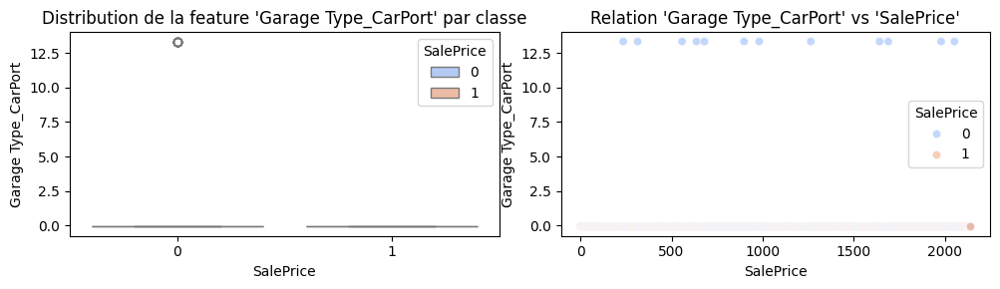

Garage Type_Detchd vs SalePrice : -0.47


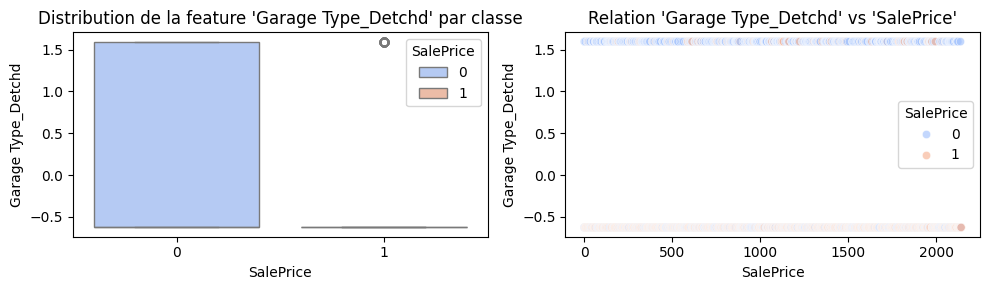

Garage Finish_RFn vs SalePrice : 0.25


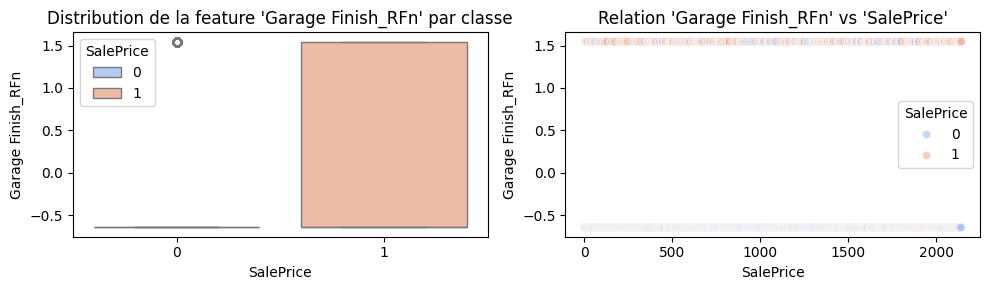

Garage Finish_Unf vs SalePrice : -0.56


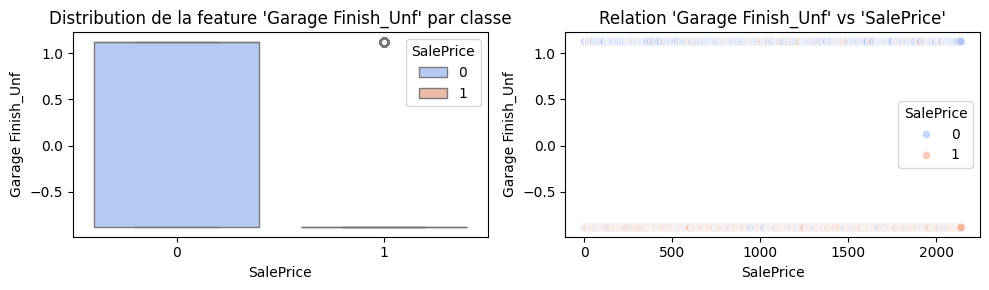

Garage Qual_Fa vs SalePrice : -0.18


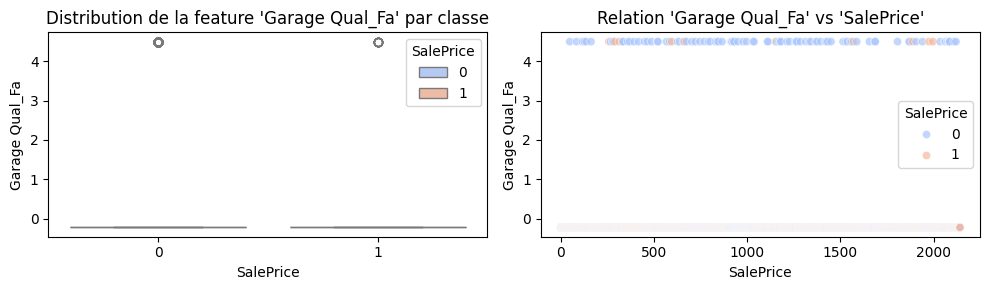

Garage Qual_Gd vs SalePrice : 0.05


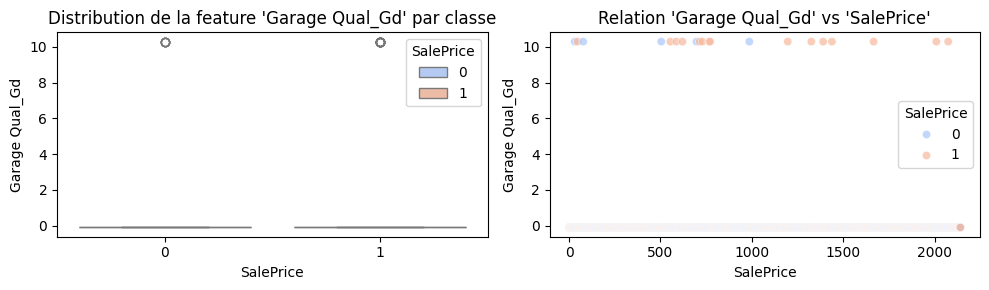

Garage Qual_Po vs SalePrice : -0.04


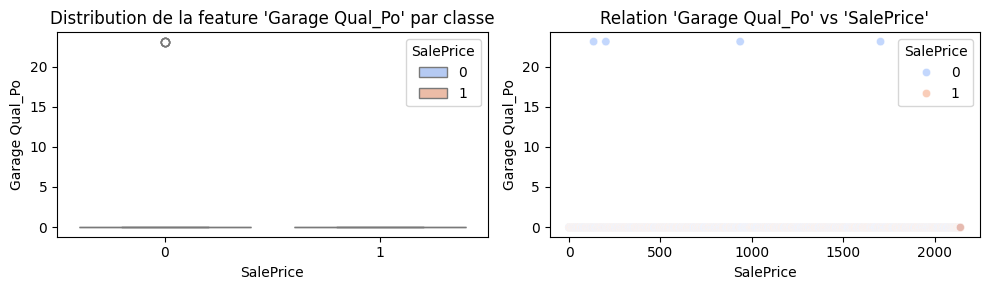

Garage Qual_TA vs SalePrice : 0.15


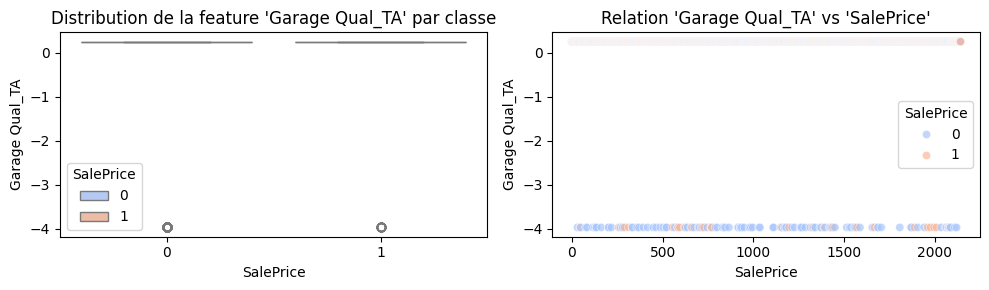

Garage Cond_Fa vs SalePrice : -0.15


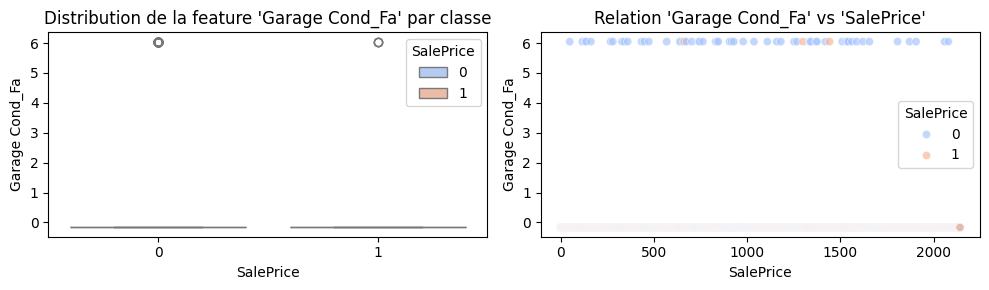

Garage Cond_Gd vs SalePrice : -0.01


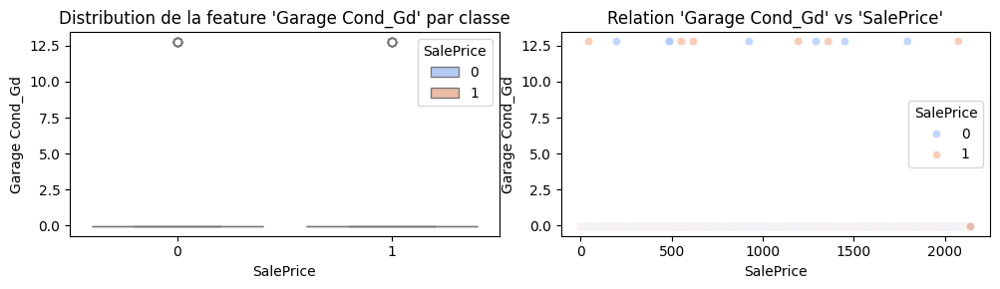

Garage Cond_Po vs SalePrice : -0.06


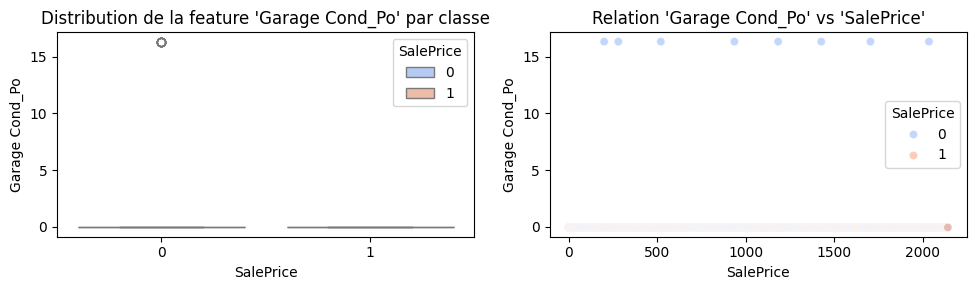

Garage Cond_TA vs SalePrice : 0.15


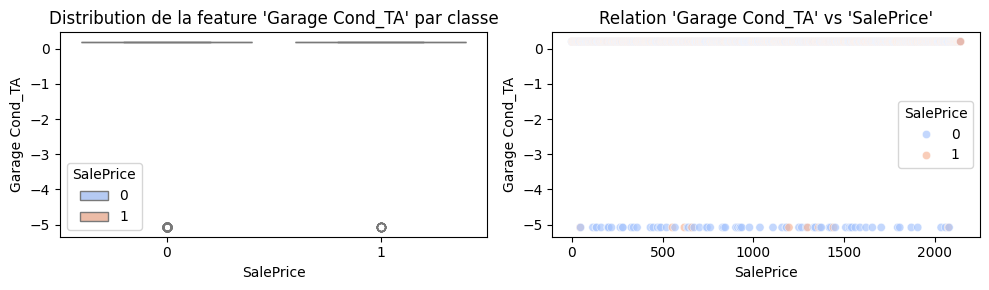

Paved Drive_P vs SalePrice : -0.09


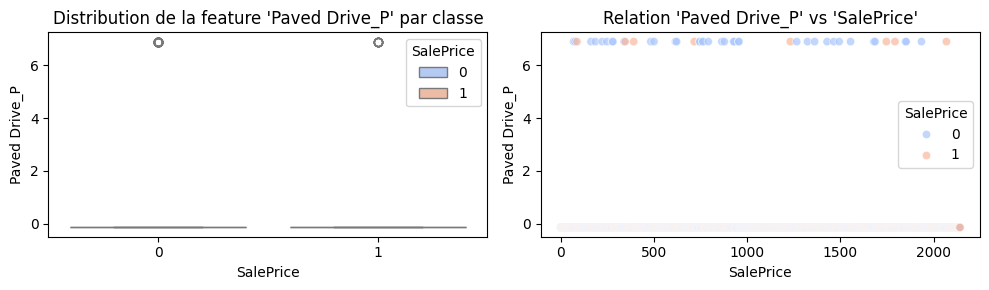

Paved Drive_Y vs SalePrice : 0.20


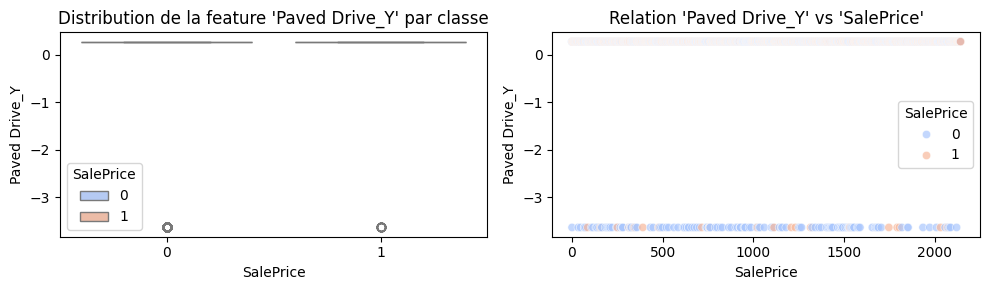

Sale Type_CWD vs SalePrice : -0.00


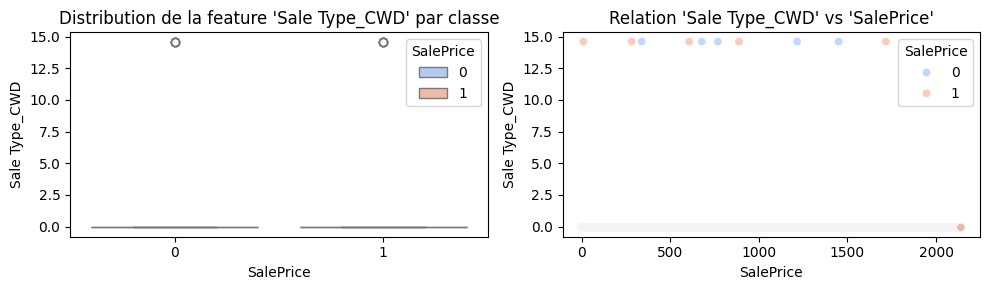

Sale Type_Con vs SalePrice : 0.02


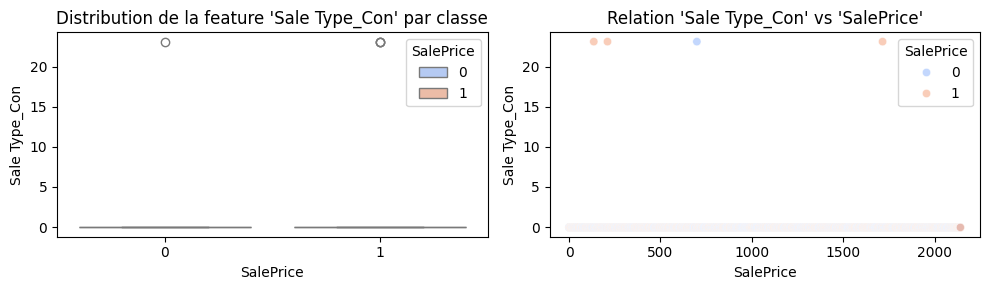

Sale Type_ConLD vs SalePrice : -0.04


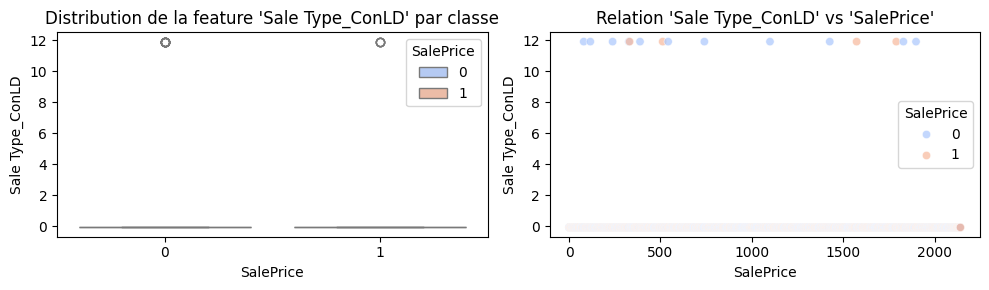

Sale Type_ConLI vs SalePrice : -0.03


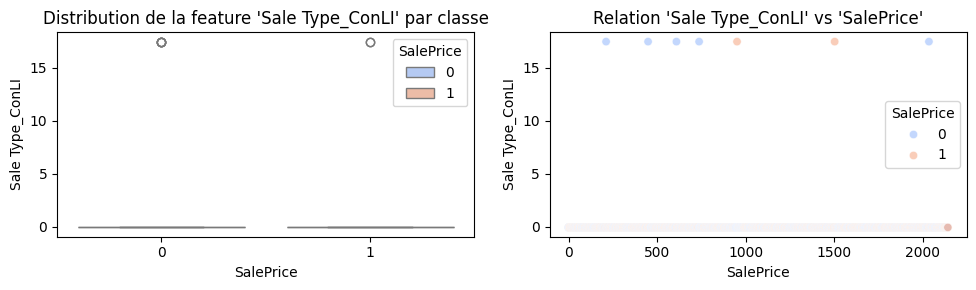

Sale Type_ConLw vs SalePrice : -0.02


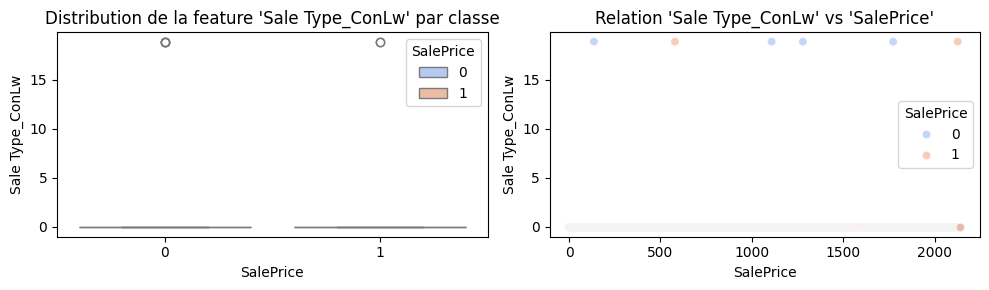

Sale Type_New vs SalePrice : 0.26


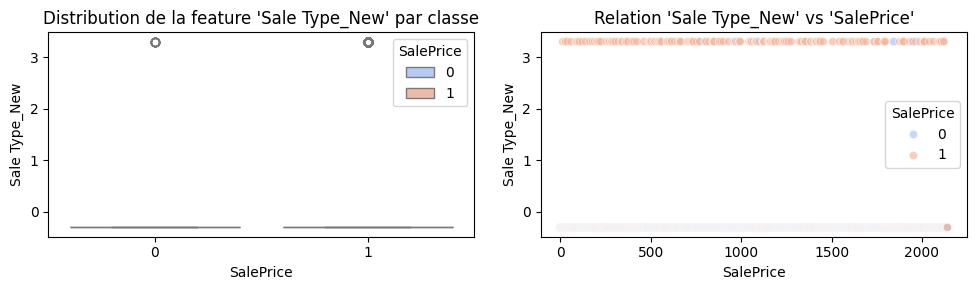

Sale Type_Oth vs SalePrice : -0.03


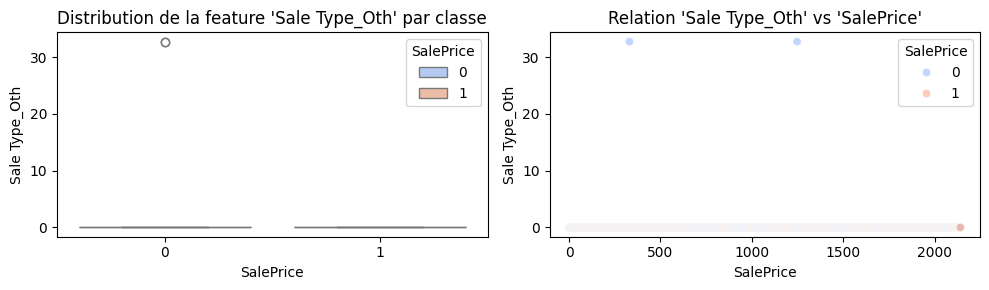

Sale Type_VWD vs SalePrice : -0.02


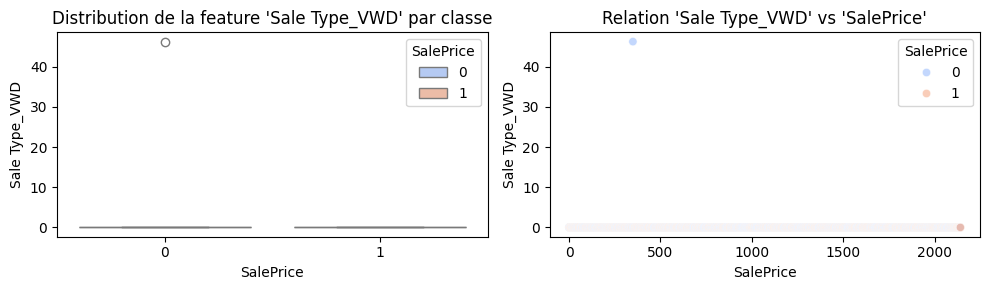

Sale Type_WD  vs SalePrice : -0.13


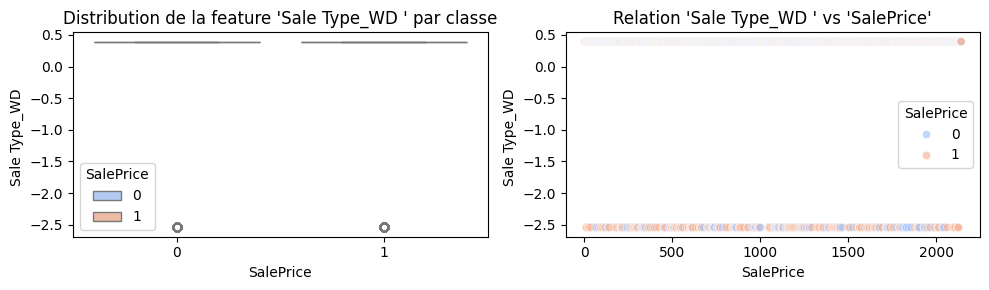

Sale Condition_AdjLand vs SalePrice : -0.05


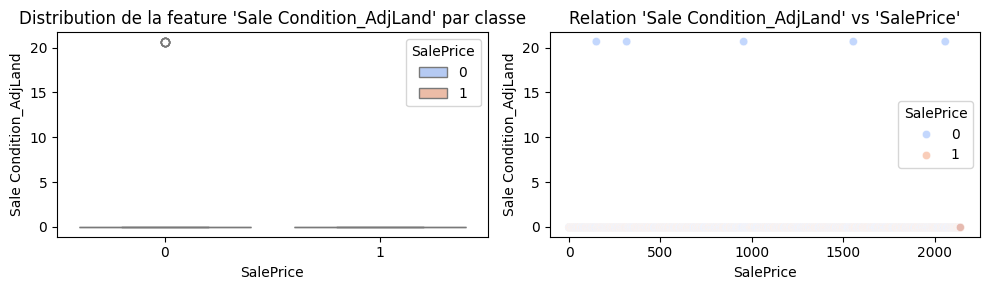

Sale Condition_Alloca vs SalePrice : -0.02


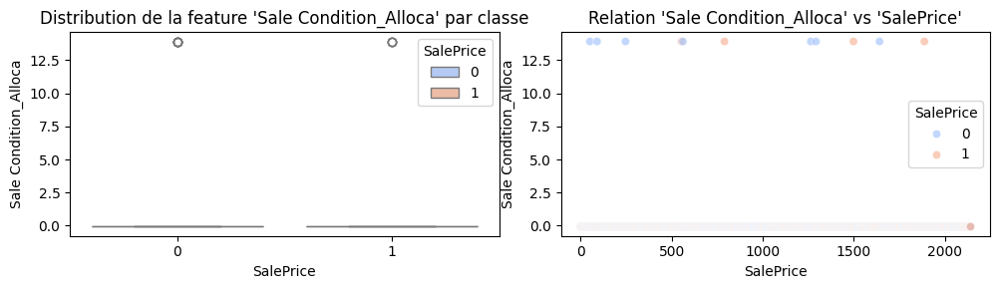

Sale Condition_Family vs SalePrice : -0.04


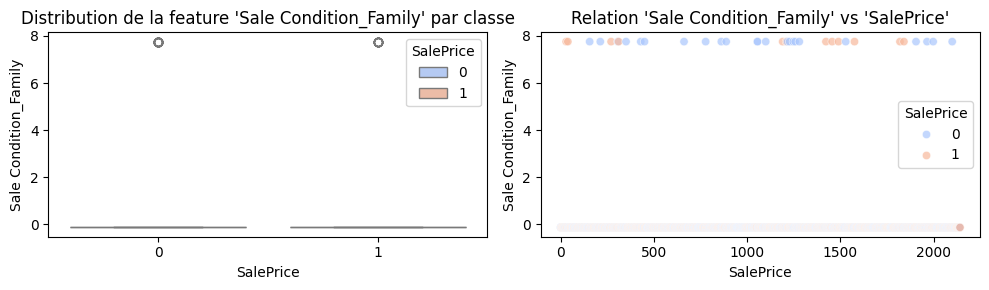

Sale Condition_Normal vs SalePrice : -0.09


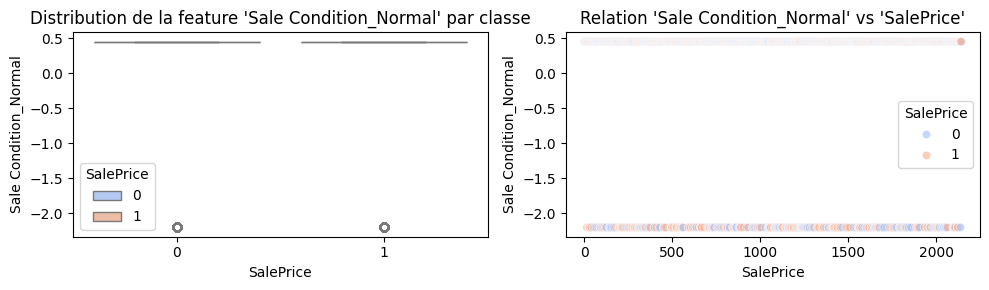

Sale Condition_Partial vs SalePrice : 0.25


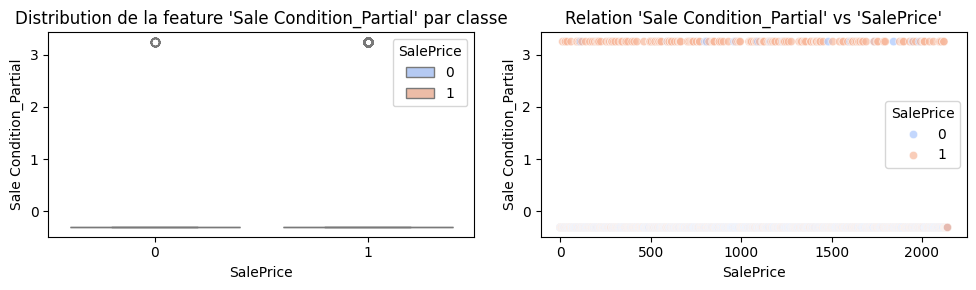

In [ ]:
# Visualisation des variables
features = [col for col in data_train_class.columns if col != 'SalePrice']
target = 'SalePrice'

for var in features:
    # Corrélation Variable~Cible
    corr_value = data_train_class[[var, target]].corr().iloc[0, 1]
    print(f'{var} vs {target} : {corr_value:.2f}')

    # Figure : Boxplot+Scatter
    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 3))

    # Boxplot de la distribution de la variable selon les classes
    sns.boxplot(data=data_train_class, x=target, y=var, hue=target, palette="coolwarm", ax=axes[0])
    axes[0].set_title(f"Distribution de la feature '{var}' par classe", fontsize=12)
    axes[0].set_xlabel(target, fontsize=10)
    axes[0].set_ylabel(var, fontsize=10)

    # Nuage de points Variable~Cible
    sns.scatterplot(data=data_train_class, x=range(len(data_train_class)), y=var, hue=target, palette='coolwarm', ax=axes[1], alpha=0.7)
    # sns.scatterplot(data=data_train_class, x=target, y=var, hue=target, palette="viridis", ax=axes[1], alpha=0.7)
    axes[1].set_title(f"Relation '{var}' vs '{target}'", fontsize=12)
    axes[1].set_xlabel(target, fontsize=10)
    axes[1].set_ylabel(var, fontsize=10)

    plt.tight_layout()
    plt.show()


In [ ]:
# Calcul des corrélations avec la cible
correlations = data_train_class.corr()
correlations = correlations['SalePrice'].sort_values(key=abs, ascending=False)
print(correlations)

SalePrice               1.000000
Overall Qual            0.682804
Full Bath               0.639098
Exter Qual_TA          -0.613229
Gr Liv Area             0.591118
                          ...   
Sale Type_CWD          -0.000703
Condition 1_RRNn       -0.000629
Condition 1_RRNe       -0.000544
Exterior 2nd_AsphShn   -0.000314
Exterior 1st_BrkComm   -0.000314
Name: SalePrice, Length: 237, dtype: float64


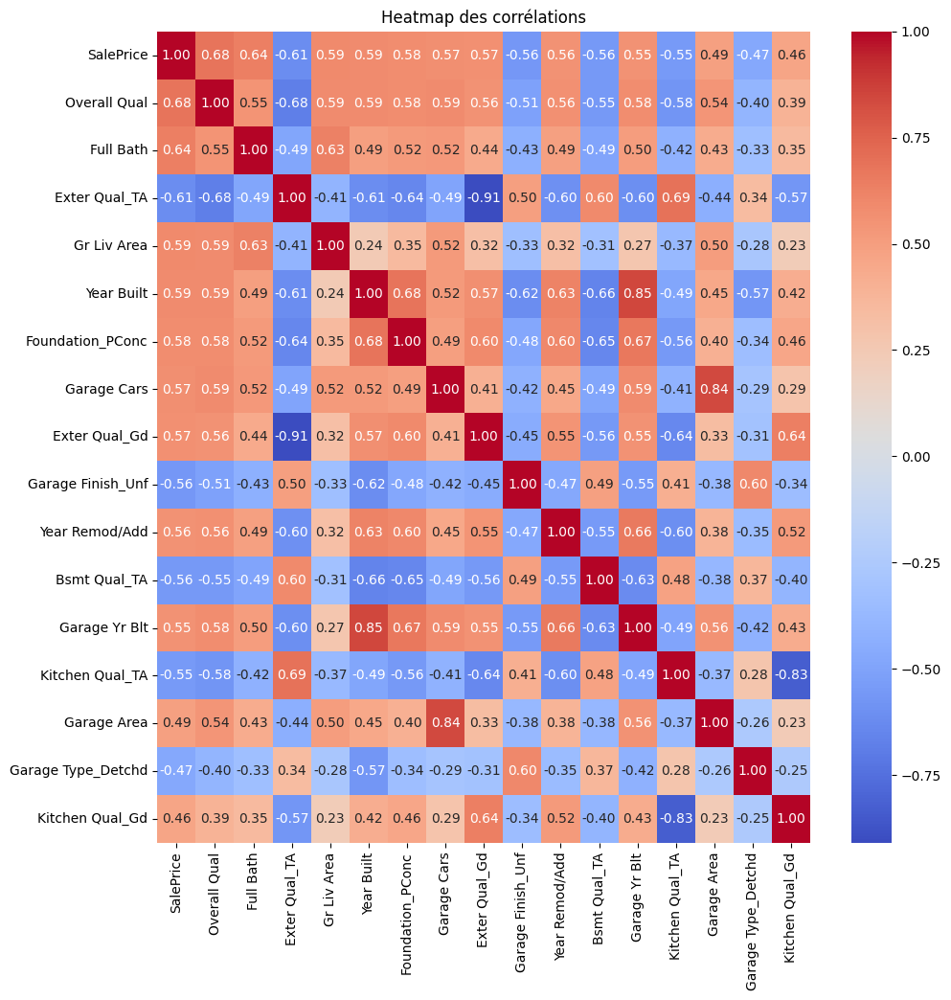

In [ ]:
# Filtre des variables dont la corrélation avec SalePrice est sup à +/-0.6
correlations_filtered = correlations[correlations.abs() > 0.45]
variables_to_plot = correlations_filtered.index
correlation_matrix_filtered = data_train_class[variables_to_plot].corr()

# Création de la heatmap
plt.figure(figsize=(11, 11))
sns.heatmap(correlation_matrix_filtered, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Heatmap des corrélations')
plt.show()

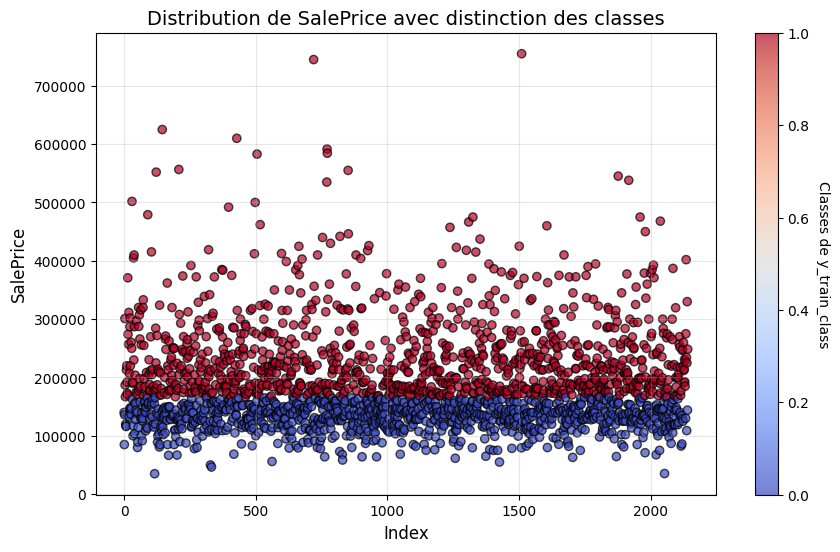

In [ ]:
# Nuage de points de SalePrice
plt.figure(figsize=(10, 6))
scatter = plt.scatter(range(len(y_train_reg)), y_train_reg, c=y_train_class, cmap='coolwarm', alpha=0.7, edgecolor='k')

# Ajouter une barre de couleur pour la légende
cbar = plt.colorbar(scatter)
cbar.set_label('Classes de y_train_class', rotation=270, labelpad=15)

# Titres et légendes
plt.title('Distribution de SalePrice avec distinction des classes', fontsize=14)
plt.xlabel('Index', fontsize=12)
plt.ylabel('SalePrice', fontsize=12)
plt.grid(alpha=0.3)

plt.show()


## Modèles de classification

### Régression logistique

In [ ]:
# Fitting du modèle
LgR = LogisticRegression(random_state=rs)
LgR.fit(X_train_scaled, y_train_class)

# Prédiction et évaluation
y_lgr = LgR.predict(X_test_scaled)
accuracy_lgr = accuracy_score(y_test_class, y_lgr)
precision_lgr = precision_score(y_test_class, y_lgr)
auc_lgr = roc_auc_score(y_test_class, y_lgr)

print("-- REGRESSION LOGISTIQUE --")
print(f"Accuracy : {accuracy_lgr:.3f}")
print(f"Précision : {precision_lgr:.3f}")
print(f"AUC : {auc_lgr:.3f}")


-- REGRESSION LOGISTIQUE --
Accuracy : 0.914
Précision : 0.889
AUC : 0.915


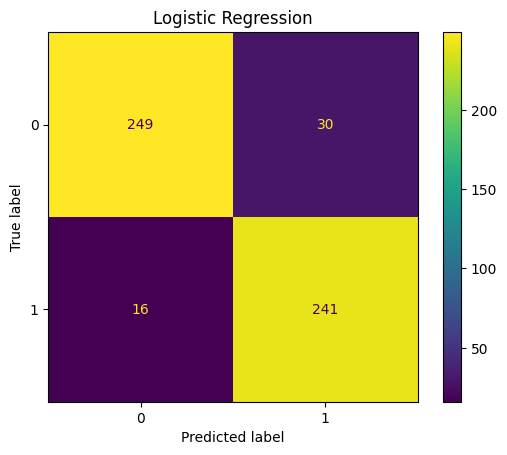

In [ ]:
# Matrice de confusion
cm = confusion_matrix(y_test_class, y_lgr)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot()
plt.title('Logistic Regression')
plt.show()


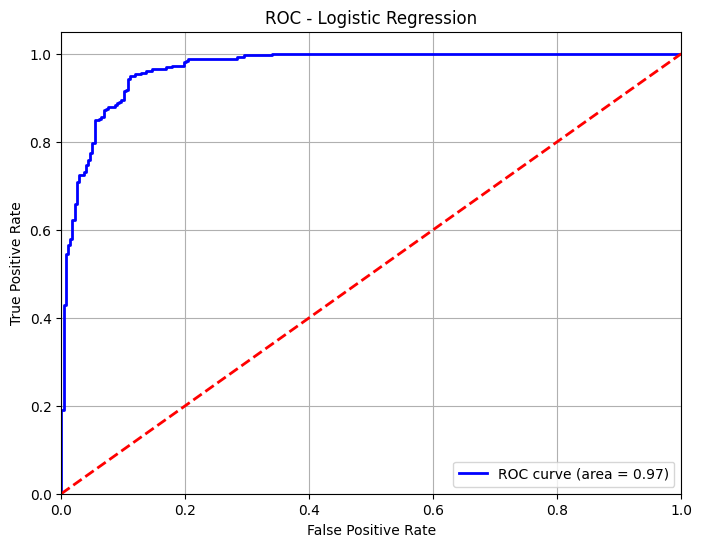

In [ ]:
# Courbe ROC
y_proba = LgR.predict_proba(X_test_scaled)[:, 1]
fpr, tpr, thresholds = roc_curve(y_test_class, y_proba)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC - Logistic Regression')
plt.legend(loc="lower right")
plt.grid()
plt.show()


### Ridge

In [ ]:
# Fitting du modèle
Ridge_class = RidgeClassifier(random_state=rs)
Ridge_class.fit(X_train_scaled, y_train_class)

# Prédiction et évaluation
y_ridge = Ridge_class.predict(X_test_scaled)
accuracy_ridge = accuracy_score(y_test_class, y_ridge)
precision_ridge = precision_score(y_test_class, y_ridge)
auc_ridge = roc_auc_score(y_test_class, y_ridge)

print("-- RIDGE CLASSIFIER --")
print(f"Accuracy : {accuracy_ridge:.3f}")
print(f"Précision : {precision_ridge:.3f}")
print(f"AUC : {auc_ridge:.3f}")

-- RIDGE CLASSIFIER --
Accuracy : 0.903
Précision : 0.887
AUC : 0.903


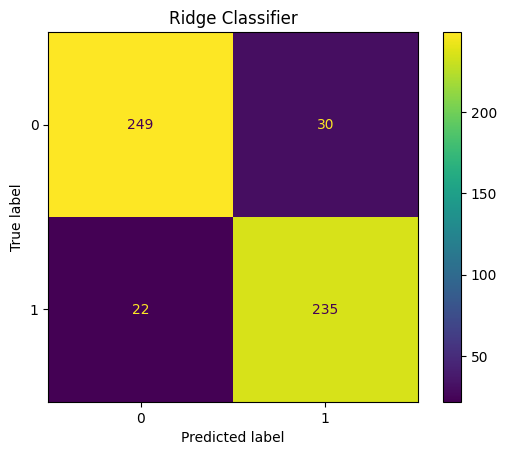

In [ ]:
# Matrice de confusion
cm = confusion_matrix(y_test_class, y_ridge)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot()
plt.title('Ridge Classifier')
plt.show()

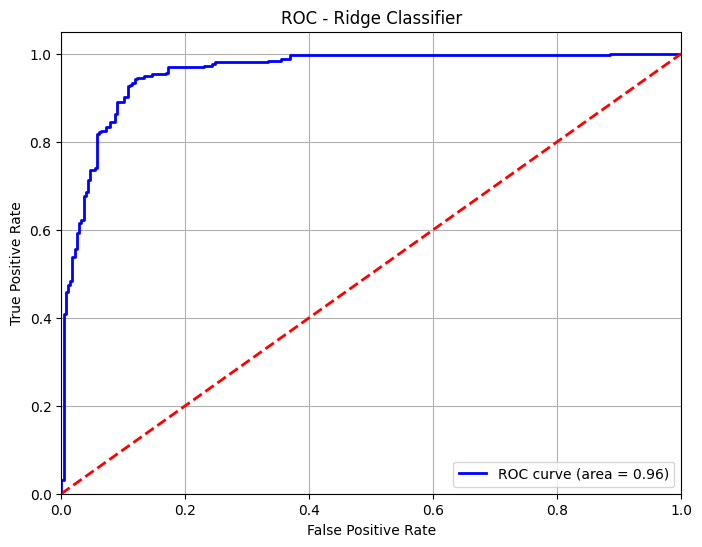

In [ ]:
# Courbe ROC
y_proba = Ridge_class.decision_function(X_test_scaled)
fpr, tpr, thresholds = roc_curve(y_test_class, y_proba)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC - Ridge Classifier')
plt.legend(loc="lower right")
plt.grid()
plt.show()

### Lasso

In [ ]:
# Fitting du modèle
Lasso_class = LogisticRegression(random_state=rs, penalty='l1', solver='liblinear')
Lasso_class.fit(X_train_scaled, y_train_class)

# Prédiction et évaluation
y_lasso = Lasso_class.predict(X_test_scaled)
accuracy_lasso = accuracy_score(y_test_class, y_lasso)
precision_lasso = precision_score(y_test_class, y_lasso)
auc_lasso = roc_auc_score(y_test_class, y_lasso)

print("-- LASSO CLASSIFIER --")
print(f"Accuracy : {accuracy_lasso:.3f}")
print(f"Précision : {precision_lasso:.3f}")
print(f"AUC : {auc_lasso:.3f}")

-- LASSO CLASSIFIER --
Accuracy : 0.920
Précision : 0.893
AUC : 0.921


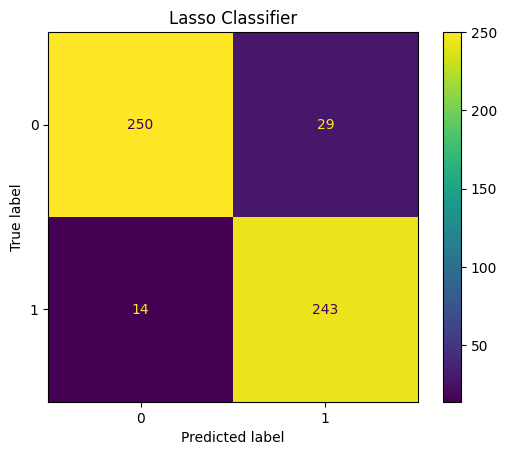

In [ ]:
# Matrice de confusion
cm = confusion_matrix(y_test_class, y_lasso)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot()
plt.title('Lasso Classifier')
plt.show()


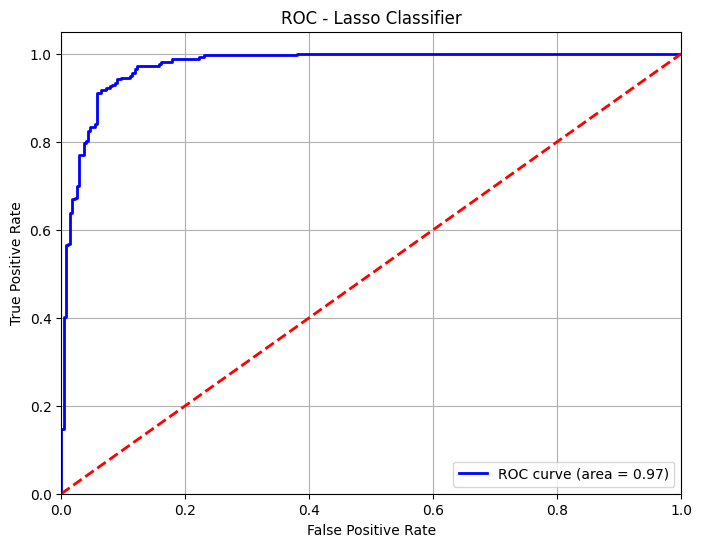

In [ ]:
# Courbe ROC
y_proba = Lasso_class.predict_proba(X_test_scaled)[:, 1]
fpr, tpr, thresholds = roc_curve(y_test_class, y_proba)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC - Lasso Classifier')
plt.legend(loc="lower right")
plt.grid()
plt.show()

### Arbre de décision

In [ ]:
# Définir la grille d'hyperparamètres
param_grid = {
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 10, 20],
    'min_samples_leaf': [1, 10, 15, 20, 25]
}

# Utiliser GridSearchCV pour trouver les meilleurs hyperparamètres
grid_search_tree = GridSearchCV(estimator=DecisionTreeClassifier(random_state=rs), param_grid=param_grid, cv=5, scoring='accuracy')
grid_search_tree.fit(X_train_scaled, y_train_class)

# Afficher les meilleurs hyperparamètres
print("-- ARBRE DE DECISION AVEC GRID SEARCH --")
print(f"Meilleurs paramètres : {grid_search_tree.best_params_}")

# Utiliser les meilleurs hyperparamètres pour le modèle final
Tree_class = grid_search_tree.best_estimator_

# Prédiction et évaluation
y_tree = Tree_class.predict(X_test_scaled)
accuracy_tree = accuracy_score(y_test_class, y_tree)
precision_tree = precision_score(y_test_class, y_tree)
auc_tree = roc_auc_score(y_test_class, y_tree)

print(f"Accuracy : {accuracy_tree:.3f}")
print(f"Précision : {precision_tree:.3f}")
print(f"AUC : {auc_tree:.3f}")


-- ARBRE DE DECISION AVEC GRID SEARCH --
Meilleurs paramètres : {'max_depth': None, 'min_samples_leaf': 20, 'min_samples_split': 2}
Accuracy : 0.875
Précision : 0.874
AUC : 0.875


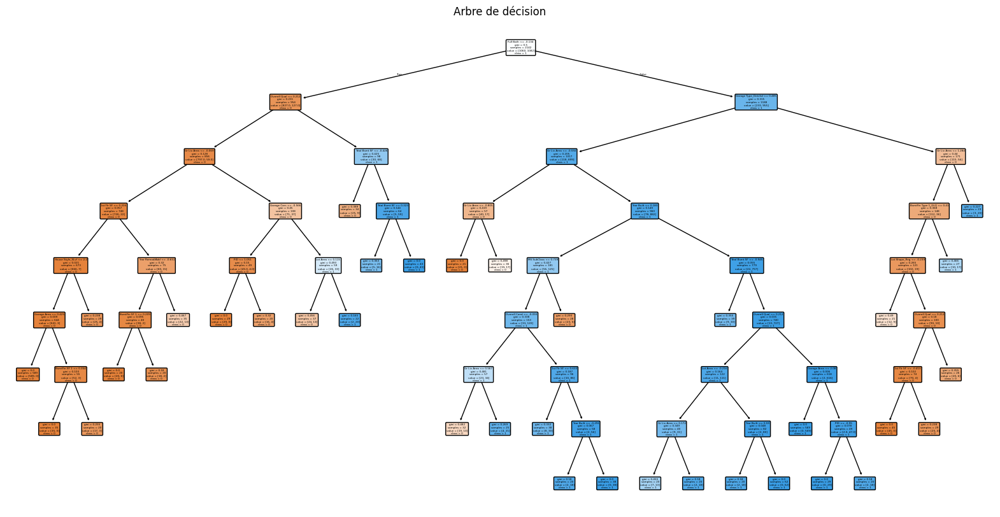

In [ ]:
# Affichage de l'arbre
plt.figure(figsize=(20, 10))
plot_tree(Tree_class, filled=True, feature_names=X_train.columns, class_names=['0', '1'], rounded=True)
plt.title('Arbre de décision')
plt.show()

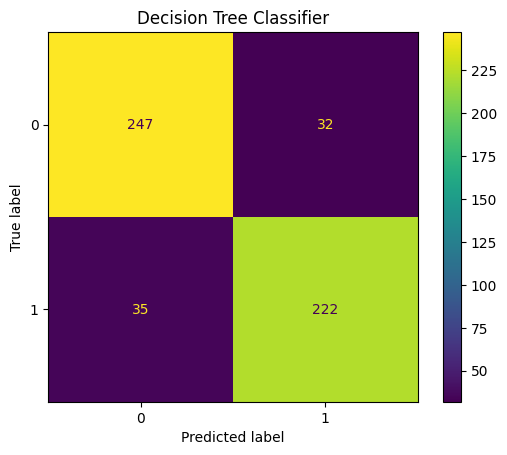

In [ ]:
# Matrice de confusion
cm = confusion_matrix(y_test_class, y_tree)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot()
plt.title('Decision Tree Classifier')
plt.show()


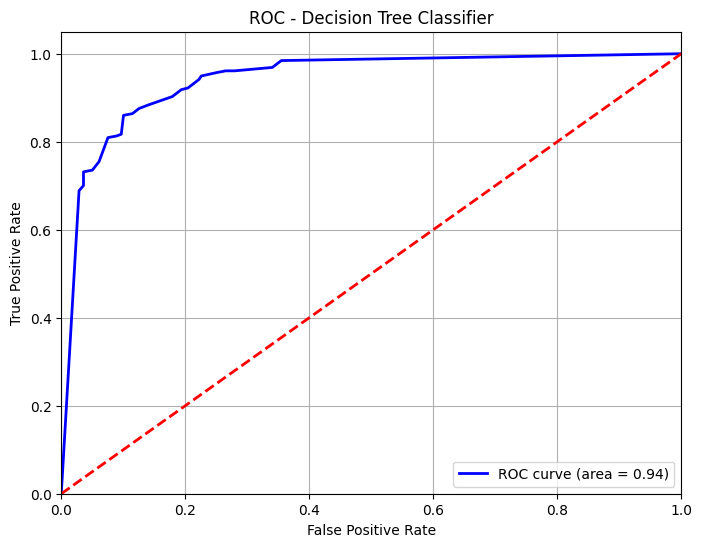

In [ ]:
# Courbe ROC
y_proba = Tree_class.predict_proba(X_test_scaled)[:, 1]
fpr, tpr, thresholds = roc_curve(y_test_class, y_proba)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC - Decision Tree Classifier')
plt.legend(loc="lower right")
plt.grid()
plt.show()

### Forêt aléatoire

In [ ]:
# Définition des hyperparamètres à tester
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['sqrt', 'log2']
}

# Recherche des meilleurs hyperparamètres avec GridSearchCV
grid_search = GridSearchCV(estimator=RandomForestClassifier(random_state=rs), param_grid=param_grid, cv=5, scoring='accuracy', verbose=2, n_jobs=-1)
grid_search.fit(X_train_scaled, y_train_class)

# Affichage des meilleurs hyperparamètres
print(f"Meilleurs hyperparamètres : {grid_search.best_params_}")

# Utilisation du meilleur modèle
RF = grid_search.best_estimator_

# Prédiction et évaluation
y_rf = RF.predict(X_test_scaled)
accuracy_rf = accuracy_score(y_test_class, y_rf)
precision_rf = precision_score(y_test_class, y_rf)
auc_rf = roc_auc_score(y_test_class, y_rf)

print("-- RANDOM FOREST --")
print(f"Accuracy : {accuracy_rf:.3f}")
print(f"Precision : {precision_rf:.3f}")
print(f"AUC : {auc_rf:.3f}")


Fitting 5 folds for each of 216 candidates, totalling 1080 fits


c:\Users\prince.mezuirotimi\AppData\Local\Programs\Python\Python313\Lib\site-packages\numpy\ma\core.py:2881: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


Meilleurs hyperparamètres : {'max_depth': 20, 'max_features': 'sqrt', 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 100}
-- RANDOM FOREST --
Accuracy : 0.924
Precision : 0.919
AUC : 0.923


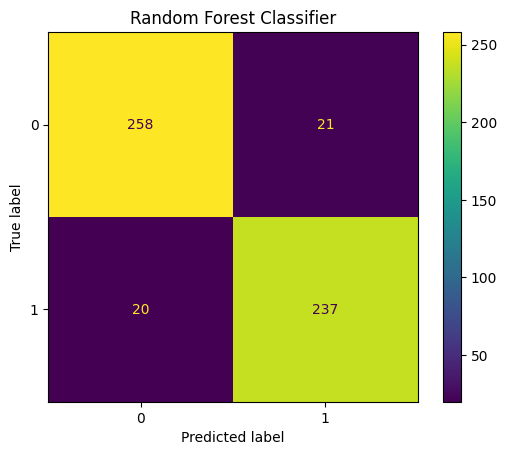

In [ ]:
# Affichage de la matrice de confusion
cm = confusion_matrix(y_test_class, y_rf)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot()
plt.title('Random Forest Classifier')
plt.show()


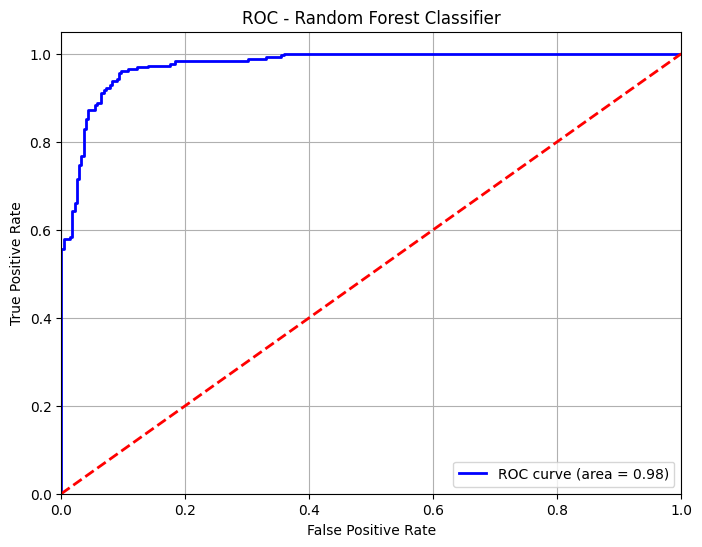

In [ ]:
# Courbe ROC
y_proba = RF.predict_proba(X_test_scaled)[:, 1]
fpr, tpr, thresholds = roc_curve(y_test_class, y_proba)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC - Random Forest Classifier')
plt.legend(loc="lower right")
plt.grid()
plt.show()

### K plus proches voisins

In [ ]:
# Définition des hyperparamètres à tester
param_grid = {
    'n_neighbors': [3, 5, 11, 15],
    'weights': ['uniform', 'distance']
}

# Recherche des meilleurs hyperparamètres
grid_search = GridSearchCV(estimator=KNeighborsClassifier(), param_grid=param_grid, cv=5, scoring='accuracy', verbose=2, n_jobs=-1)
grid_search.fit(X_train_scaled, y_train_class)

# Affichage des meilleurs hyperparamètres
print(f"Meilleurs hyperparamètres : {grid_search.best_params_}")

# Utilisation du meilleur modèle
KNN = grid_search.best_estimator_

# Prédiction et évaluation
y_knn = KNN.predict(X_test_scaled)
accuracy_knn = accuracy_score(y_test_class, y_knn)
precision_knn = precision_score(y_test_class, y_knn)
auc_knn = roc_auc_score(y_test_class, y_knn)

print("-- KNN --")
print(f"Accuracy : {accuracy_knn:.3f}")
print(f"Précision : {precision_knn:.3f}")
print(f"AUC : {auc_knn:.3f}")


Fitting 5 folds for each of 8 candidates, totalling 40 fits
Meilleurs hyperparamètres : {'n_neighbors': 11, 'weights': 'distance'}
-- KNN --
Accuracy : 0.888
Précision : 0.902
AUC : 0.887


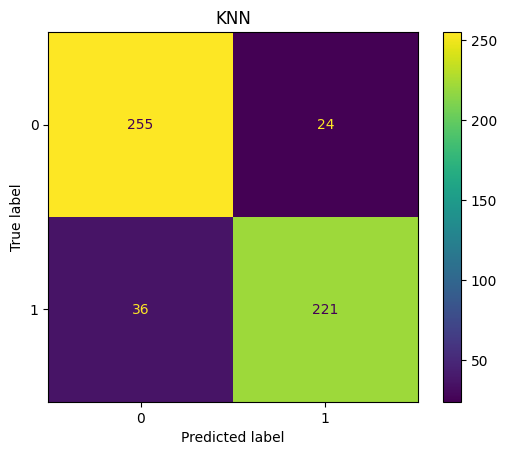

In [ ]:
# Matrice de confusion
cm = confusion_matrix(y_test_class, y_knn)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot()
plt.title('KNN')
plt.show()

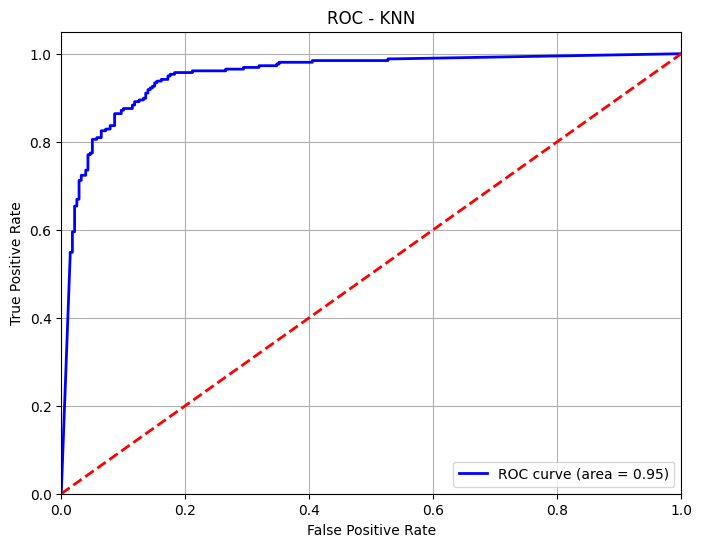

In [ ]:
# Courbe ROC
y_proba = KNN.predict_proba(X_test_scaled)[:, 1]
fpr, tpr, thresholds = roc_curve(y_test_class, y_proba)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC - KNN')
plt.legend(loc="lower right")
plt.grid()
plt.show()

### Machine à vecteurs de support

In [ ]:
# Définition des hyperparamètres à tester
param_grid = {
    'C': [0.01, 0.1, 1, 10, 100],
    'kernel': ['linear', 'rbf'],
    'gamma': ['scale', 'auto'],
}

# Recherche des meilleurs hyperparamètres
grid_search = GridSearchCV(estimator=SVC(probability=True, random_state=rs), param_grid=param_grid, cv=5, scoring='accuracy', verbose=2, n_jobs=-1)
grid_search.fit(X_train_scaled, y_train_class)
print(f"Meilleurs hyperparamètres : {grid_search.best_params_}")

# Utilisation du meilleur modèle
SVC = grid_search.best_estimator_

# Prédiction et évaluation
y_svc = SVC.predict(X_test_scaled)
accuracy_svc = accuracy_score(y_test_class, y_svc)
precision_svc = precision_score(y_test_class, y_svc)
auc_svc = roc_auc_score(y_test_class, SVC.predict_proba(X_test_scaled)[:, 1])

print("-- SUPPORT VECTOR CLASSIFIER --")
print(f"Accuracy : {accuracy_svc:.3f}")
print(f"Précision : {precision_svc:.3f}")
print(f"AUC : {auc_svc:.3f}")


Fitting 5 folds for each of 20 candidates, totalling 100 fits
Meilleurs hyperparamètres : {'C': 0.01, 'gamma': 'scale', 'kernel': 'linear'}
-- SUPPORT VECTOR CLASSIFIER --
Accuracy : 0.922
Précision : 0.900
AUC : 0.975


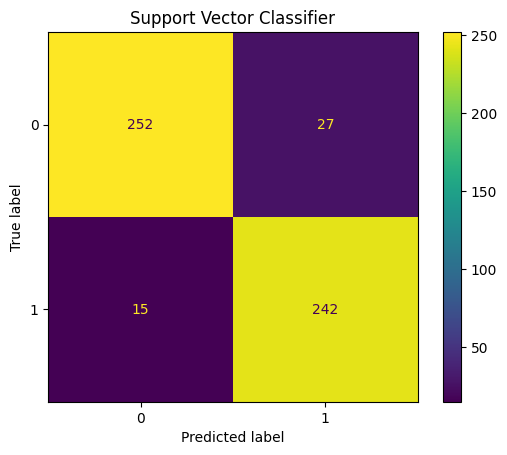

In [ ]:
# Matrice de confusion
cm = confusion_matrix(y_test_class, y_svc)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot()
plt.title('Support Vector Classifier')
plt.show()

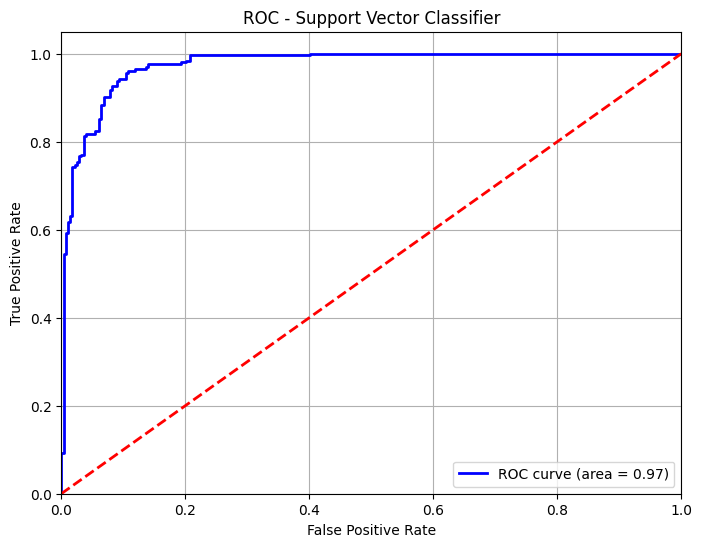

In [ ]:
# Courbe ROC
y_proba = SVC.predict_proba(X_test_scaled)[:, 1]
fpr, tpr, thresholds = roc_curve(y_test_class, y_proba)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC - Support Vector Classifier')
plt.legend(loc="lower right")
plt.grid()
plt.show()

### Adaboost

In [ ]:
# Initialisation de l'estimateur AdaBoost
base_estimator = DecisionTreeClassifier(max_depth=None, min_samples_leaf=20, min_samples_split=2, random_state=rs, class_weight='balanced') # on choisira comme estimateur l'arbre de décision paramétré comme ci-dessus
estimator_ada = AdaBoostClassifier(estimator=base_estimator, algorithm='SAMME', random_state=rs)

# Grille de recherche pour les hyperparamètres
param_grid = {
    'n_estimators': [50, 100, 250],
    'learning_rate': [0.1, 1, 10],
    'estimator__max_depth': [1, 5, 10]
}

# Recherche des meilleurs hyperparamètres avec GridSearchCV
grid_search = GridSearchCV(estimator=estimator_ada, param_grid=param_grid, cv=5, scoring='accuracy', verbose=2, n_jobs=-1)
grid_search.fit(X_train_scaled, y_train_class)

# Meilleurs hyperparamètres trouvés
print("Meilleurs hyperparamètres :", grid_search.best_params_)

# Évaluation du modèle sur les données de test
ADA = grid_search.best_estimator_

# Prédiction et évaluation
y_ada = ADA.predict(X_test_scaled)
accuracy_ada = accuracy_score(y_test_class, y_ada)
precision_ada = precision_score(y_test_class, y_ada)
auc_ada = roc_auc_score(y_test_class, y_ada)

# Résultats
print("-- ADA BOOST --")
print(f"Accuracy : {accuracy_ada:.3f}")
print(f"Precision : {precision_ada:.3f}")
print(f"AUC : {auc_ada:.3f}")



Fitting 5 folds for each of 27 candidates, totalling 135 fits
Meilleurs hyperparamètres : {'estimator__max_depth': 5, 'learning_rate': 1, 'n_estimators': 100}
-- ADA BOOST --
Accuracy : 0.931
Precision : 0.914
AUC : 0.932


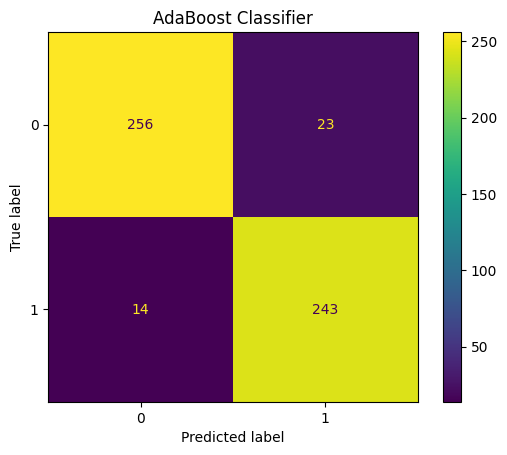

In [ ]:
# Matrice de confusion
cm = confusion_matrix(y_test_class, y_ada)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot()
plt.title('AdaBoost Classifier')
plt.show()


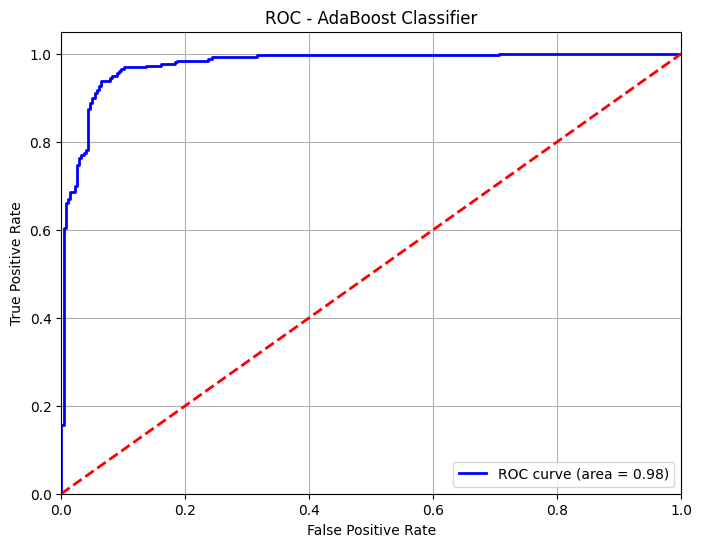

In [ ]:
# Courbe ROC
y_proba = ADA.predict_proba(X_test_scaled)[:, 1]
fpr, tpr, thresholds = roc_curve(y_test_class, y_proba)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC - AdaBoost Classifier')
plt.legend(loc="lower right")
plt.grid()

### Gradient boosting

In [ ]:
# Grille de recherche pour les hyperparamètres
param_grid_gb = {
    'n_estimators': [100, 250, 300],
    'learning_rate': [0.01, 0.1, 0.5],
    'max_depth': [3, 5, 7],
    'min_samples_split': [2, 10, 20],
    'min_samples_leaf': [1, 3, 5]
}

# Recherche des meilleurs hyperparamètres avec GridSearchCV
grid_search_gb = GridSearchCV(estimator=GradientBoostingClassifier(random_state=rs), param_grid=param_grid_gb, cv=5, scoring='accuracy', verbose=2, n_jobs=-1)
grid_search_gb.fit(X_train_scaled, y_train_class)

# Meilleurs hyperparamètres trouvés
print("Meilleurs hyperparamètres :", grid_search_gb.best_params_)

# Évaluation du modèle sur les données de test
GB = grid_search_gb.best_estimator_

# Prédiction et évaluation
y_gb = GB.predict(X_test_scaled)
accuracy_gb = accuracy_score(y_test_class, y_gb)
precision_gb = precision_score(y_test_class, y_gb)
auc_gb = roc_auc_score(y_test_class, y_gb)

# Résultats
print("-- GRADIENT BOOSTING --")
print(f"Accuracy : {accuracy_gb:.3f}")
print(f"Precision : {precision_gb:.3f}")
print(f"AUC : {auc_gb:.3f}")


Fitting 5 folds for each of 243 candidates, totalling 1215 fits
Meilleurs hyperparamètres : {'learning_rate': 0.1, 'max_depth': 3, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 250}
-- GRADIENT BOOSTING --
Accuracy : 0.944
Precision : 0.925
AUC : 0.945


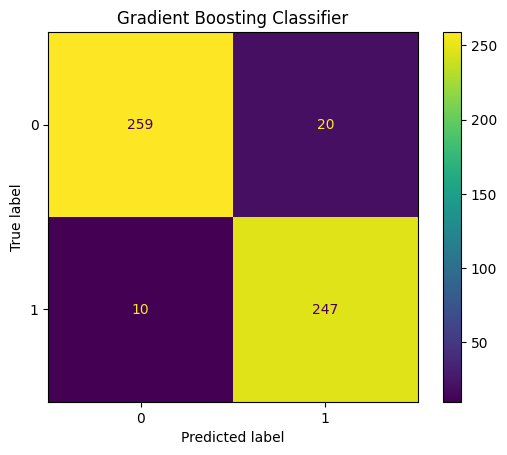

In [ ]:
# Matrice de confusion
cm = confusion_matrix(y_test_class, y_gb)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot()
plt.title('Gradient Boosting Classifier')
plt.show()


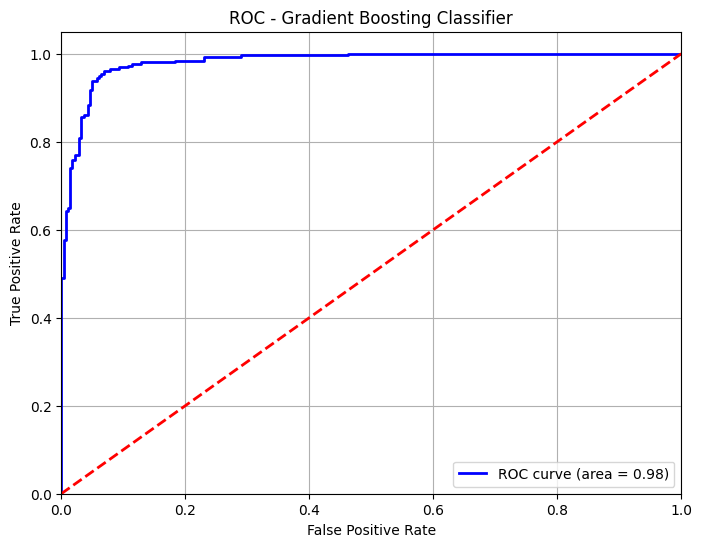

In [ ]:
# Courbe ROC
y_proba = GB.predict_proba(X_test_scaled)[:, 1]
fpr, tpr, thresholds = roc_curve(y_test_class, y_proba)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC - Gradient Boosting Classifier')
plt.legend(loc="lower right")
plt.grid()
plt.show()

### XGBoosting

In [ ]:
# Grille de recherche pour les hyperparamètres
param_grid_xgb = {
    'n_estimators': [100, 250, 500],
    'learning_rate': [0.01, 0.1, 0.3],
    'max_depth': [3, 5, 7]
}

# Recherche des meilleurs hyperparamètres avec GridSearchCV
grid_search_xgb = GridSearchCV(estimator=XGBClassifier(random_state=rs), param_grid=param_grid_xgb, cv=5, scoring='accuracy', verbose=2, n_jobs=-1)
grid_search_xgb.fit(X_train_scaled, y_train_class)

# Meilleurs hyperparamètres trouvés
print("Meilleurs hyperparamètres :", grid_search_xgb.best_params_)

# Évaluation du modèle sur les données de test
XGB = grid_search_xgb.best_estimator_

# Prédiction et évaluation
y_xgb = XGB.predict(X_test_scaled)
accuracy_xgb = accuracy_score(y_test_class, y_xgb)
precision_xgb = precision_score(y_test_class, y_xgb)
auc_xgb = roc_auc_score(y_test_class, y_xgb)

# Résultats
print("-- XGBOOST --")
print(f"Accuracy : {accuracy_xgb:.3f}")
print(f"Precision : {precision_xgb:.3f}")
print(f"AUC : {auc_xgb:.3f}")


Fitting 5 folds for each of 27 candidates, totalling 135 fits
Meilleurs hyperparamètres : {'learning_rate': 0.3, 'max_depth': 3, 'n_estimators': 250}
-- XGBOOST --
Accuracy : 0.938
Precision : 0.921
AUC : 0.939


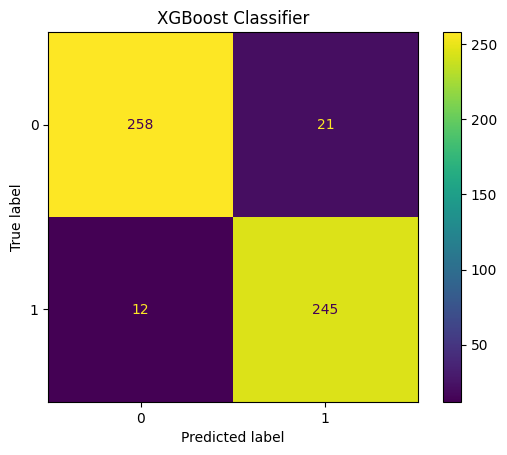

In [ ]:
# Matrice de confusion
cm = confusion_matrix(y_test_class, y_xgb)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot()
plt.title('XGBoost Classifier')
plt.show()


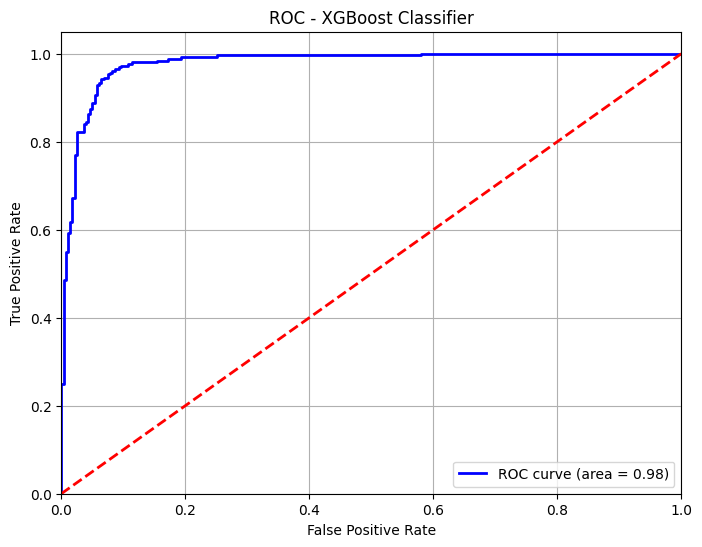

In [ ]:
# Courbe ROC
y_proba = XGB.predict_proba(X_test_scaled)[:, 1]
fpr, tpr, thresholds = roc_curve(y_test_class, y_proba)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC - XGBoost Classifier')
plt.legend(loc="lower right")
plt.grid()
plt.show()

## Sélection du meilleur modèle

In [ ]:
# Résumé des métriques des modèles
metrics_class = {
    'Modèle': ['Régression logistique', 'Ridge', 'Arbre de décision', 'Random Forest', 'KNN', 'SVC', 'AdaBoost', 'Gradient Boosting', 'XGBoost'],
    'Accuracy': [accuracy_lgr, accuracy_ridge, accuracy_tree, accuracy_rf, accuracy_knn, accuracy_svc, accuracy_ada, accuracy_gb, accuracy_xgb],
    'Précision': [precision_lgr, precision_ridge, precision_tree, precision_rf, precision_knn, precision_svc, precision_ada, precision_gb, precision_xgb],
    'AUC': [auc_lgr, auc_ridge, auc_tree, auc_rf, auc_knn, auc_svc, auc_ada, auc_gb, auc_xgb]
}

# Création du DataFrame
metrics_class = pd.DataFrame(metrics_class)

# Affichage du tableau
metrics_class.round(3)

,Modèle,Accuracy,Précision,AUC
0,Régression logistique,0.914,0.889,0.915
1,Ridge,0.903,0.887,0.903
2,Arbre de décision,0.875,0.874,0.875
3,Random Forest,0.924,0.919,0.923
4,KNN,0.888,0.902,0.887
5,SVC,0.922,0.900,0.975
6,AdaBoost,0.931,0.914,0.932
7,Gradient Boosting,0.944,0.925,0.945
8,XGBoost,0.938,0.921,0.939
